# How to Get 97% Accuracy on the German Traffic Signs Validation Dataset

___
## First load the data

In [1]:
# Import pickle files of train, validation, and test sets:
import pickle
import numpy as np
import pandas as pd

training_file = 'traffic-signs-data/train.p'
validation_file = 'traffic-signs-data/valid.p'
testing_file = 'traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(validation_file, mode='rb') as f:
    valid = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_valid, y_valid = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']

# Load sign names:
sign_names = pd.read_csv('signnames.csv')[['ClassId', 'SignName']].values

# Save original sizes and bounding-box coordinates (this will help during preprocessing):
train_sizes= train['sizes']
train_coord = train['coords']

valid_sizes= valid['sizes']
valid_coord = valid['coords']

test_sizes= test['sizes']
test_coord = test['coords']

## Let's take a look at the basics

In [2]:
n_train = X_train.shape[0]
n_validation = X_valid.shape[0]
n_test = X_test.shape[0]
image_shape = X_train.shape[1:]
n_classes = len(np.unique(y_train))

print("Number of training examples =", n_train)
print("Number of validation examples =", n_validation)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 34799
Number of validation examples = 4410
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


## Now let's check out the distribution of classes for each set
I like looking at the numbers rather than a graph. I find it easier to ingest the information, so that's what I'll do.

In [3]:
a, b = np.unique(y_train, return_counts=True)
print('Training Data:')
for i in range(len(a)):
    print('{:.20} occurs {} times or {:.0f}% of total'.format(sign_names[a[i], 1], b[i], (b[i]/np.sum(b))*100))
print('')
a, b = np.unique(y_valid, return_counts=True)
print('Validation Data:')
for i in range(len(a)):
    print('{:.20} occurs {} times or {:.0f}% of total'.format(sign_names[a[i], 1], b[i], (b[i]/np.sum(b))*100))
print('')  
a, b = np.unique(y_test, return_counts=True)
print('Test Data:')
for i in range(len(a)):
    print('{:.30} occurs {} times or {:.0f}% of total'.format(sign_names[a[i], 1], b[i], (b[i]/np.sum(b))*100))

Training Data:
Speed limit (20km/h) occurs 180 times or 1% of total
Speed limit (30km/h) occurs 1980 times or 6% of total
Speed limit (50km/h) occurs 2010 times or 6% of total
Speed limit (60km/h) occurs 1260 times or 4% of total
Speed limit (70km/h) occurs 1770 times or 5% of total
Speed limit (80km/h) occurs 1650 times or 5% of total
End of speed limit ( occurs 360 times or 1% of total
Speed limit (100km/h occurs 1290 times or 4% of total
Speed limit (120km/h occurs 1260 times or 4% of total
No passing occurs 1320 times or 4% of total
No passing for vehic occurs 1800 times or 5% of total
Right-of-way at the  occurs 1170 times or 3% of total
Priority road occurs 1890 times or 5% of total
Yield occurs 1920 times or 6% of total
Stop occurs 690 times or 2% of total
No vehicles occurs 540 times or 2% of total
Vehicles over 3.5 me occurs 360 times or 1% of total
No entry occurs 990 times or 3% of total
General caution occurs 1080 times or 3% of total
Dangerous curve to t occurs 180 times o

Nothing too surprising. The distributions look similar. In all three sets, some signs occur more than others. Some of the notable ones are speed-limit, priority road, and yield signs.

## Time to look at actual signs
I'll start by printing 80 random signs from each set.

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

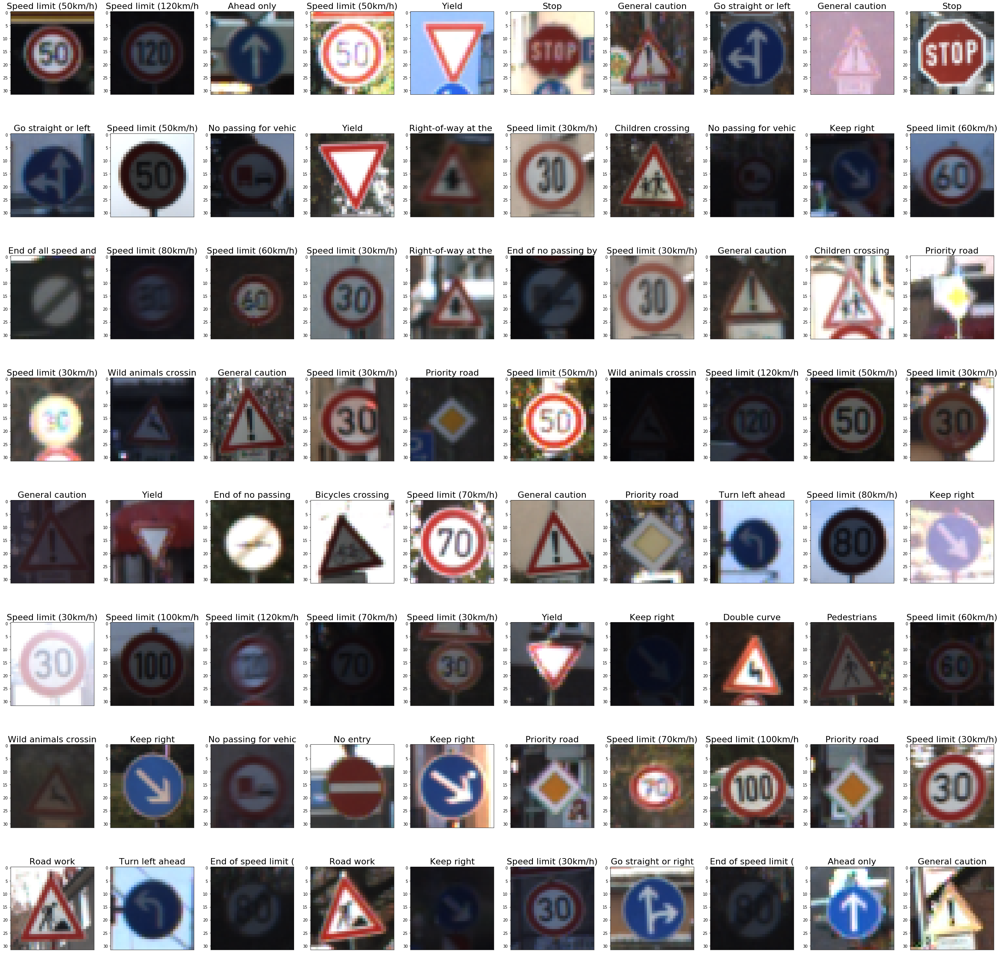

In [5]:
ii = 1
idx = np.arange(n_train)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.20}'.format(sign_names[y_train[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(X_train[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

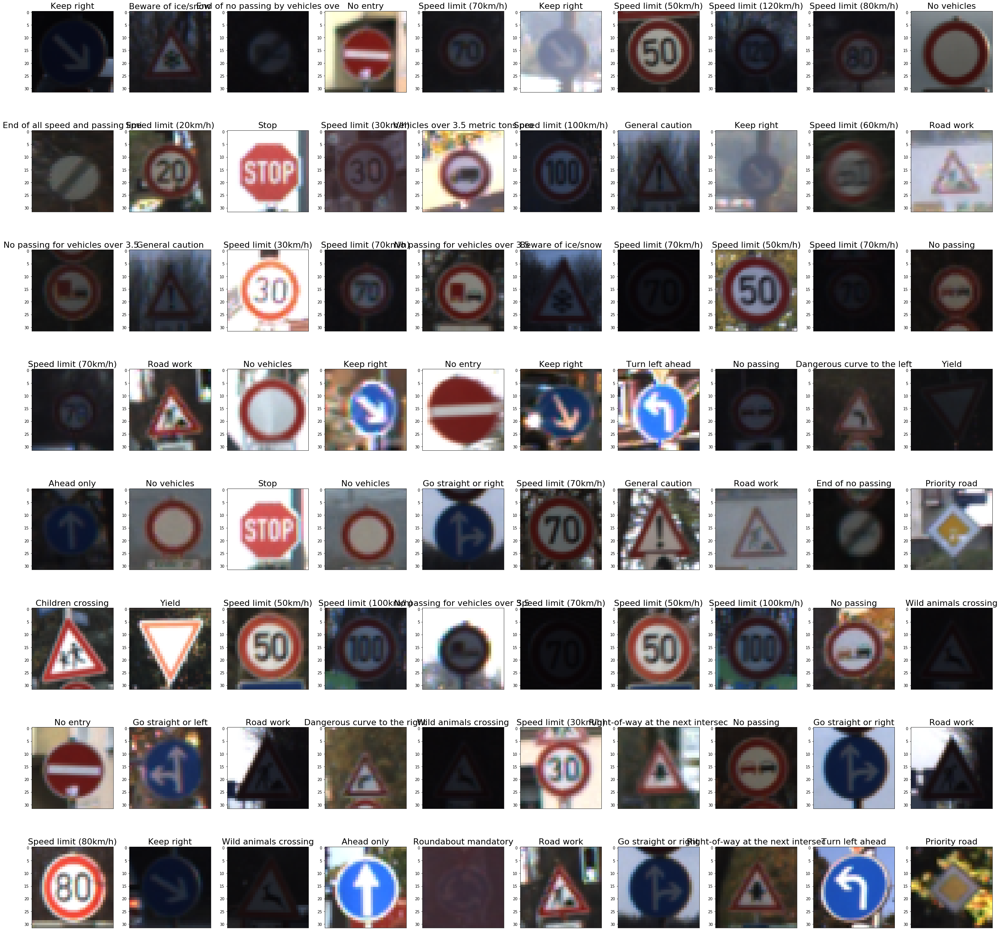

In [6]:
ii = 1
idx = np.arange(n_validation)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.33}'.format(sign_names[y_valid[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(X_valid[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

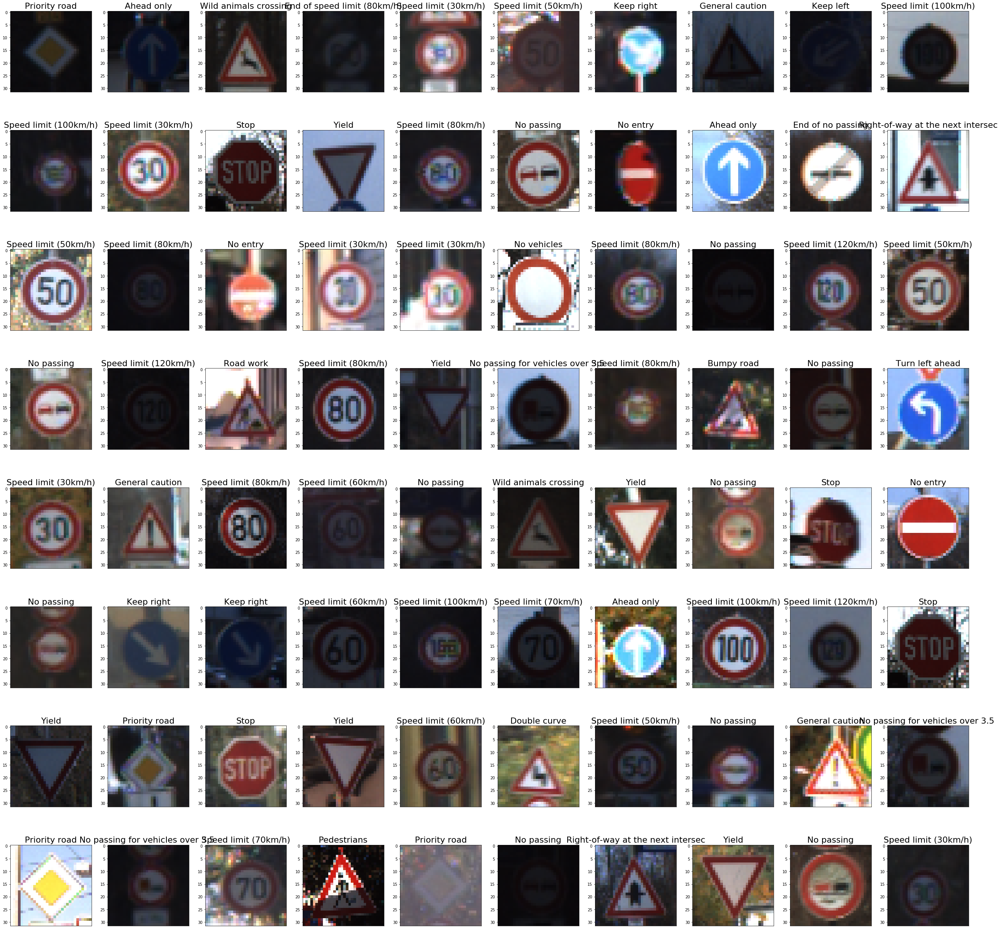

In [7]:
ii = 1
idx = np.arange(n_test)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.33}'.format(sign_names[y_test[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(X_test[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## There are lots of repeats in the training set . . .

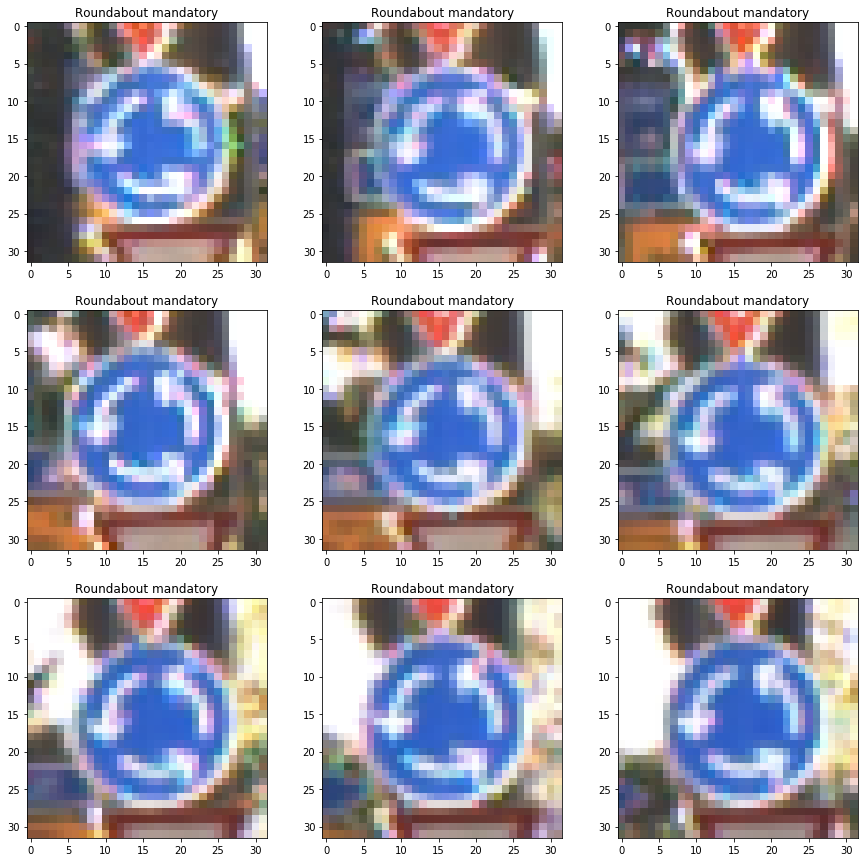

In [8]:
plt.figure(figsize=(15,15))
for i in range(9):
    plt.subplot(3,3,(i+1))
    plt.imshow(X_train[4200+i])
    plt.title(sign_names[y_train[4200+i], 1])

## . . . as well as in the validation set

As it happens, the below sign was the most misclassified sign for a network that I ran for 200 epochs and achieved a validation accuracy over 95%. Too bad it repeats many times within the validaiton set, so the one mistake counts as 10+ mistakes :(

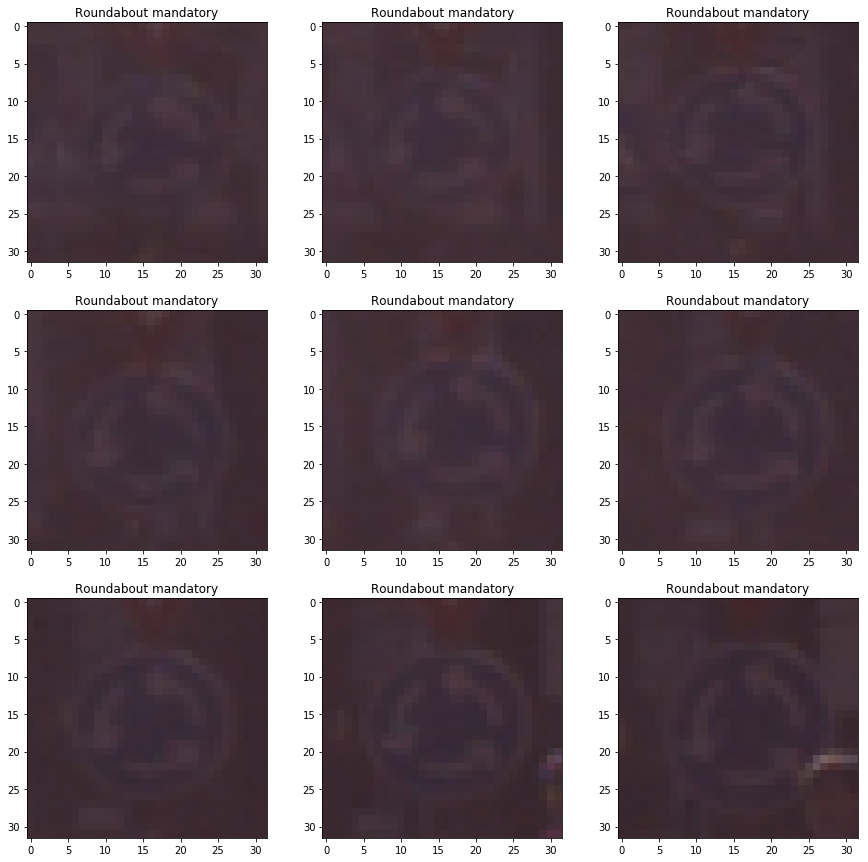

In [9]:
plt.figure(figsize=(15,15))
for i in range(9):
    plt.subplot(3,3,(i+1))
    plt.imshow(X_valid[540+i])
    plt.title(sign_names[y_valid[540+i], 1])

## How to preprocess the data?
The first five functions augment the training data and are not applied during test time on the validation or test sets. They are applied randomly to each image in each batch so the network never sees the exact same image twice, even if there are repeats :) 
    
**random_blur:** Applies a Gaussian Noise kernel 50% of time
    
**random_brighten:** After noticing that signs in all sets had varying degrees of brightness, which didn't seem to be related to natural light conditions, I used this to randomly brighten or darken an image in a way to resemble images in the validation and test sets. I found out about OpenCV's lookup table from [this tutorial](http://www.pyimagesearch.com/2015/10/05/opencv-gamma-correction/).

**random_red_adjust:** This is poorly named because it adjusts all three color channels. It started out only affecting the red channel, but seemed to help the network generalize, so evolved.

**random_rotate:** Self-explanatory. I don't flip images and only rotate them by a max of 40 degrees because certain signs, like Left Turn Ahead and speed-limit signs, would confuse the network if flipped.

**random_crop:** Self-explanatory.

The only preprocessing normalization is to scale the data between 0 and 1.

Since bounding boxes are included, every image is cropped to include only the region within the box and resized to 32x32x3 for uniformity.

Images are kept in color because networks trained on RGB-images performed better for me than those on grayscale. Intuitively, this makes sense because street signs are designed to be different in three ways: shape, images and/or text, and color. 

In [7]:
import cv2
import matplotlib.image as mpimg

In [8]:
def random_blur(x, kernel_size=3):
    blur = np.random.randint(1,3)
    if blur == 1:
        return cv2.GaussianBlur(x, (kernel_size, kernel_size), 0)
    if blur == 2:
        return x
    
def random_brighten(x):
    dark = np.random.randint(1,3)
    if dark == 1:
        gamma = np.random.random() * 0.7 + 0.3
    if dark == 2:
        gamma = np.random.random() * 3.5 + 1.1
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(x, table)

def random_red_adjust(x):    
    R = np.random.random() * 0.3 + 0.7
    G = np.random.random() * 0.3 + 0.7
    B = np.random.random() * 0.3 + 0.7
    x[:,:,0] *= R
    x[:,:,1] *= G
    x[:,:,2] *= B
    return x

def random_rotate(x):
    degrees = int((np.random.rand() * 80) - 40)
    rows = x.shape[0]
    cols = x.shape[1]
    M = cv2.getRotationMatrix2D((cols/2,rows/2),degrees,1)
    dst = cv2.warpAffine(x,M,(cols,rows))
    return dst

def random_crop(x):
    n = int(x.shape[0] * 0.2)
    m = int(x.shape[1] * 0.2)
    x1 = np.random.randint(n)
    x2 = np.random.randint(n)
    y1 = np.random.randint(m)
    y2 = np.random.randint(m)
    crop = x[x1:x.shape[1]-x2, y1:x.shape[1]-y2]
    out = cv2.resize(crop, dsize=(32,32))
    return out

def normalize(x):
    return x / 255.

def region_of_interest_train(images, sizes, coords):
    # the reason for the try statement is to ignore illogical bounding boxes or images lacking them
    # the reason for the two if statements is to distinguish between inputs of batch_size and one image
    images_roi = []
    if len(images.shape) == 4:
        for i in range(images.shape[0]):
            try:
                orig_shape = images[i].shape
                resize = cv2.resize(images[i], dsize=tuple(sizes[i]))
                crop = resize[coords[i][0]:coords[i][2], coords[i][1]:coords[i][3], :]
                rand_crop = random_crop(crop)
                rand_bri = random_brighten(rand_crop)
                rand_rot = random_rotate(rand_bri)
                rand_blu = random_blur(rand_rot)
                resize2 = cv2.resize(rand_blu, dsize=tuple(orig_shape[:2]))
                norm = normalize(resize2)
                out = random_red_adjust(norm)
                images_roi.append(out)
            except:
                images_roi.append(normalize(images[i]))
                
    if len(images.shape) == 3:
        orig_shape = images.shape
        resize = cv2.resize(images, dsize=tuple(sizes))
        crop = resize[coords[0]:coords[2], coords[1]:coords[3], :]
        rand_crop = random_crop(crop)
        rand_bri = random_brighten(rand_crop)
        rand_rot = random_rotate(rand_bri)
        rand_blu = random_blur(rand_rot)
        resize2 = cv2.resize(rand_blu, dsize=tuple(orig_shape[:2]))
        norm = normalize(resize2)
        out = random_red_adjust(norm)
        images_roi.append(out)
    return np.array(images_roi)

def get_batches_train(images, labels, sign_names, sizes, coords, batch_num):
    num_images = len(images)
    idx = np.arange(num_images)
    np.random.shuffle(idx)
    for i in range(0, num_images, batch_num):
        batch_y = labels[idx[i:i+batch_num]]
        batch_sizes = sizes[idx[i:i+batch_num]]
        batch_coords = coords[idx[i:i+batch_num]]
        batch_names = sign_names[batch_y, 1]
        images_x = images[idx[i:i+batch_num]]
        batch_x = region_of_interest_train(images_x, batch_sizes, batch_coords).reshape((-1, 32, 32, 3))
        yield batch_x, batch_y, batch_names, batch_sizes, batch_coords

# Seperate get_batches and region_of_interest for test and validation without data augmentation
def region_of_interest_test(images, sizes, coords):
    images_roi = []
    if len(images.shape) == 4:
        for i in range(images.shape[0]):
            try:
                orig_shape = images[i].shape
                resize = cv2.resize(images[i], dsize=tuple(sizes[i]))
                crop = resize[coords[i][0]:coords[i][2], coords[i][1]:coords[i][3], :]
                out = cv2.resize(crop, dsize=tuple(orig_shape[:2]))
                images_roi.append(normalize(out))
            except:
                images_roi.append(normalize(images[i]))
                
    if len(images.shape) == 3:
        orig_shape = images.shape
        resize = cv2.resize(images, dsize=tuple(sizes))
        crop = resize[coords[0]:coords[2], coords[1]:coords[3], :]
        out = cv2.resize(crop, dsize=tuple(orig_shape[:2]))
        images_roi.append(normalize(out))
    return np.array(images_roi)

def get_batches_test(images, labels, sign_names, sizes, coords, batch_num):
    num_images = len(images)
    for i in range(0, num_images, batch_num):
        idx = np.arange(i,i+batch_num)
        batch_y = labels[i:i+batch_num]
        batch_sizes = sizes[i:i+batch_num]
        batch_coords = coords[i:i+batch_num]
        batch_names = sign_names[batch_y, 1]
        images_x = images[i:i+batch_num]
        batch_x = region_of_interest_test(images_x, batch_sizes, batch_coords).reshape((-1, 32, 32, 3))
        yield idx, batch_x, batch_y, batch_names, batch_sizes, batch_coords

## Here's what one image looks like when preprocessed eight times

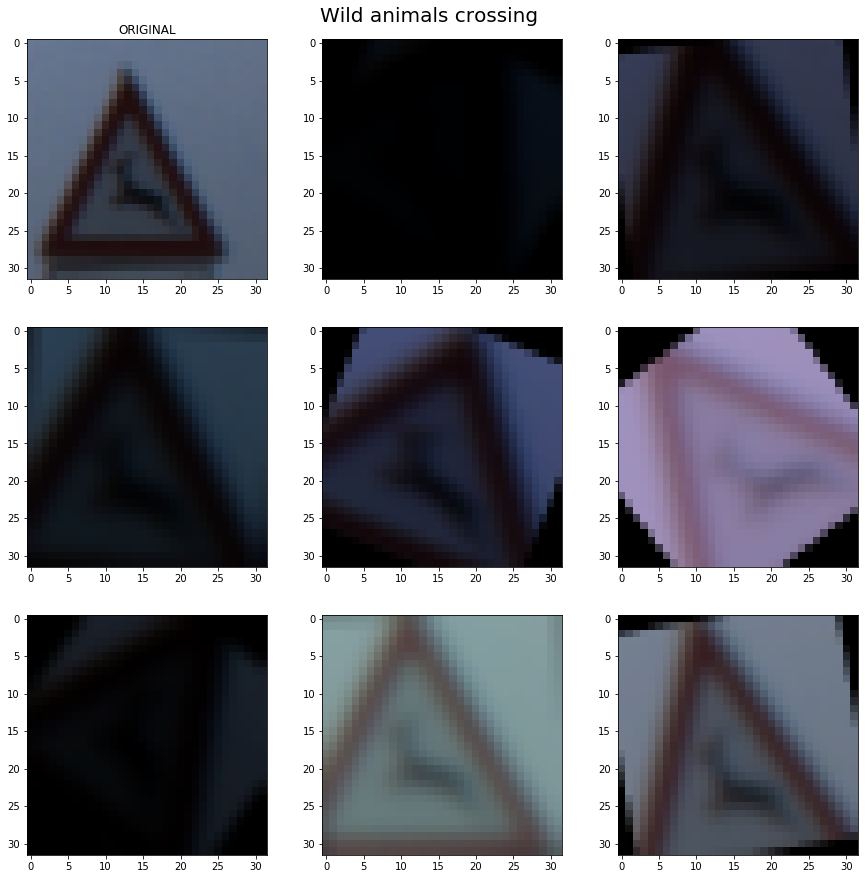

In [10]:
x = X_train[267]
y = y_train[267]
x_name = sign_names[y]
x_coord = train_coord[267]
x_size = train_sizes[267]
x_resize = cv2.resize(x, dsize=tuple(x_size))
plt.figure(figsize=((15,15)))
plt.suptitle(x_name[1], fontsize=20, y=0.91)
plt.subplot(3,3,1)
plt.title('ORIGINAL')
plt.imshow(x)
for i in range(2,10):
    plt.subplot(3,3,i)
    plt.imshow(region_of_interest_train(x, x_size, x_coord).reshape((32,32,3)))

## Now compare 10 images from each set before and after preprocessing
Only the train images are randomly augmented, but we'll look at all three sets to make sure everything works properly.

In [11]:
train_roi = region_of_interest_train(X_train, train_sizes, train_coord)
valid_roi = region_of_interest_test(X_valid, valid_sizes, valid_coord)
test_roi = region_of_interest_test(X_test, test_sizes, test_coord)

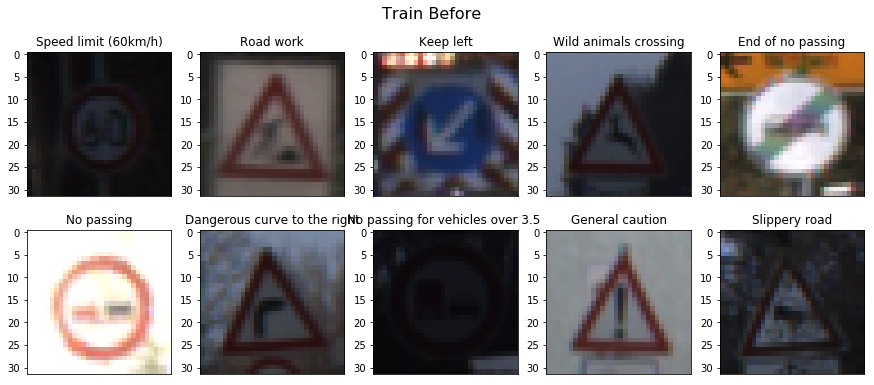

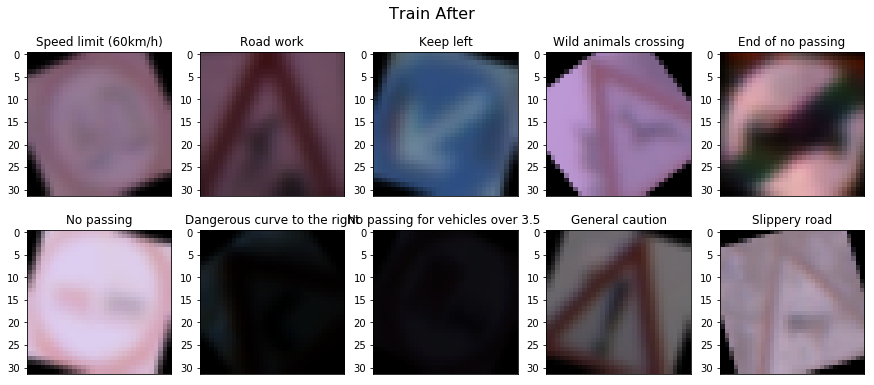

In [12]:
ii = 3
idx = np.arange(n_train)
np.random.shuffle(idx)
plt.figure(figsize=(15, 6))
plt.suptitle('Train Before', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_train[idx[i*ii]], 1]))
    plt.imshow(X_train[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
    
plt.figure(figsize=(15, 6))
plt.suptitle('Train After', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_train[idx[i*ii]], 1]))
    plt.imshow(train_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

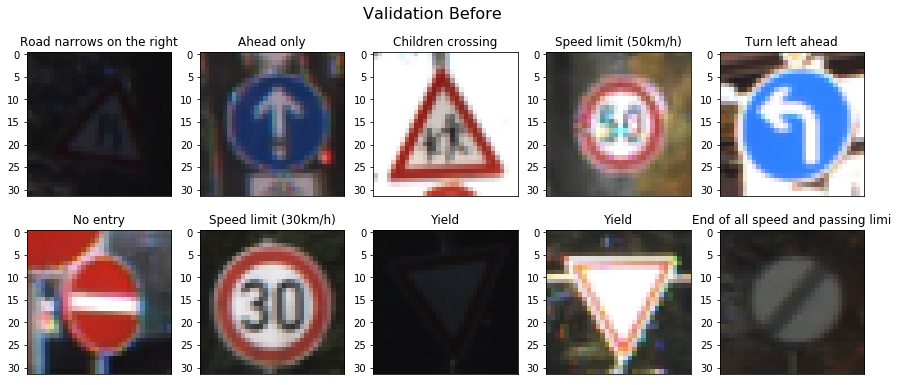

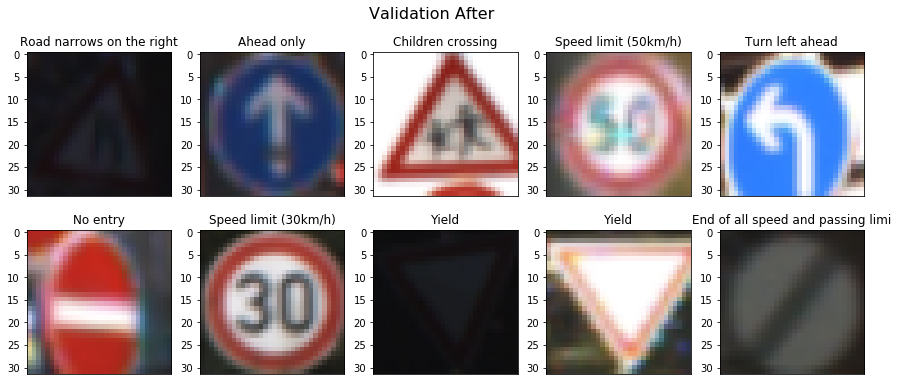

In [13]:
ii = 3
idx = np.arange(n_validation)
np.random.shuffle(idx)
plt.figure(figsize=(15, 6))
plt.suptitle('Validation Before', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_valid[idx[i*ii]], 1]))
    plt.imshow(X_valid[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
    
plt.figure(figsize=(15, 6))
plt.suptitle('Validation After', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_valid[idx[i*ii]], 1]))
    plt.imshow(valid_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

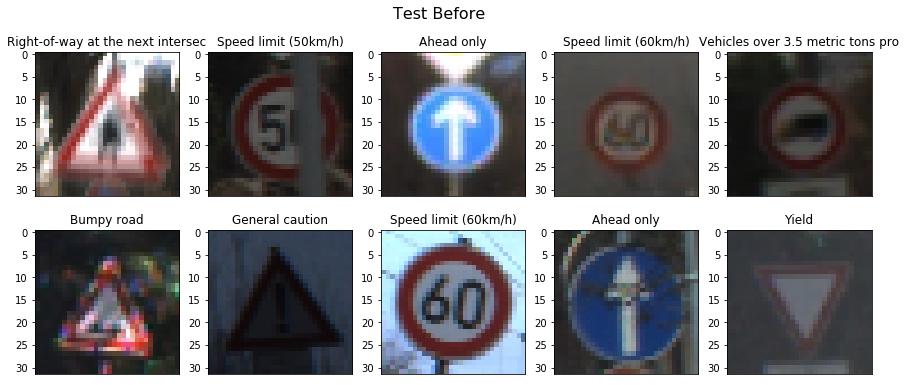

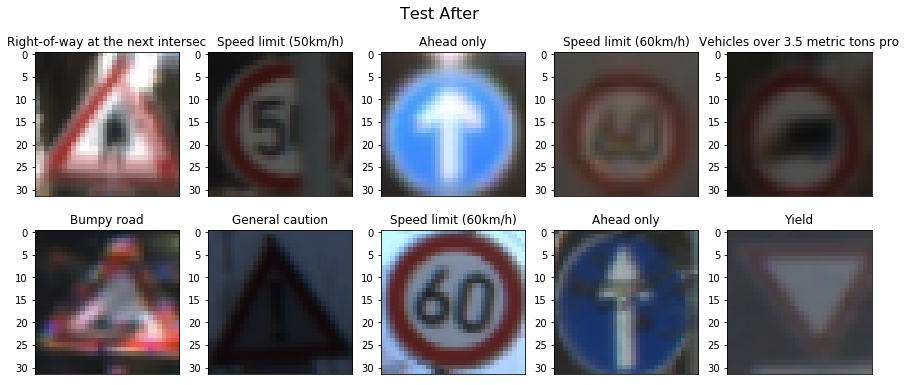

In [14]:
ii = 3
idx = np.arange(n_test)
np.random.shuffle(idx)
plt.figure(figsize=(15, 6))
plt.suptitle('Test Before', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_test[idx[i*ii]], 1]))
    plt.imshow(X_test[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
    
plt.figure(figsize=(15, 6))
plt.suptitle('Test After', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_test[idx[i*ii]], 1]))
    plt.imshow(test_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## I find it useful to see a bunch of images at once, so here's what 80 preprocessed images from each set look like

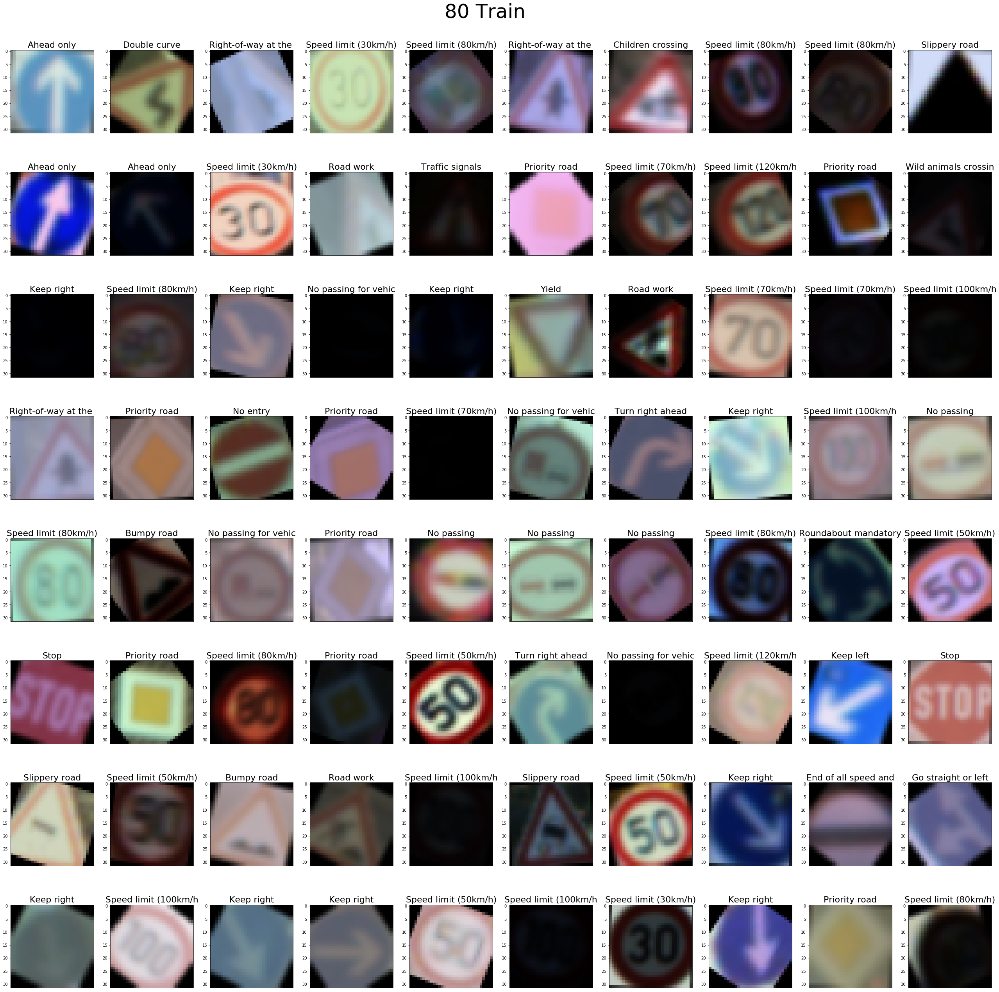

In [18]:
ii = 1
idx = np.arange(n_train)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
plt.suptitle('80 Train', fontsize=50, y=0.91)
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.20}'.format(sign_names[y_train[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(train_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

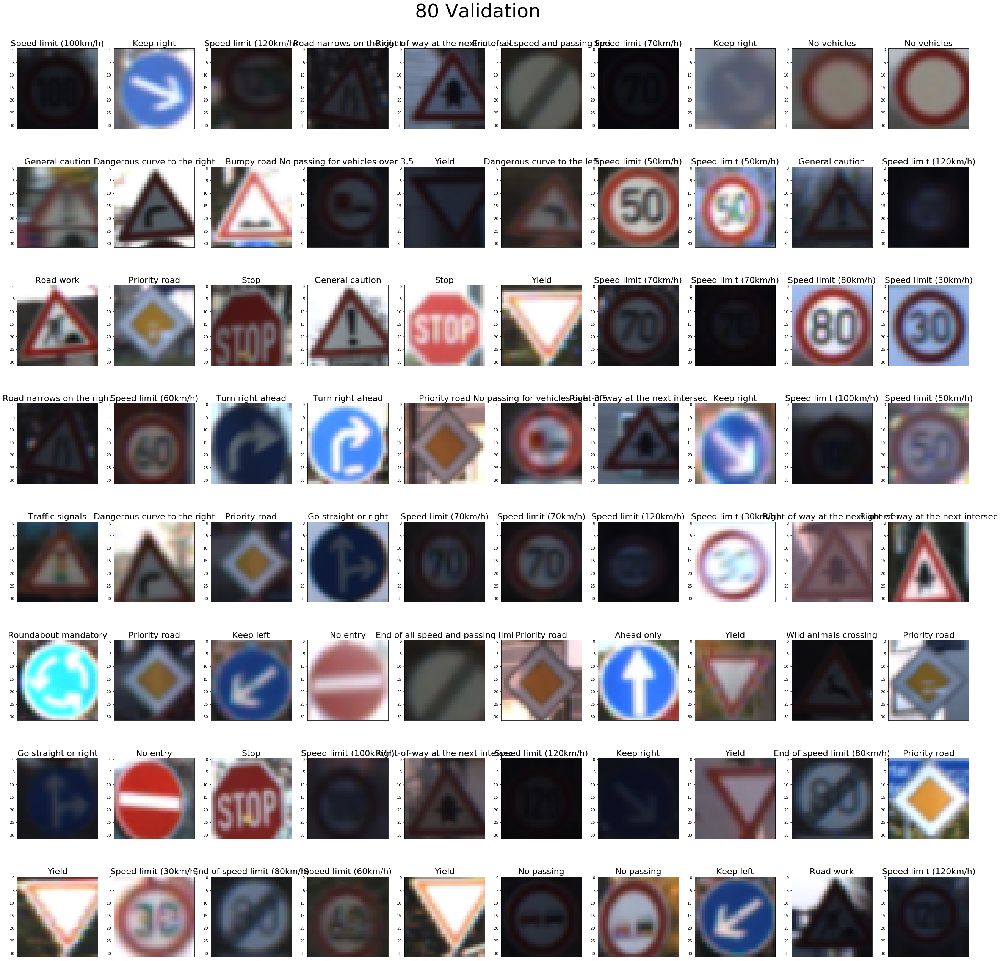

In [19]:
ii = 1
idx = np.arange(n_validation)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
plt.suptitle('80 Validation', fontsize=50, y=0.91)
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.33}'.format(sign_names[y_valid[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(valid_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

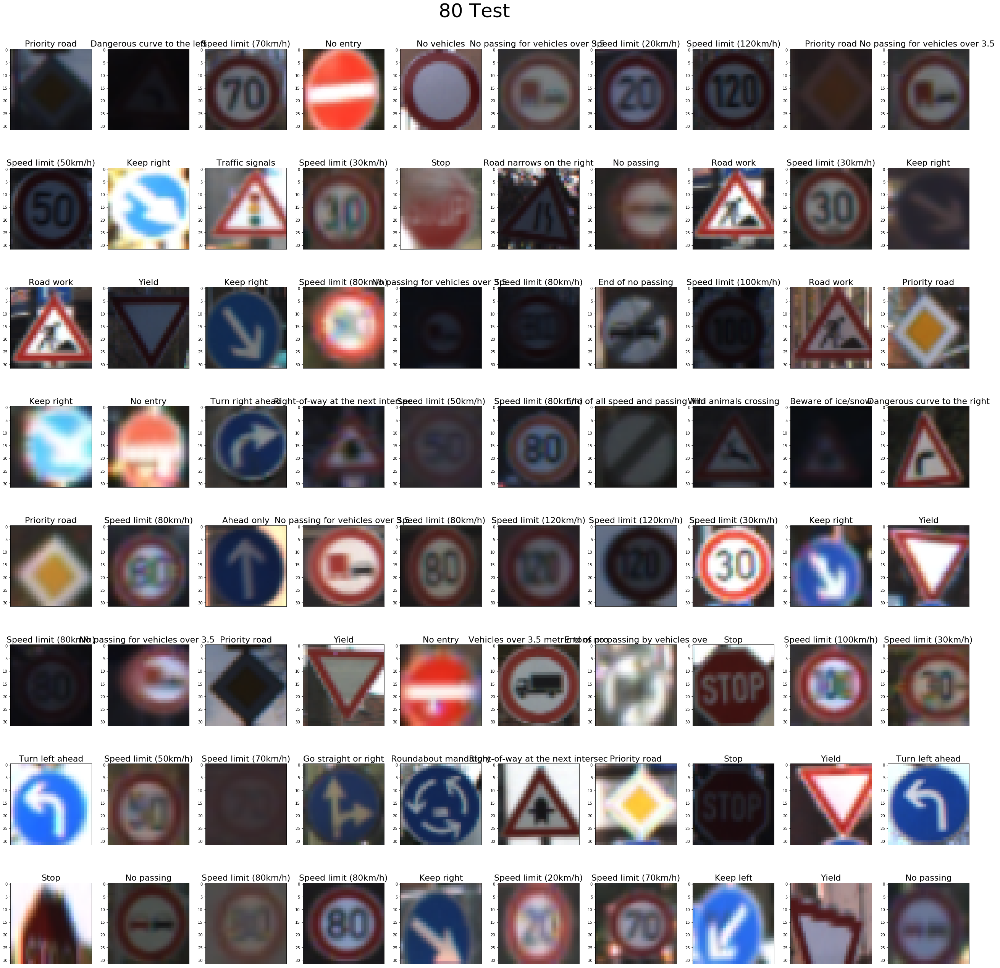

In [20]:
ii = 1
idx = np.arange(n_test)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
plt.suptitle('80 Test', fontsize=50, y=0.91)
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.33}'.format(sign_names[y_test[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(test_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## Build the brain!

In [7]:
import tensorflow as tf
from collections import namedtuple

In [8]:
def build_network(n_classes, batch_num, size_mult=64, alpha=0.2):
    tf.reset_default_graph()
    
    drop_rate = tf.placeholder(tf.float32, name='drop_rate')
    is_train = tf.placeholder(tf.bool, name='is_train')
    learn_rate = tf.placeholder(tf.float32, name='learn_rate')
    
    with tf.name_scope('inputs'):
        x = tf.placeholder(tf.float32, [None, 32, 32, 3], name='inputs')
    
    with tf.name_scope('targets'):
        targets = tf.placeholder(tf.int32, [None])
        y_one_hot = tf.one_hot(targets, n_classes, name='y_one_hot')
        y_reshaped = tf.reshape(y_one_hot, [-1, n_classes])
        
    with tf.name_scope('CONV1'):
        x1 = tf.layers.conv2d(x, 2*size_mult, 5, strides=1, padding='same', use_bias=True, name='conv1')
        relu1 = tf.maximum(alpha * x1, x1)
        
    with tf.name_scope('CONV2'):
        x2 = tf.layers.conv2d(relu1, 2*size_mult, 5, strides=2, padding='same', use_bias=True, name='conv2')
        relu2 = tf.maximum(alpha * x2, x2)
        
    with tf.name_scope('CONV3'):
        x3 = tf.layers.conv2d(relu2, 4*size_mult, 5, strides=1, padding='same', use_bias=False, name='conv3')
        bn3 = tf.layers.batch_normalization(x3, training=is_train, name='batch3')
        relu3 = tf.maximum(alpha * bn3, bn3)
        do3 = tf.layers.dropout(relu3, rate=drop_rate)
        
    with tf.name_scope('CONV4'):
        x4 = tf.layers.conv2d(do3, 4*size_mult, 5, strides=2, padding='same', use_bias=True, name='conv4')
        relu4 = tf.maximum(alpha * x4, x4)
        
    with tf.name_scope('CONV5'):   
        x5 = tf.layers.conv2d(relu4, 8*size_mult, 3, strides=1, padding='same', use_bias=True, name='conv5')
        relu5 = tf.maximum(alpha * x5, x5)
        do5 = tf.layers.dropout(relu5, rate=drop_rate)
        
    with tf.name_scope('CONV6'):
        x6 = tf.layers.conv2d(do5, 8*size_mult, 3, strides=2, padding='same', use_bias=True, name='conv6')
        relu6 = tf.maximum(alpha * x6, x6)
    
    with tf.name_scope('CONV7'):
        x7 = tf.layers.conv2d(relu6, 8*size_mult, 3, strides=1, padding='same', use_bias=False, name='conv7')
        bn7 = tf.layers.batch_normalization(x7, training=is_train, name='batch7')
        relu7 = tf.maximum(alpha * bn7, bn7)
        do7 = tf.layers.dropout(relu7, rate=drop_rate)
        
    with tf.name_scope('FC8'):
        x8 = tf.contrib.layers.flatten(do7)
        fc8 = tf.layers.dense(x8, 16 * size_mult, use_bias=True, activation=None, name='fc8')
        relu8 = tf.maximum(alpha * fc8, fc8)
        do8 = tf.layers.dropout(relu8, rate=drop_rate)
        
    with tf.name_scope('logits'):
        logits = tf.layers.dense(do8, n_classes, use_bias=True, activation=None, name='logits')
    
    with tf.name_scope('predictions'):
        preds = tf.nn.softmax(logits, name='predictions')
        correct_pred = tf.equal(tf.argmax(logits, 1), tf.argmax(y_reshaped, 1))
        accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32), name='accuracy')
    
    with tf.name_scope('cost'):
        cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=logits, labels=y_reshaped), name='cost')
    
    with tf.name_scope('train'):
        train_opt = tf.train.AdamOptimizer(learn_rate).minimize(cost)
    
    export_nodes = ['x', 'targets', 'drop_rate', 'is_train', 'learn_rate', 'relu1', 'relu2', 'relu3',
                    'relu4', 'relu5', 'relu6', 'relu7', 'correct_pred', 'preds', 'cost', 'accuracy', 'train_opt']
    Graph = namedtuple('Graph', export_nodes)
    local_dict = locals()
    graph = Graph(*[local_dict[each] for each in export_nodes])
    
    return graph

## Here's a couple functions that will allow us to view sample validation images and the network's top-5 softmax probabilities for them during training

In [9]:
how_many = 5

def top_n_predictions(pred, top_n=how_many, probs_off=True):
    values, indices = tf.nn.top_k(pred, k=top_n)
    val = np.squeeze(values.eval()).tolist()
    ind = np.squeeze(indices.eval()).tolist()
    if probs_off:
        out = sign_names[ind, 1]
    else:
        out = val
    
    return out

def view_val_with_preds(sess, image, label, sign_name, size, coord, top_n=how_many):
    sample_x = region_of_interest_test(image, size, coord)
    
    feed = {model.x: sample_x.reshape((1,32,32,-1)), 
            model.targets: label.reshape((1,)), 
            model.drop_rate: 0., 
            model.is_train: False}
    pred = sess.run(model.preds, feed_dict=feed)
    top_n_pred_names = top_n_predictions(pred)
    top_n_pred_probs = top_n_predictions(pred, probs_off=False)
    
    plt.figure(figsize=(10, 8))
    plt.suptitle('{:.33}'.format(sign_name), fontsize=16)
        
    plt.subplot(2,2,1)
    y_pos = np.arange(top_n)
    probabilities = np.flip(top_n_pred_probs, 0)
    plt.barh(y_pos, probabilities, align='center', color='blue', tick_label=np.flip(top_n_pred_names, 0))
    plt.tick_params(axis='x', which='both', bottom='off', top='off', labelbottom='off')
    plt.xlabel('Probability')
    
    plt.subplot(2,2,2)
    plt.imshow(image)
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
        
    plt.subplots_adjust(wspace=0.75)
    plt.show()

## Set hyperparameters and create some useful lists

In [10]:
epochs = 200
batch_size = 32
dropout_rate = 0.4
learn_rate = 0.0001
model = build_network(n_classes, learn_rate, batch_size)
saver = tf.train.Saver()
n_batches = int(n_train/batch_size)
steps = 0
train_losses, batch_accs = [], []
total_wrong_indexes = []
print_every = 200
new_val_acc = 0

## Learn!
I find it useful to keep an eye on the network as it trains and to offer words of encouragement. Intuitively, this doesn't make sense. But, like dropout, it works well in practice.

Epoch 1/200. . . Train Loss 2.883. . . Train Acc 0.2283
Epoch 1/200. . . Train Loss 2.299. . . Train Acc 0.3659
Epoch 1/200. . . Train Loss 1.966. . . Train Acc 0.45
Epoch 1/200. . . Train Loss 1.719. . . Train Acc 0.5143
Epoch 1/200. . . Train Loss 1.536. . . Train Acc 0.5632

Caclulating loss & accuracy on  validation set...
Epoch 1/200. . . Val Loss 3.727. . . Val Acc 0.3444

<Speed limit (30km/h)> is 8% of total wrong
<Speed limit (50km/h)> is 5% of total wrong
<Speed limit (70km/h)> is 7% of total wrong
<Speed limit (80km/h)> is 6% of total wrong
<Speed limit (100km/h> is 5% of total wrong
<No passing for vehic> is 6% of total wrong

Epoch 2/200. . . Train Loss 1.392. . . Train Acc 0.6024
Epoch 2/200. . . Train Loss 1.274. . . Train Acc 0.636
Epoch 2/200. . . Train Loss 1.173. . . Train Acc 0.6643
Epoch 2/200. . . Train Loss 1.09. . . Train Acc 0.6881
Epoch 2/200. . . Train Loss 1.019. . . Train Acc 0.7082

Caclulating loss & accuracy on  validation set...
Epoch 2/200. . . Val Los

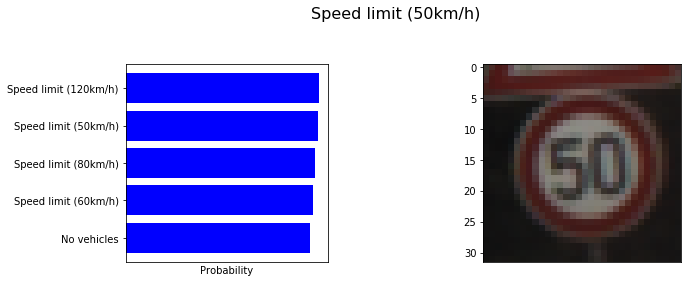

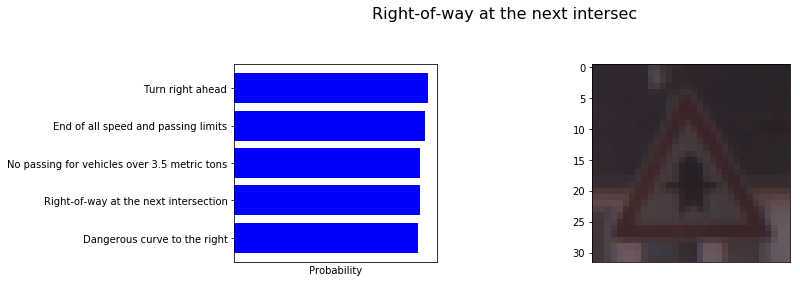

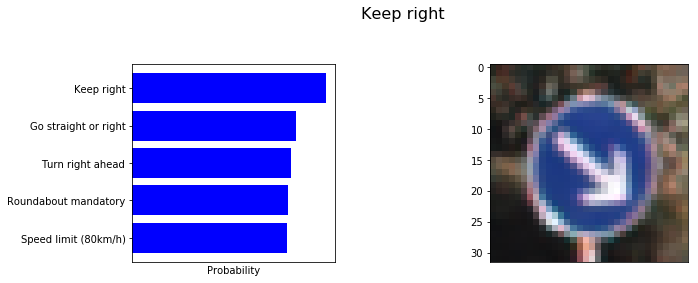

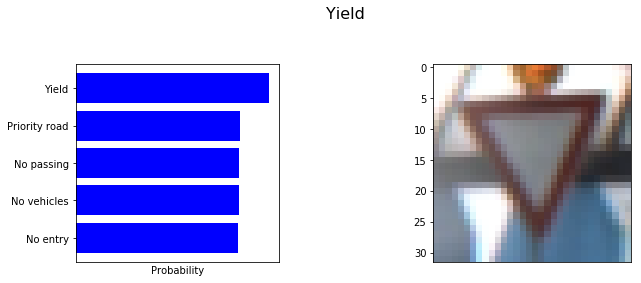

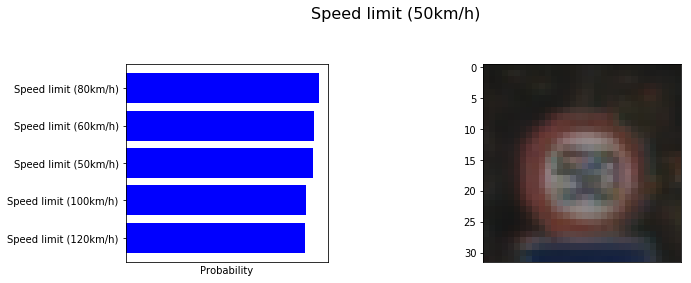

Epoch 6/200. . . Train Loss 0.5139. . . Train Acc 0.8516
Epoch 6/200. . . Train Loss 0.5019. . . Train Acc 0.8551
Epoch 6/200. . . Train Loss 0.4897. . . Train Acc 0.8586
Epoch 6/200. . . Train Loss 0.4794. . . Train Acc 0.8615
Epoch 6/200. . . Train Loss 0.4694. . . Train Acc 0.8644

Caclulating loss & accuracy on  validation set...
Epoch 6/200. . . Val Loss 3.468. . . Val Acc 0.7554

<Speed limit (30km/h)> is 10% of total wrong
<Speed limit (50km/h)> is 5% of total wrong
<Speed limit (70km/h)> is 6% of total wrong
<Speed limit (120km/h> is 7% of total wrong
<Slippery road> is 5% of total wrong
<Road work> is 9% of total wrong

Epoch 7/200. . . Train Loss 0.4597. . . Train Acc 0.8672
Epoch 7/200. . . Train Loss 0.4503. . . Train Acc 0.87
Epoch 7/200. . . Train Loss 0.4416. . . Train Acc 0.8725
Epoch 7/200. . . Train Loss 0.434. . . Train Acc 0.8746
Epoch 7/200. . . Train Loss 0.4259. . . Train Acc 0.877
Epoch 7/200. . . Train Loss 0.4178. . . Train Acc 0.8793

Caclulating loss & accur

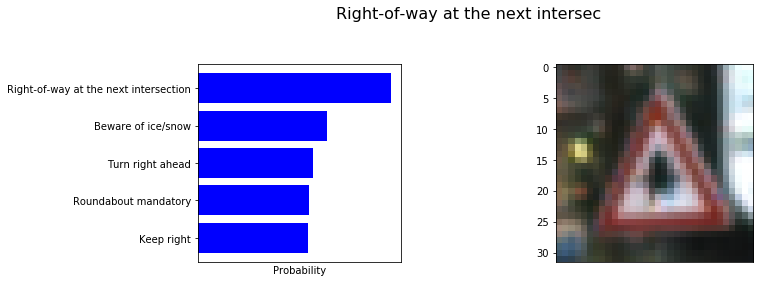

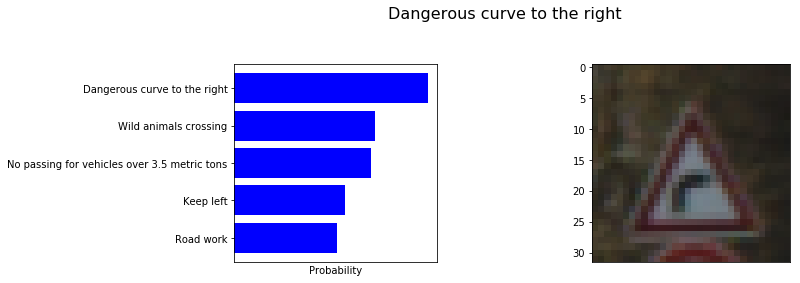

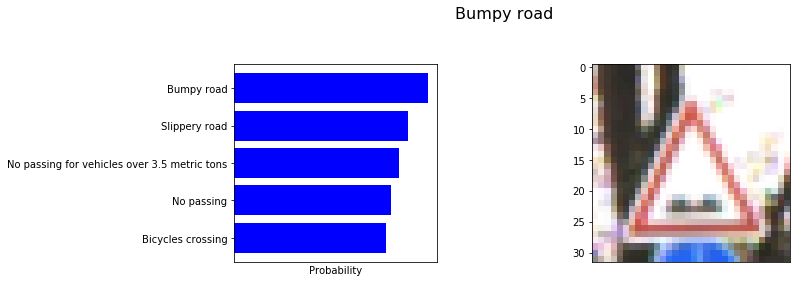

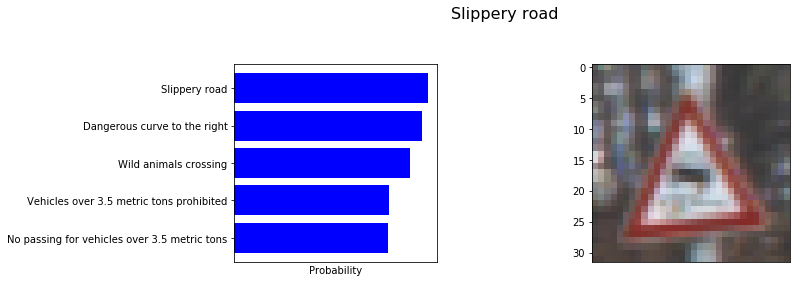

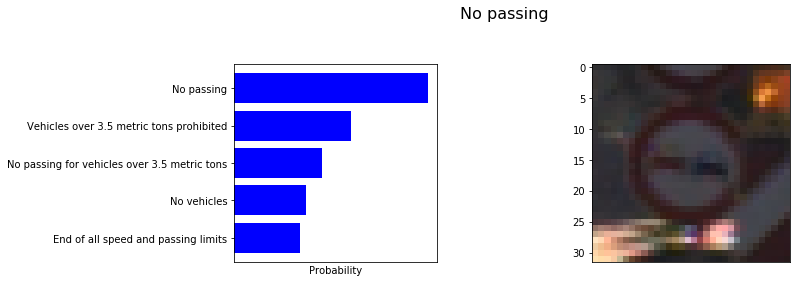

Epoch 11/200. . . Train Loss 0.3242. . . Train Acc 0.9061
Epoch 11/200. . . Train Loss 0.3201. . . Train Acc 0.9072
Epoch 11/200. . . Train Loss 0.3164. . . Train Acc 0.9083
Epoch 11/200. . . Train Loss 0.3125. . . Train Acc 0.9094
Epoch 11/200. . . Train Loss 0.3087. . . Train Acc 0.9105

Caclulating loss & accuracy on  validation set...
Epoch 11/200. . . Val Loss 2.476. . . Val Acc 0.7842

<Speed limit (30km/h)> is 9% of total wrong
<Speed limit (70km/h)> is 7% of total wrong
<Speed limit (100km/h> is 7% of total wrong
<Speed limit (120km/h> is 9% of total wrong
<Road work> is 9% of total wrong

Epoch 12/200. . . Train Loss 0.305. . . Train Acc 0.9116
Epoch 12/200. . . Train Loss 0.3013. . . Train Acc 0.9127
Epoch 12/200. . . Train Loss 0.2977. . . Train Acc 0.9137
Epoch 12/200. . . Train Loss 0.2946. . . Train Acc 0.9146
Epoch 12/200. . . Train Loss 0.2914. . . Train Acc 0.9155
Epoch 12/200. . . Train Loss 0.2886. . . Train Acc 0.9163

Caclulating loss & accuracy on  validation set.

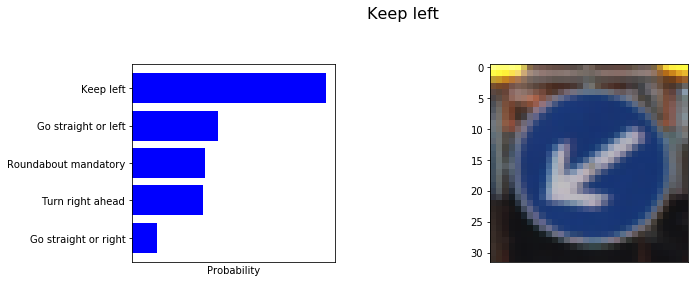

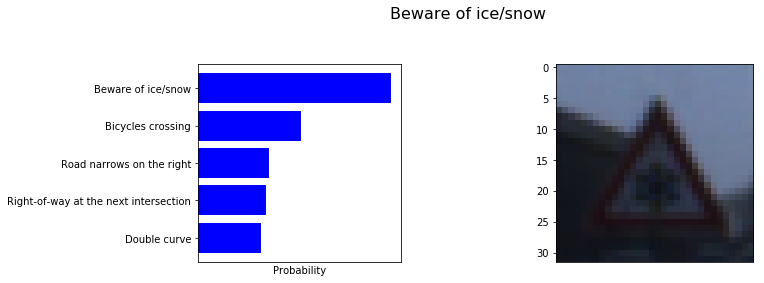

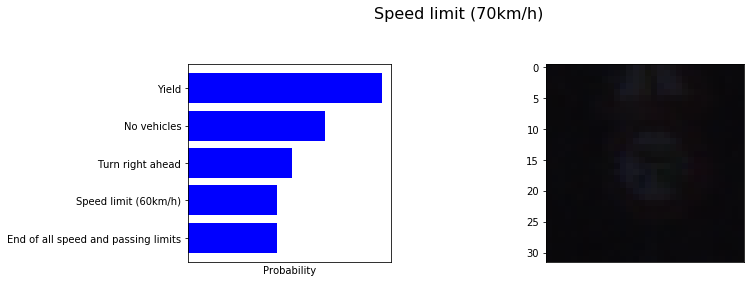

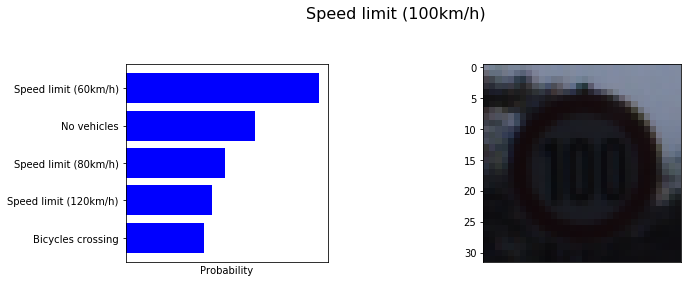

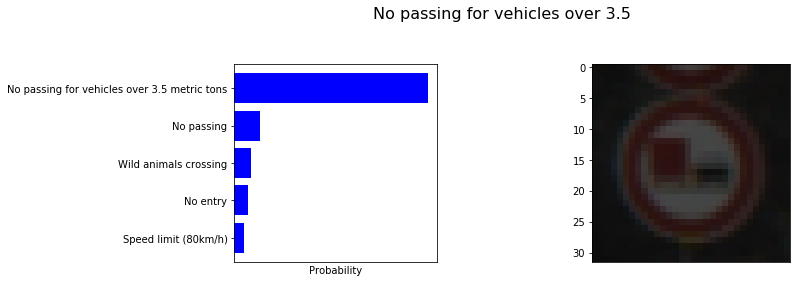

Epoch 16/200. . . Train Loss 0.2457. . . Train Acc 0.9286
Epoch 16/200. . . Train Loss 0.2436. . . Train Acc 0.9292
Epoch 16/200. . . Train Loss 0.2415. . . Train Acc 0.9298
Epoch 16/200. . . Train Loss 0.2395. . . Train Acc 0.9304
Epoch 16/200. . . Train Loss 0.2377. . . Train Acc 0.9309
Epoch 16/200. . . Train Loss 0.2359. . . Train Acc 0.9314

Caclulating loss & accuracy on  validation set...
Epoch 16/200. . . Val Loss 1.249. . . Val Acc 0.81

<Speed limit (30km/h)> is 9% of total wrong
<Speed limit (50km/h)> is 5% of total wrong
<Speed limit (70km/h)> is 8% of total wrong
<Speed limit (80km/h)> is 8% of total wrong
<Speed limit (120km/h> is 12% of total wrong
<Road work> is 8% of total wrong
<Roundabout mandatory> is 5% of total wrong

Epoch 17/200. . . Train Loss 0.234. . . Train Acc 0.932
Epoch 17/200. . . Train Loss 0.2321. . . Train Acc 0.9325
Epoch 17/200. . . Train Loss 0.2303. . . Train Acc 0.933
Epoch 17/200. . . Train Loss 0.2285. . . Train Acc 0.9335
Epoch 17/200. . . Tra

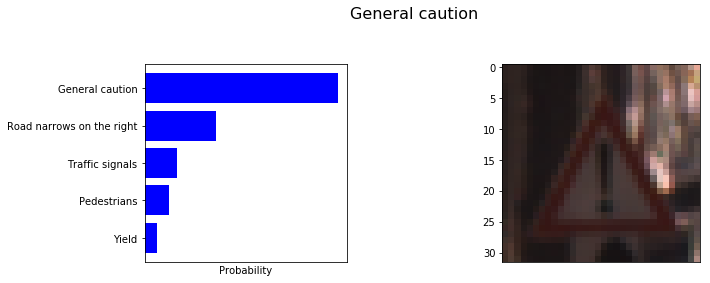

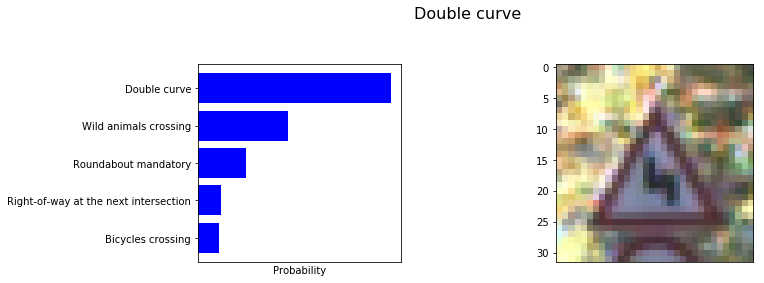

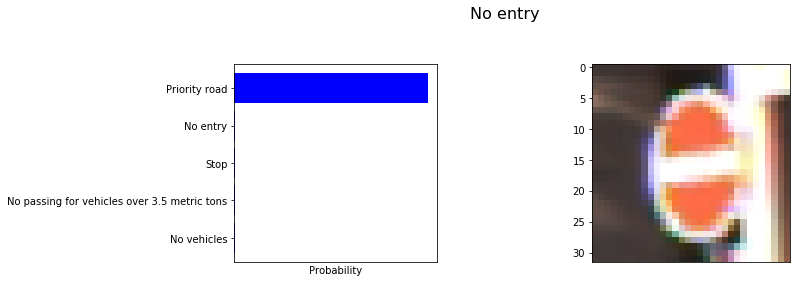

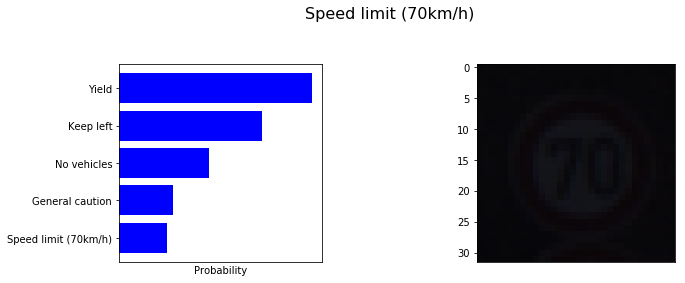

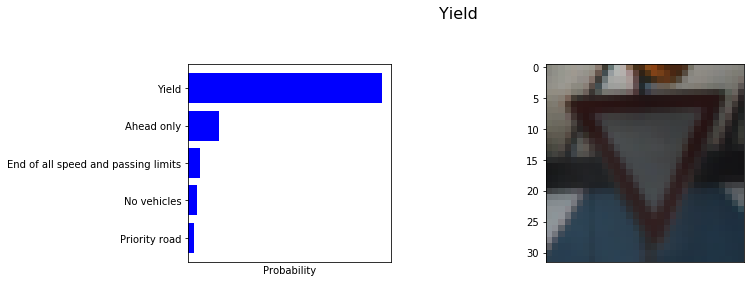

Epoch 21/200. . . Train Loss 0.2019. . . Train Acc 0.9412
Epoch 21/200. . . Train Loss 0.2005. . . Train Acc 0.9416
Epoch 21/200. . . Train Loss 0.1993. . . Train Acc 0.942
Epoch 21/200. . . Train Loss 0.1981. . . Train Acc 0.9424
Epoch 21/200. . . Train Loss 0.197. . . Train Acc 0.9427
Epoch 21/200. . . Train Loss 0.1958. . . Train Acc 0.943

Caclulating loss & accuracy on  validation set...
Epoch 21/200. . . Val Loss 0.654. . . Val Acc 0.8449

<Speed limit (30km/h)> is 10% of total wrong
<Speed limit (70km/h)> is 11% of total wrong
<Double curve> is 6% of total wrong
<Road work> is 8% of total wrong
<Roundabout mandatory> is 6% of total wrong

Epoch 22/200. . . Train Loss 0.1946. . . Train Acc 0.9433
Epoch 22/200. . . Train Loss 0.1934. . . Train Acc 0.9437
Epoch 22/200. . . Train Loss 0.1922. . . Train Acc 0.944
Epoch 22/200. . . Train Loss 0.1911. . . Train Acc 0.9444
Epoch 22/200. . . Train Loss 0.19. . . Train Acc 0.9447

Caclulating loss & accuracy on  validation set...
Epoch 22

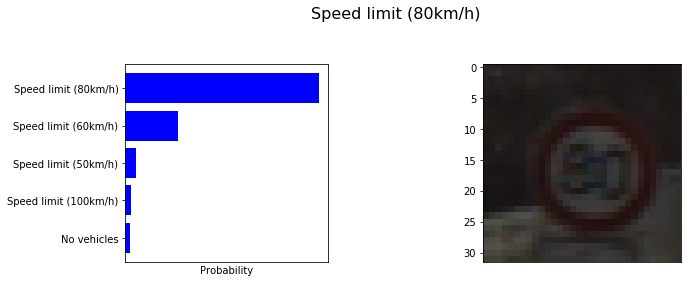

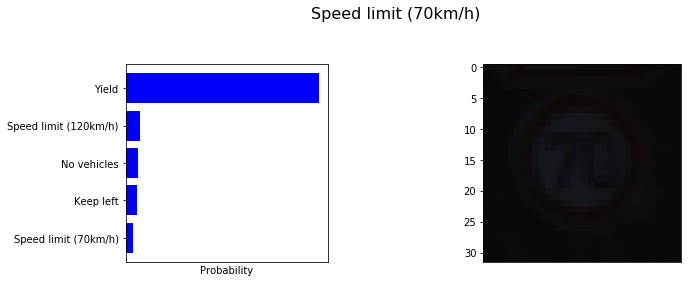

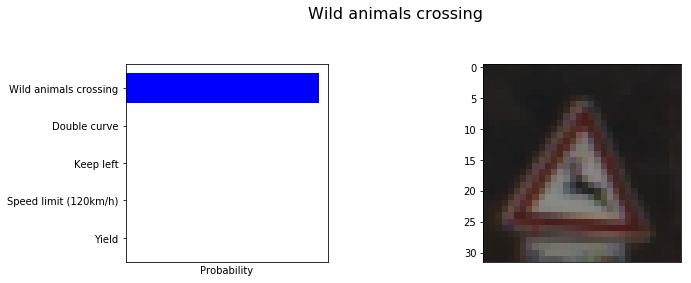

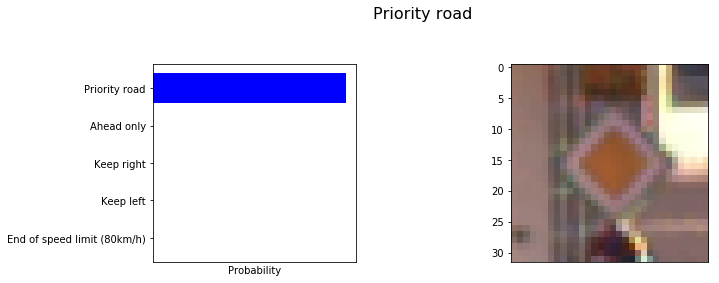

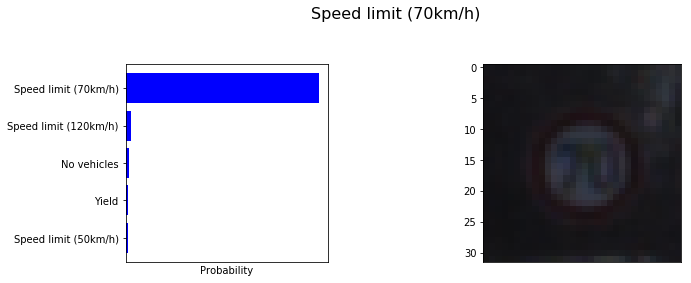

Epoch 26/200. . . Train Loss 0.1725. . . Train Acc 0.9497
Epoch 26/200. . . Train Loss 0.1715. . . Train Acc 0.95
Epoch 26/200. . . Train Loss 0.1706. . . Train Acc 0.9503
Epoch 26/200. . . Train Loss 0.1698. . . Train Acc 0.9505
Epoch 26/200. . . Train Loss 0.169. . . Train Acc 0.9508

Caclulating loss & accuracy on  validation set...
Epoch 26/200. . . Val Loss 0.657. . . Val Acc 0.8517

<Speed limit (30km/h)> is 8% of total wrong
<Speed limit (50km/h)> is 6% of total wrong
<Speed limit (70km/h)> is 9% of total wrong
<Speed limit (100km/h> is 5% of total wrong
<Speed limit (120km/h> is 11% of total wrong
<Right-of-way at the > is 5% of total wrong
<Road work> is 11% of total wrong

Epoch 27/200. . . Train Loss 0.1681. . . Train Acc 0.951
Epoch 27/200. . . Train Loss 0.1673. . . Train Acc 0.9512
Epoch 27/200. . . Train Loss 0.1664. . . Train Acc 0.9515
Epoch 27/200. . . Train Loss 0.1656. . . Train Acc 0.9517
Epoch 27/200. . . Train Loss 0.1648. . . Train Acc 0.952

Caclulating loss & 

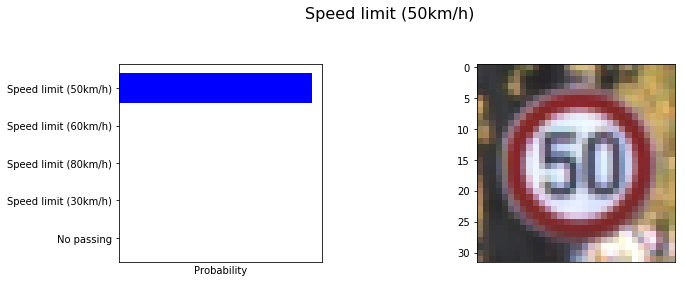

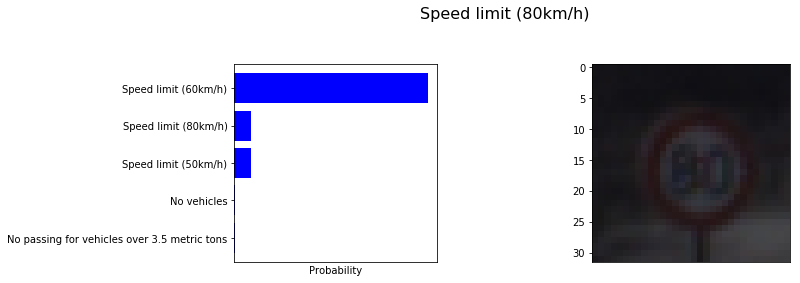

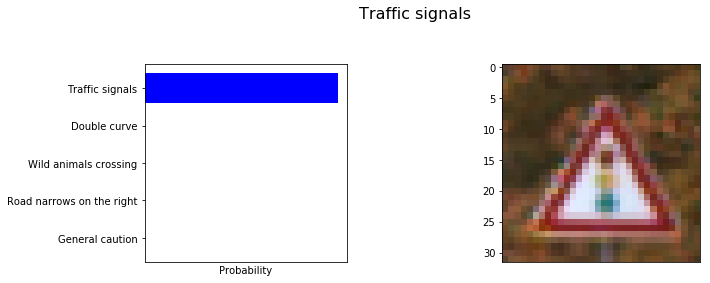

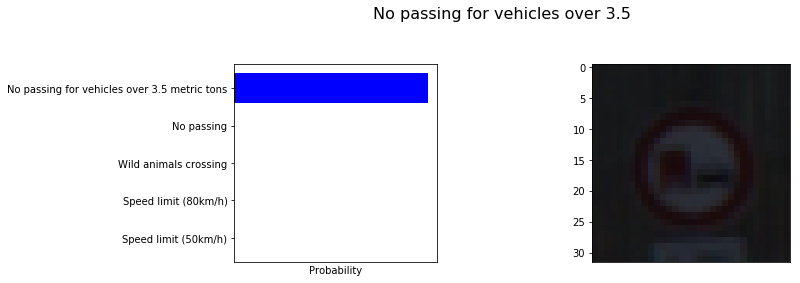

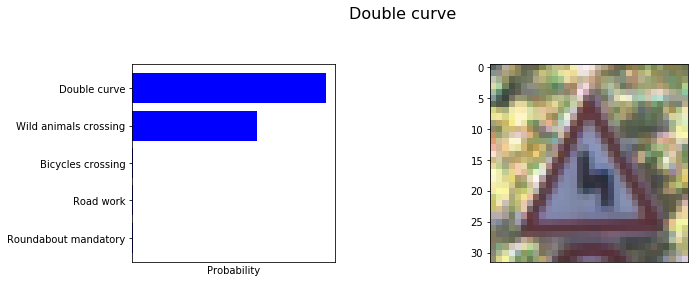

Epoch 31/200. . . Train Loss 0.1524. . . Train Acc 0.9556
Epoch 31/200. . . Train Loss 0.1517. . . Train Acc 0.9558
Epoch 31/200. . . Train Loss 0.1511. . . Train Acc 0.9559
Epoch 31/200. . . Train Loss 0.1505. . . Train Acc 0.9561
Epoch 31/200. . . Train Loss 0.1499. . . Train Acc 0.9563

Caclulating loss & accuracy on  validation set...
Epoch 31/200. . . Val Loss 0.5181. . . Val Acc 0.8863

<Speed limit (20km/h)> is 6% of total wrong
<Speed limit (30km/h)> is 15% of total wrong
<Speed limit (100km/h> is 7% of total wrong
<Speed limit (120km/h> is 8% of total wrong
<Double curve> is 7% of total wrong
<Road work> is 13% of total wrong
<Roundabout mandatory> is 8% of total wrong

Epoch 32/200. . . Train Loss 0.1493. . . Train Acc 0.9564
Epoch 32/200. . . Train Loss 0.1487. . . Train Acc 0.9566
Epoch 32/200. . . Train Loss 0.1481. . . Train Acc 0.9568
Epoch 32/200. . . Train Loss 0.1474. . . Train Acc 0.957
Epoch 32/200. . . Train Loss 0.1468. . . Train Acc 0.9571
Epoch 32/200. . . Train

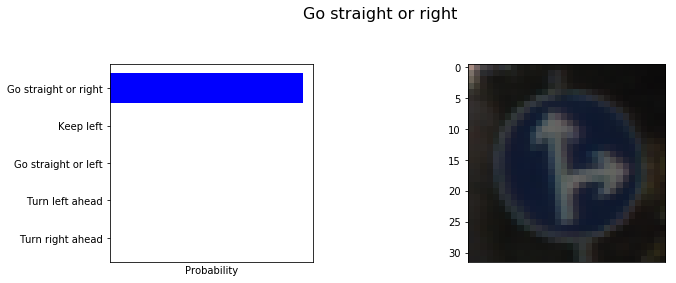

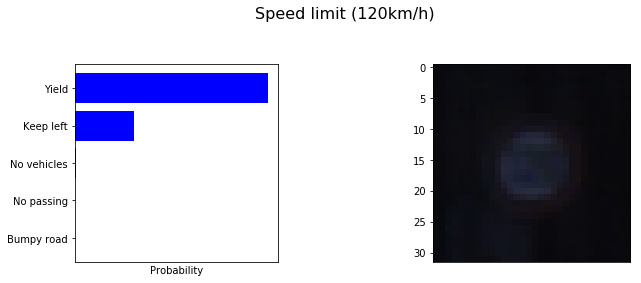

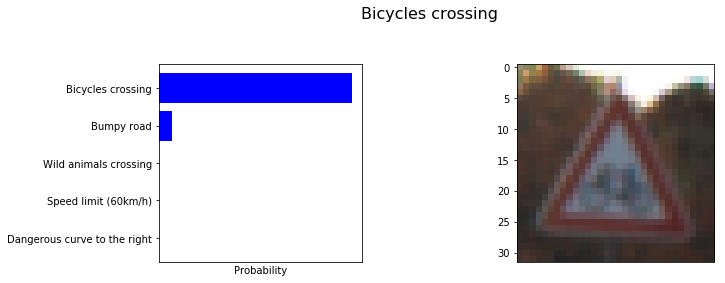

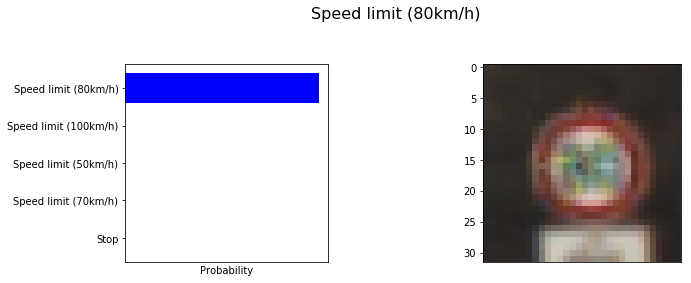

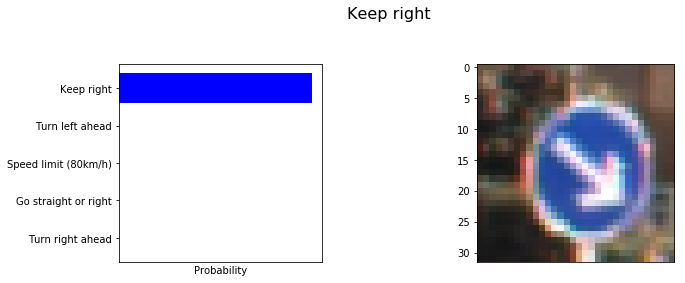

Epoch 36/200. . . Train Loss 0.1373. . . Train Acc 0.9599
Epoch 36/200. . . Train Loss 0.1368. . . Train Acc 0.96
Epoch 36/200. . . Train Loss 0.1363. . . Train Acc 0.9602
Epoch 36/200. . . Train Loss 0.1358. . . Train Acc 0.9603
Epoch 36/200. . . Train Loss 0.1353. . . Train Acc 0.9605

Caclulating loss & accuracy on  validation set...
Epoch 36/200. . . Val Loss 0.3887. . . Val Acc 0.9234

<Speed limit (30km/h)> is 9% of total wrong
<Speed limit (70km/h)> is 5% of total wrong
<Speed limit (100km/h> is 9% of total wrong
<Speed limit (120km/h> is 10% of total wrong
<No entry> is 5% of total wrong
<Double curve> is 8% of total wrong
<Road work> is 11% of total wrong
<Roundabout mandatory> is 6% of total wrong

Epoch 37/200. . . Train Loss 0.1348. . . Train Acc 0.9606
Epoch 37/200. . . Train Loss 0.1343. . . Train Acc 0.9607
Epoch 37/200. . . Train Loss 0.1339. . . Train Acc 0.9609
Epoch 37/200. . . Train Loss 0.1335. . . Train Acc 0.961
Epoch 37/200. . . Train Loss 0.133. . . Train Acc 0

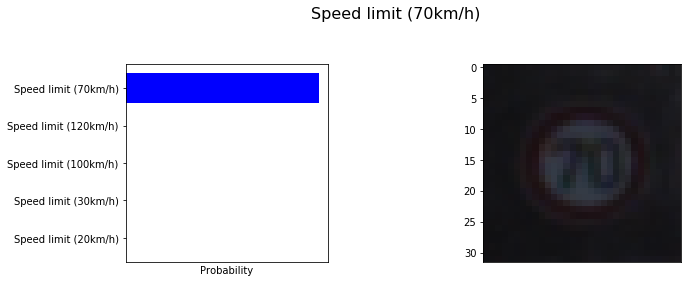

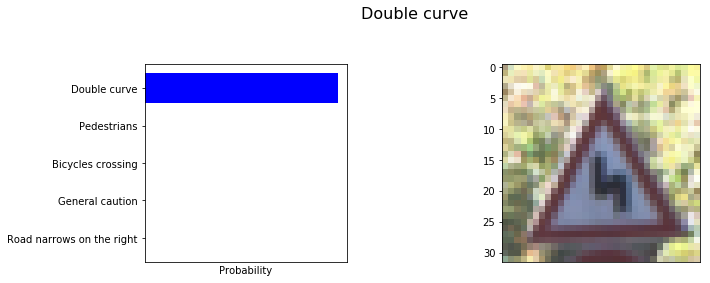

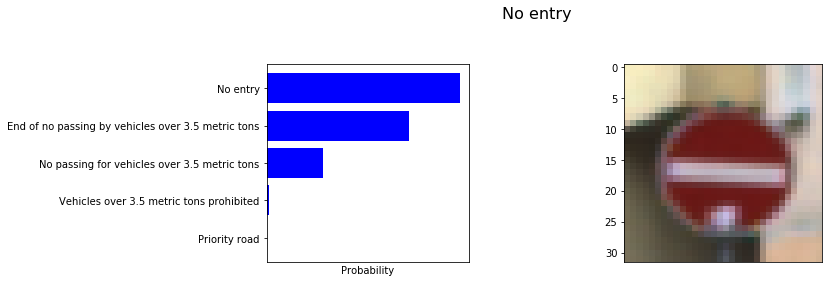

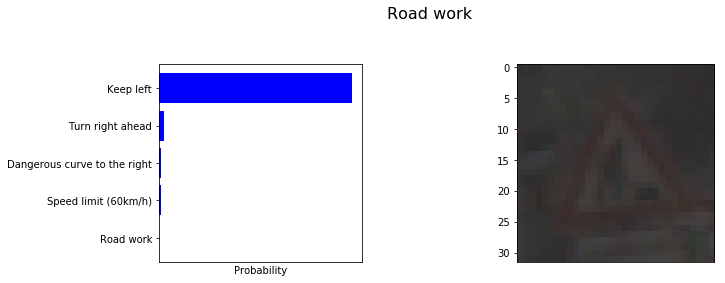

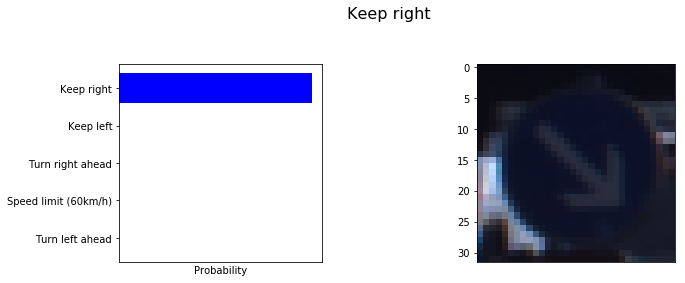

Epoch 41/200. . . Train Loss 0.1255. . . Train Acc 0.9633
Epoch 41/200. . . Train Loss 0.1251. . . Train Acc 0.9635
Epoch 41/200. . . Train Loss 0.1247. . . Train Acc 0.9636
Epoch 41/200. . . Train Loss 0.1243. . . Train Acc 0.9637
Epoch 41/200. . . Train Loss 0.1239. . . Train Acc 0.9638
Epoch 41/200. . . Train Loss 0.1236. . . Train Acc 0.9639

Caclulating loss & accuracy on  validation set...
Epoch 41/200. . . Val Loss 0.643. . . Val Acc 0.9149

<Speed limit (70km/h)> is 7% of total wrong
<Speed limit (100km/h> is 6% of total wrong
<Speed limit (120km/h> is 17% of total wrong
<No entry> is 5% of total wrong
<Road work> is 9% of total wrong
<Pedestrians> is 8% of total wrong

Epoch 42/200. . . Train Loss 0.1232. . . Train Acc 0.964
Epoch 42/200. . . Train Loss 0.1228. . . Train Acc 0.9641
Epoch 42/200. . . Train Loss 0.1225. . . Train Acc 0.9642
Epoch 42/200. . . Train Loss 0.122. . . Train Acc 0.9643
Epoch 42/200. . . Train Loss 0.1217. . . Train Acc 0.9644

Caclulating loss & accur

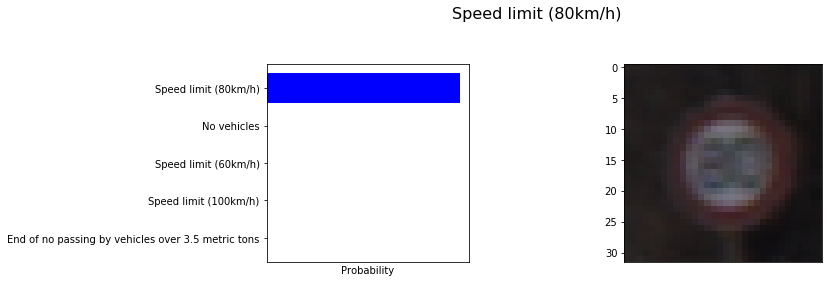

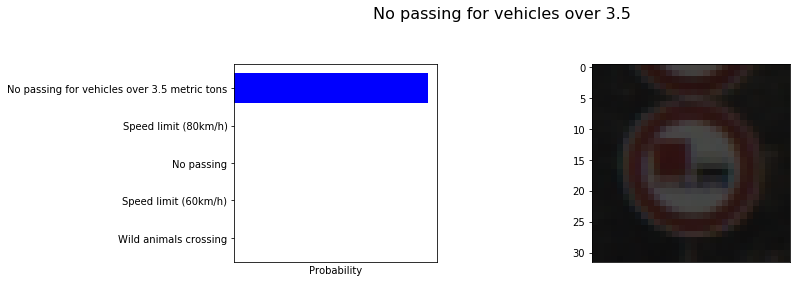

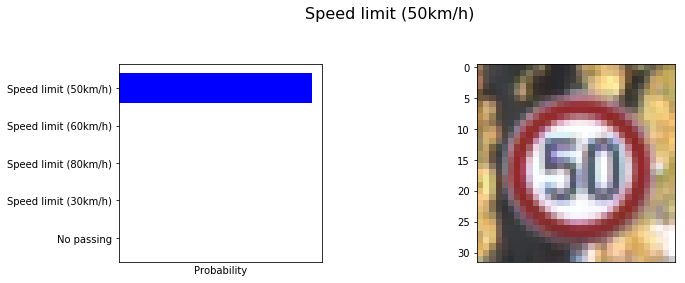

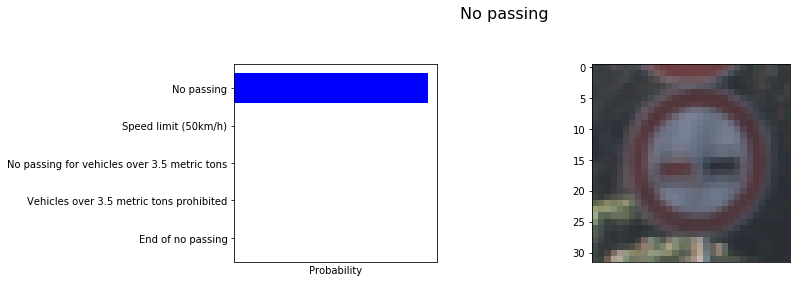

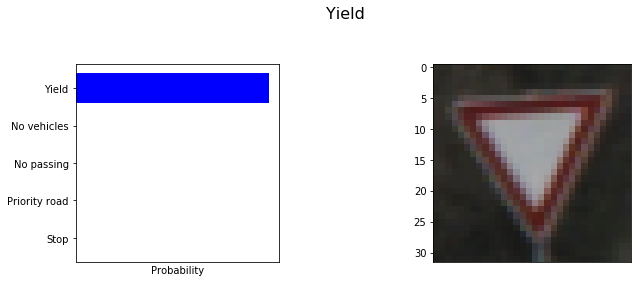

Epoch 46/200. . . Train Loss 0.1159. . . Train Acc 0.9661
Epoch 46/200. . . Train Loss 0.1155. . . Train Acc 0.9662
Epoch 46/200. . . Train Loss 0.1152. . . Train Acc 0.9663
Epoch 46/200. . . Train Loss 0.1149. . . Train Acc 0.9664
Epoch 46/200. . . Train Loss 0.1145. . . Train Acc 0.9665
Epoch 46/200. . . Train Loss 0.1142. . . Train Acc 0.9666

Caclulating loss & accuracy on  validation set...
Epoch 46/200. . . Val Loss 0.8713. . . Val Acc 0.913

<Speed limit (70km/h)> is 11% of total wrong
<Speed limit (100km/h> is 8% of total wrong
<Speed limit (120km/h> is 16% of total wrong
<Road work> is 13% of total wrong
<Roundabout mandatory> is 13% of total wrong

Epoch 47/200. . . Train Loss 0.1139. . . Train Acc 0.9667
Epoch 47/200. . . Train Loss 0.1136. . . Train Acc 0.9668
Epoch 47/200. . . Train Loss 0.1133. . . Train Acc 0.9668
Epoch 47/200. . . Train Loss 0.113. . . Train Acc 0.9669
Epoch 47/200. . . Train Loss 0.1127. . . Train Acc 0.967

Caclulating loss & accuracy on  validation s

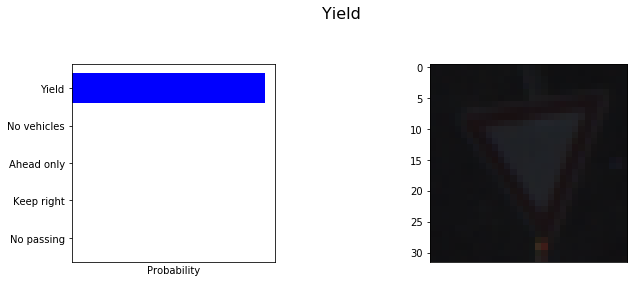

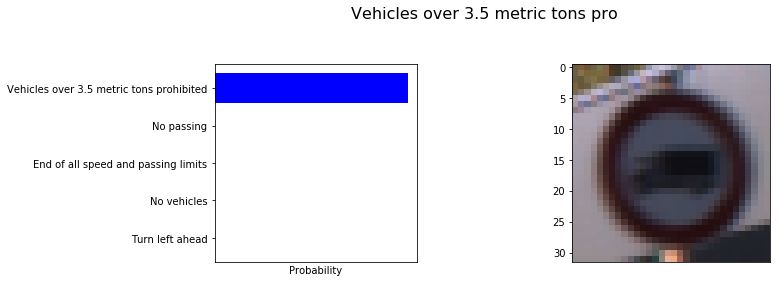

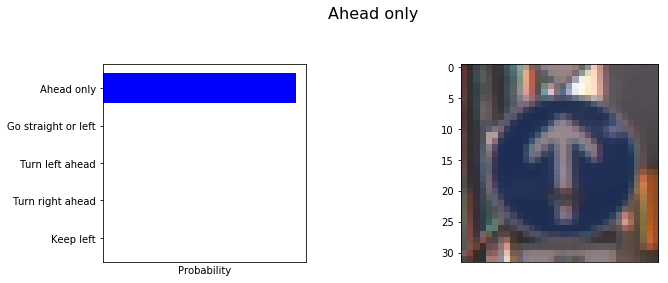

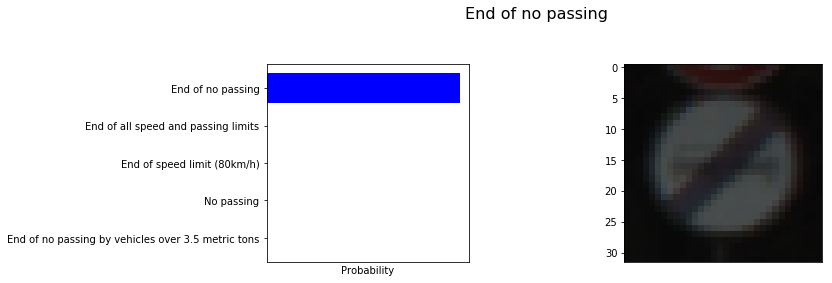

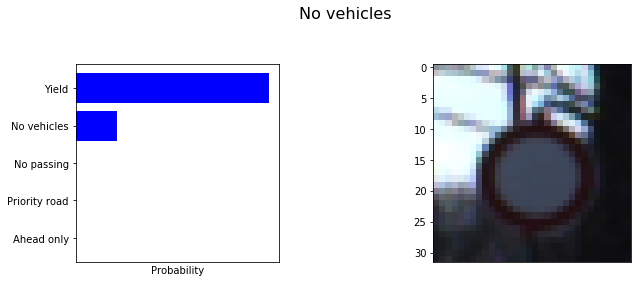

Epoch 51/200. . . Train Loss 0.1077. . . Train Acc 0.9685
Epoch 51/200. . . Train Loss 0.1074. . . Train Acc 0.9686
Epoch 51/200. . . Train Loss 0.1071. . . Train Acc 0.9686
Epoch 51/200. . . Train Loss 0.1069. . . Train Acc 0.9687
Epoch 51/200. . . Train Loss 0.1067. . . Train Acc 0.9688

Caclulating loss & accuracy on  validation set...
Epoch 51/200. . . Val Loss 0.4898. . . Val Acc 0.9571
Model Saved!

<Speed limit (30km/h)> is 6% of total wrong
<Speed limit (50km/h)> is 8% of total wrong
<Speed limit (70km/h)> is 11% of total wrong
<Speed limit (120km/h> is 7% of total wrong
<No entry> is 11% of total wrong
<Dangerous curve to t> is 5% of total wrong
<Double curve> is 8% of total wrong
<Pedestrians> is 8% of total wrong
<Roundabout mandatory> is 7% of total wrong

Epoch 52/200. . . Train Loss 0.1065. . . Train Acc 0.9688
Epoch 52/200. . . Train Loss 0.1062. . . Train Acc 0.9689
Epoch 52/200. . . Train Loss 0.1059. . . Train Acc 0.969
Epoch 52/200. . . Train Loss 0.1057. . . Train A

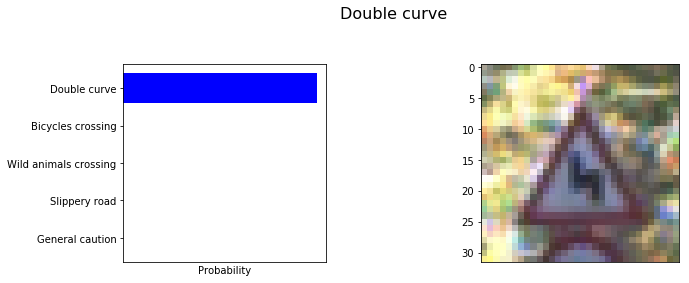

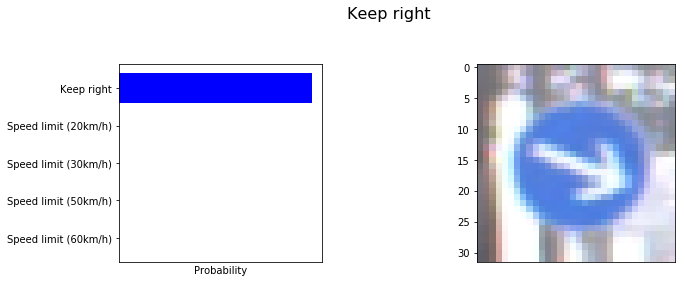

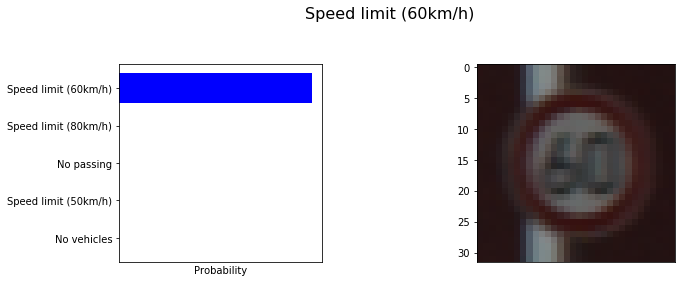

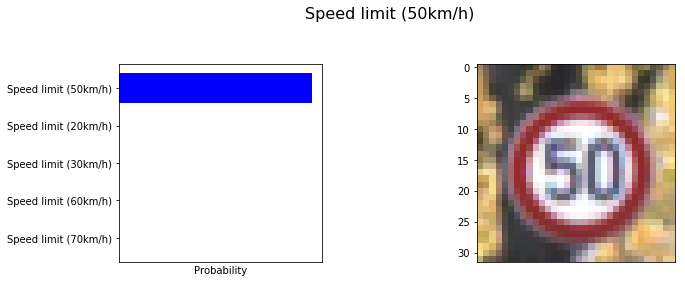

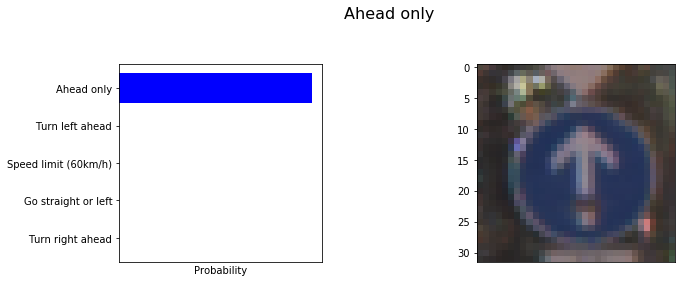

Epoch 56/200. . . Train Loss 0.1011. . . Train Acc 0.9704
Epoch 56/200. . . Train Loss 0.1009. . . Train Acc 0.9705
Epoch 56/200. . . Train Loss 0.1007. . . Train Acc 0.9705
Epoch 56/200. . . Train Loss 0.1004. . . Train Acc 0.9706
Epoch 56/200. . . Train Loss 0.1002. . . Train Acc 0.9707

Caclulating loss & accuracy on  validation set...
Epoch 56/200. . . Val Loss 0.8325. . . Val Acc 0.9574
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (50km/h)> is 6% of total wrong
<Speed limit (70km/h)> is 9% of total wrong
<Vehicles over 3.5 me> is 10% of total wrong
<No entry> is 14% of total wrong
<Dangerous curve to t> is 6% of total wrong
<Double curve> is 10% of total wrong
<Road work> is 5% of total wrong
<Pedestrians> is 10% of total wrong

Epoch 57/200. . . Train Loss 0.09999. . . Train Acc 0.9707
Epoch 57/200. . . Train Loss 0.0998. . . Train Acc 0.9708
Epoch 57/200. . . Train Loss 0.0996. . . Train Acc 0.9708
Epoch 57/200. . . Train Loss 0.09941. . . T

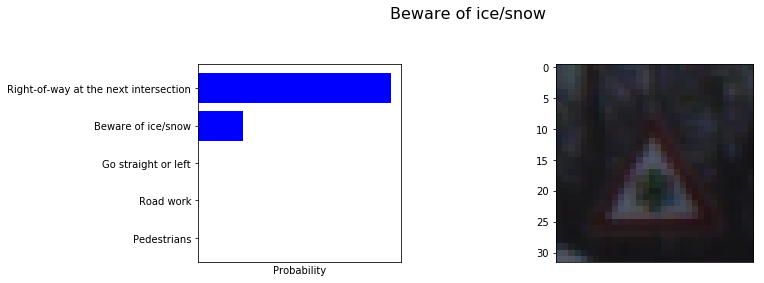

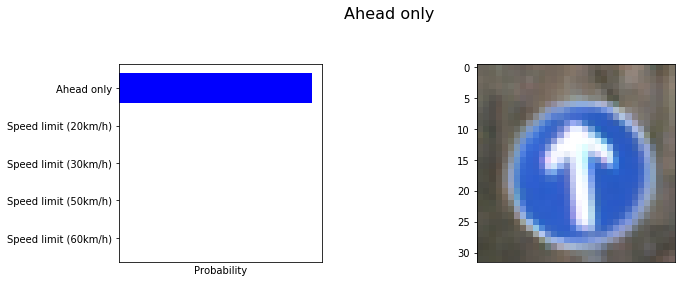

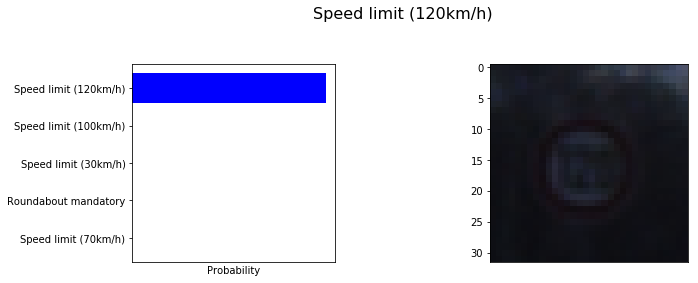

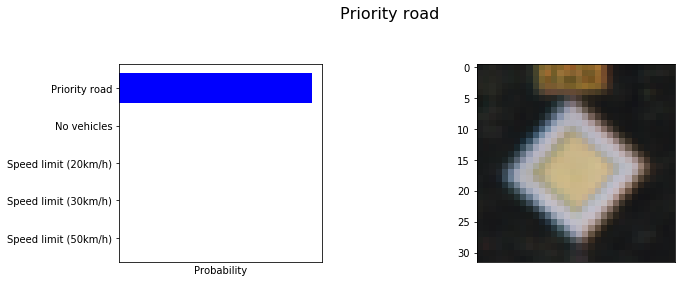

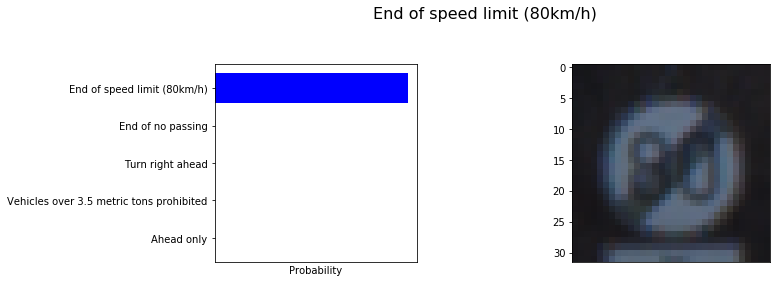

Epoch 61/200. . . Train Loss 0.09555. . . Train Acc 0.972
Epoch 61/200. . . Train Loss 0.09534. . . Train Acc 0.9721
Epoch 61/200. . . Train Loss 0.09512. . . Train Acc 0.9722
Epoch 61/200. . . Train Loss 0.09492. . . Train Acc 0.9722
Epoch 61/200. . . Train Loss 0.0947. . . Train Acc 0.9723

Caclulating loss & accuracy on  validation set...
Epoch 61/200. . . Val Loss 1.131. . . Val Acc 0.9545
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (120km/h> is 6% of total wrong
<Right-of-way at the > is 8% of total wrong
<No entry> is 14% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Double curve> is 6% of total wrong
<Road work> is 11% of total wrong
<Pedestrians> is 7% of total wrong

Epoch 62/200. . . Train Loss 0.09452. . . Train Acc 0.9723
Epoch 62/200. . . Train Loss 0.09434. . . Train Acc 0.9724
Epoch 62/200. . . Train Loss 0.09414. . . Train Acc 0.9724
Epoch 62/200. . . Train Loss 0.09395. . .

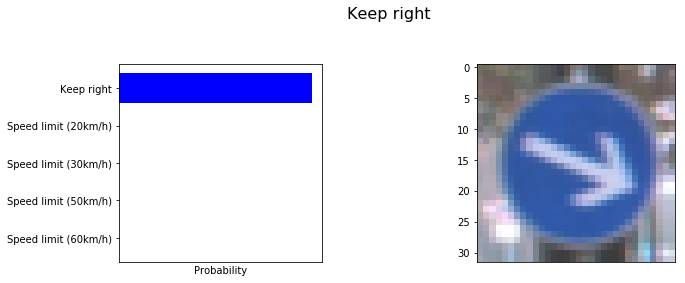

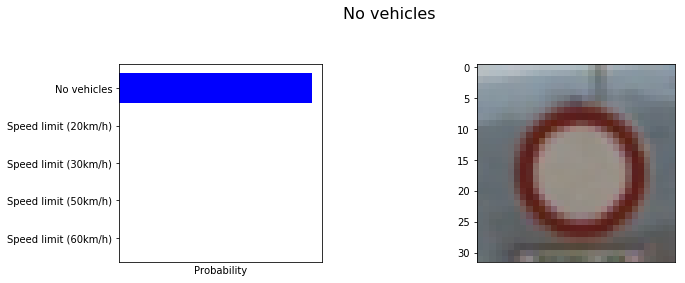

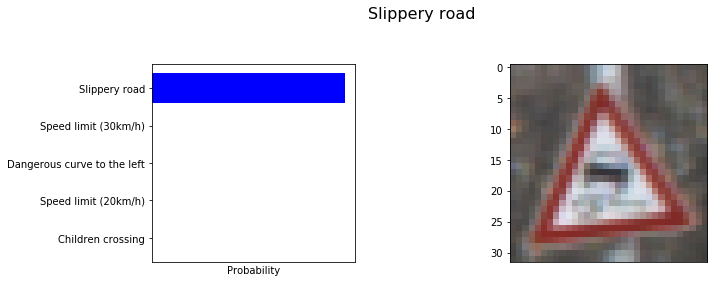

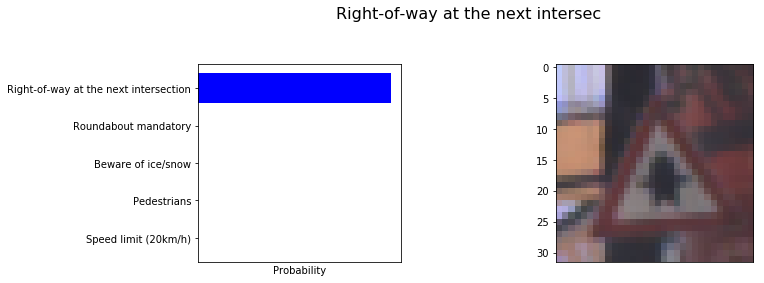

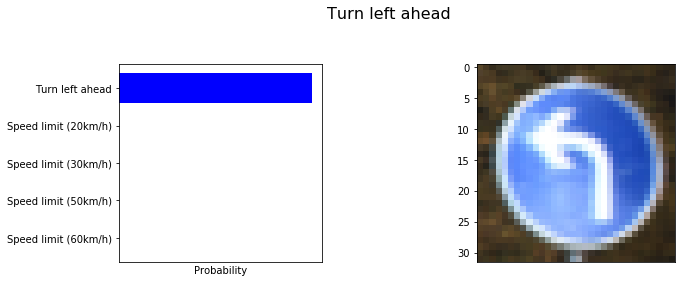

Epoch 66/200. . . Train Loss 0.09055. . . Train Acc 0.9735
Epoch 66/200. . . Train Loss 0.09039. . . Train Acc 0.9735
Epoch 66/200. . . Train Loss 0.09022. . . Train Acc 0.9736
Epoch 66/200. . . Train Loss 0.09006. . . Train Acc 0.9736
Epoch 66/200. . . Train Loss 0.08989. . . Train Acc 0.9737
Epoch 66/200. . . Train Loss 0.0897. . . Train Acc 0.9737

Caclulating loss & accuracy on  validation set...
Epoch 66/200. . . Val Loss 0.9591. . . Val Acc 0.9538
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (30km/h)> is 10% of total wrong
<Speed limit (50km/h)> is 5% of total wrong
<Speed limit (70km/h)> is 7% of total wrong
<Speed limit (100km/h> is 5% of total wrong
<Speed limit (120km/h> is 15% of total wrong
<No entry> is 7% of total wrong
<Dangerous curve to t> is 5% of total wrong
<Double curve> is 7% of total wrong
<Road work> is 7% of total wrong
<Pedestrians> is 6% of total wrong

Epoch 67/200. . . Train Loss 0.08956. . . Train Acc 0.9738
Epoch 67/2

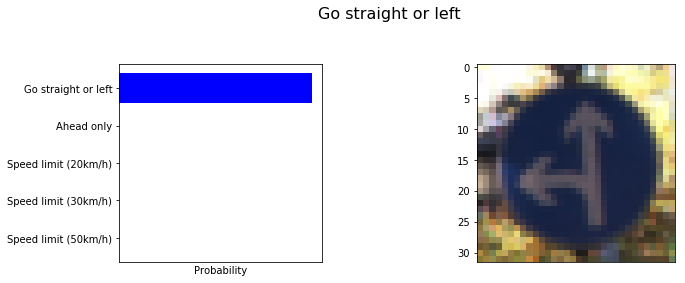

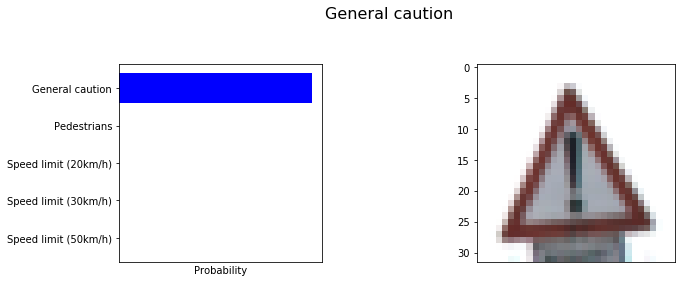

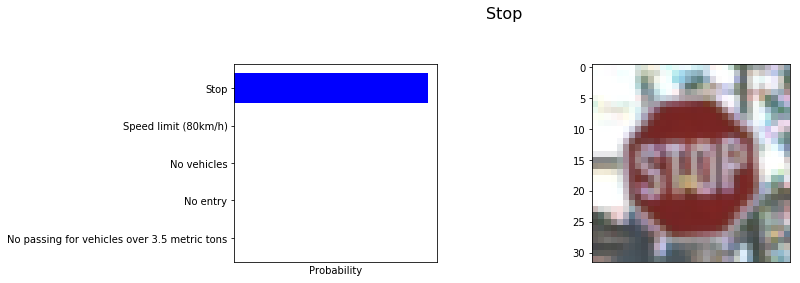

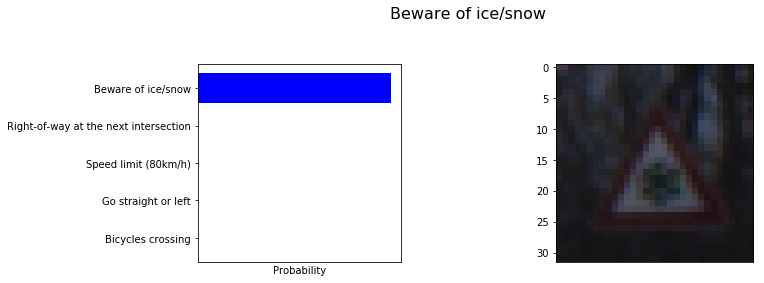

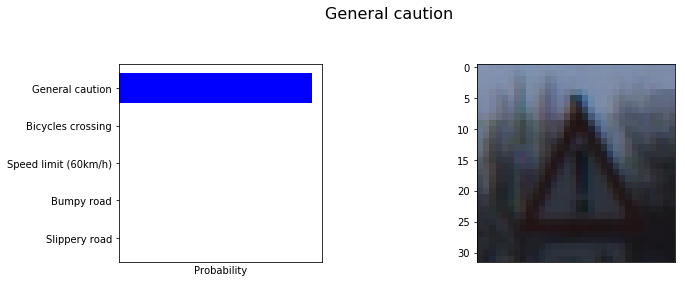

Epoch 71/200. . . Train Loss 0.08622. . . Train Acc 0.9748
Epoch 71/200. . . Train Loss 0.08605. . . Train Acc 0.9748
Epoch 71/200. . . Train Loss 0.08589. . . Train Acc 0.9749
Epoch 71/200. . . Train Loss 0.08575. . . Train Acc 0.9749
Epoch 71/200. . . Train Loss 0.08563. . . Train Acc 0.9749
Epoch 71/200. . . Train Loss 0.0855. . . Train Acc 0.975

Caclulating loss & accuracy on  validation set...
Epoch 71/200. . . Val Loss 2.377. . . Val Acc 0.9471

<Speed limit (30km/h)> is 7% of total wrong
<No entry> is 14% of total wrong
<Dangerous curve to t> is 8% of total wrong
<Double curve> is 7% of total wrong
<Road work> is 16% of total wrong
<Pedestrians> is 7% of total wrong
<Turn right ahead> is 9% of total wrong
<Roundabout mandatory> is 7% of total wrong

Epoch 72/200. . . Train Loss 0.08536. . . Train Acc 0.975
Epoch 72/200. . . Train Loss 0.08521. . . Train Acc 0.9751
Epoch 72/200. . . Train Loss 0.08508. . . Train Acc 0.9751
Epoch 72/200. . . Train Loss 0.08492. . . Train Acc 0.97

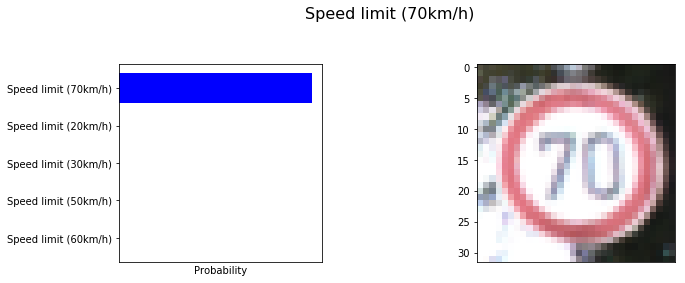

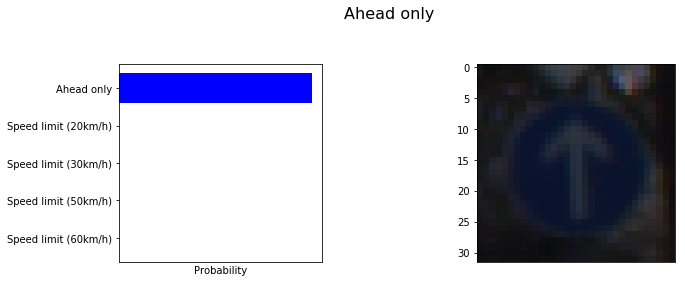

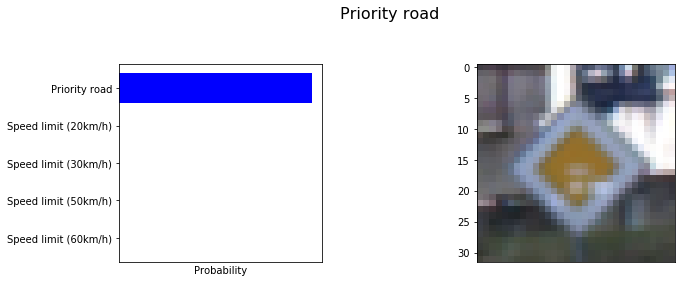

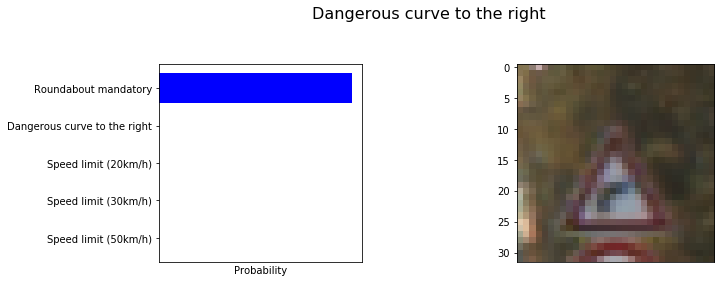

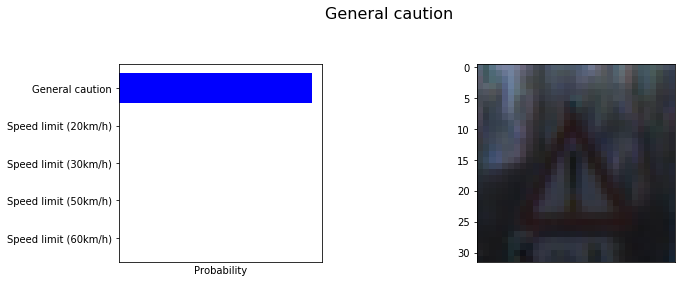

Epoch 76/200. . . Train Loss 0.08231. . . Train Acc 0.9759
Epoch 76/200. . . Train Loss 0.08219. . . Train Acc 0.9759
Epoch 76/200. . . Train Loss 0.08206. . . Train Acc 0.976
Epoch 76/200. . . Train Loss 0.08192. . . Train Acc 0.976
Epoch 76/200. . . Train Loss 0.08179. . . Train Acc 0.9761

Caclulating loss & accuracy on  validation set...
Epoch 76/200. . . Val Loss 1.927. . . Val Acc 0.9688
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (50km/h)> is 9% of total wrong
<No entry> is 20% of total wrong
<Dangerous curve to t> is 14% of total wrong
<Double curve> is 5% of total wrong
<Pedestrians> is 5% of total wrong
<Go straight or left> is 5% of total wrong
<Roundabout mandatory> is 9% of total wrong

Epoch 77/200. . . Train Loss 0.08166. . . Train Acc 0.9761
Epoch 77/200. . . Train Loss 0.08153. . . Train Acc 0.9761
Epoch 77/200. . . Train Loss 0.0814. . . Train Acc 0.9762
Epoch 77/200. . . Train Loss 0.08129. . . Train Acc 0.9762
Epoch 77/200. . .

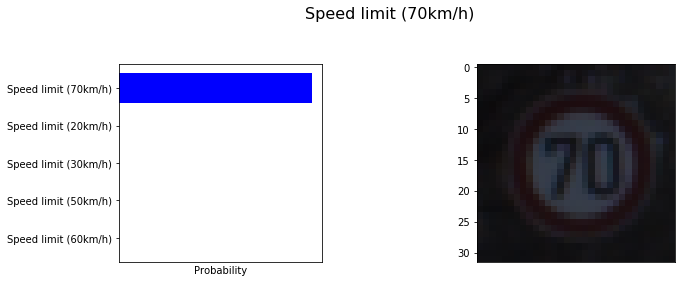

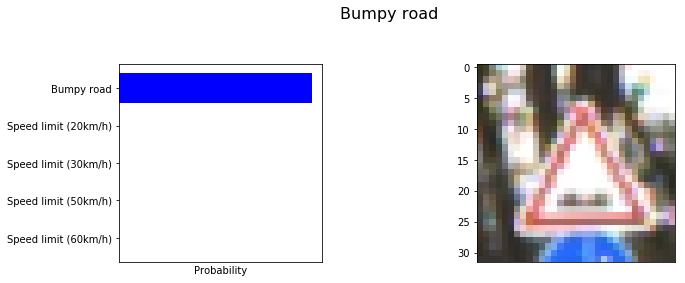

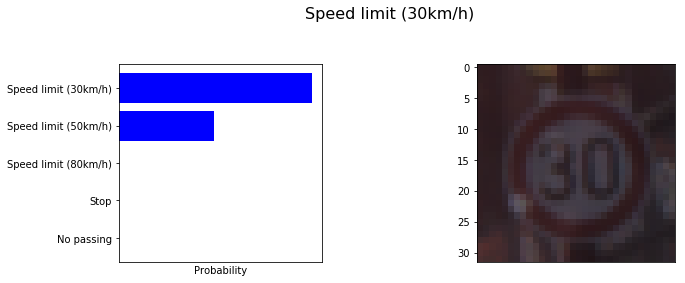

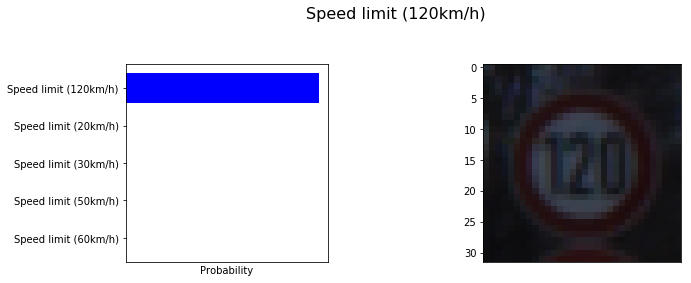

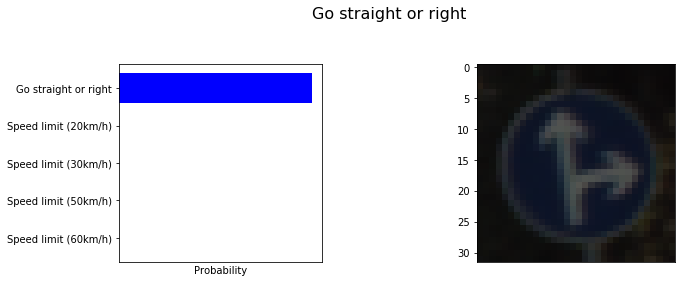

Epoch 81/200. . . Train Loss 0.07893. . . Train Acc 0.9769
Epoch 81/200. . . Train Loss 0.07882. . . Train Acc 0.9769
Epoch 81/200. . . Train Loss 0.07873. . . Train Acc 0.977
Epoch 81/200. . . Train Loss 0.07863. . . Train Acc 0.977
Epoch 81/200. . . Train Loss 0.07851. . . Train Acc 0.977

Caclulating loss & accuracy on  validation set...
Epoch 81/200. . . Val Loss 1.574. . . Val Acc 0.9584
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (50km/h)> is 6% of total wrong
<Speed limit (120km/h> is 5% of total wrong
<Right-of-way at the > is 6% of total wrong
<Vehicles over 3.5 me> is 10% of total wrong
<No entry> is 10% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Road work> is 14% of total wrong
<Pedestrians> is 13% of total wrong

Epoch 82/200. . . Train Loss 0.07839. . . Train Acc 0.9771
Epoch 82/200. . . Train Loss 0.07826. . . Train Acc 0.9771
Epoch 82/200. . . Train Loss 0.07814. . . Train Acc 0.9771
Epoch 82/200. . . Train Loss 0.0

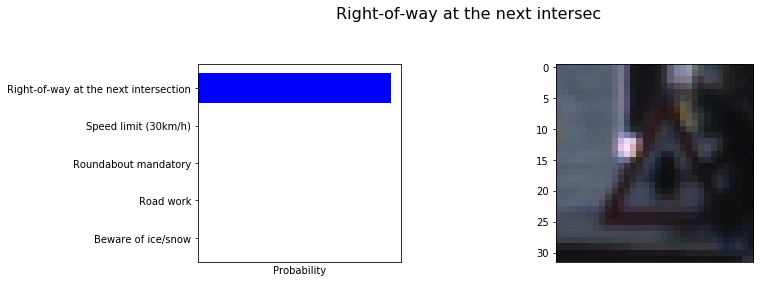

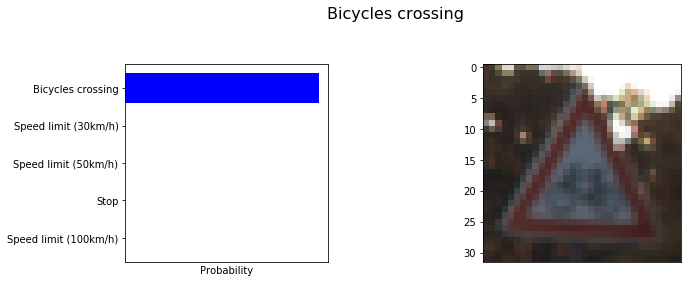

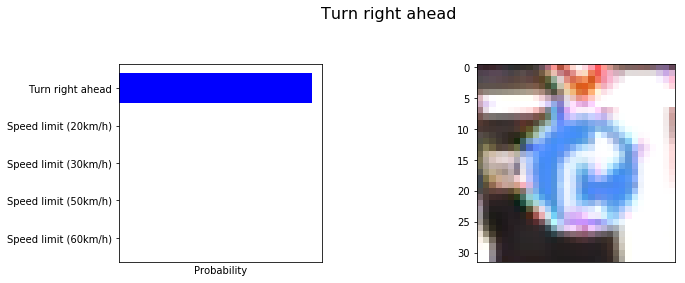

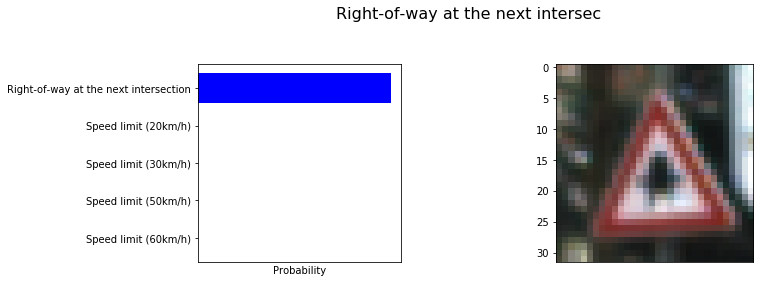

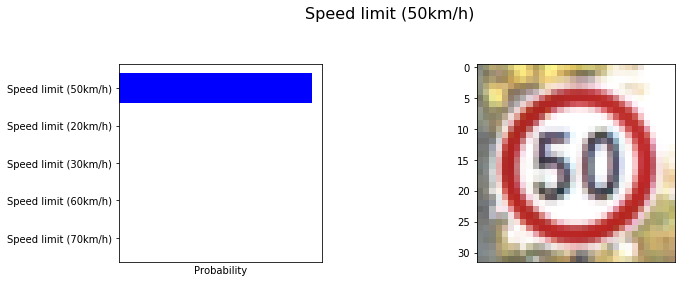

Epoch 86/200. . . Train Loss 0.0759. . . Train Acc 0.9778
Epoch 86/200. . . Train Loss 0.0758. . . Train Acc 0.9778
Epoch 86/200. . . Train Loss 0.07568. . . Train Acc 0.9778
Epoch 86/200. . . Train Loss 0.07557. . . Train Acc 0.9779
Epoch 86/200. . . Train Loss 0.07547. . . Train Acc 0.9779

Caclulating loss & accuracy on  validation set...
Epoch 86/200. . . Val Loss 2.311. . . Val Acc 0.9643
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (20km/h)> is 10% of total wrong
<Speed limit (30km/h)> is 8% of total wrong
<Speed limit (50km/h)> is 8% of total wrong
<No entry> is 12% of total wrong
<Dangerous curve to t> is 9% of total wrong
<Road work> is 15% of total wrong
<Pedestrians> is 13% of total wrong

Epoch 87/200. . . Train Loss 0.07537. . . Train Acc 0.9779
Epoch 87/200. . . Train Loss 0.07526. . . Train Acc 0.978
Epoch 87/200. . . Train Loss 0.07516. . . Train Acc 0.978
Epoch 87/200. . . Train Loss 0.07506. . . Train Acc 0.978
Epoch 87/200. . . T

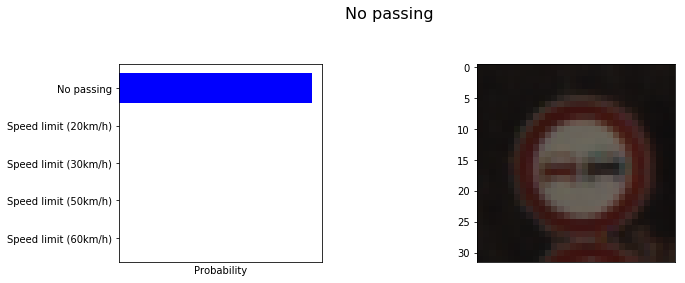

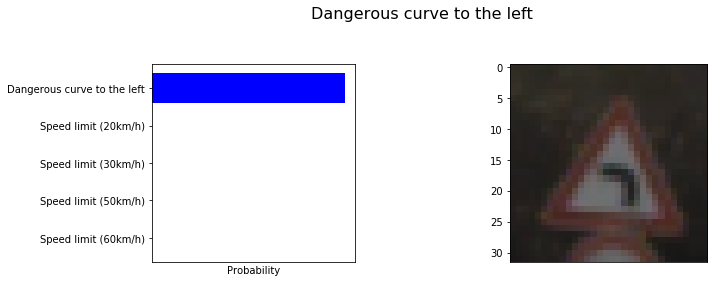

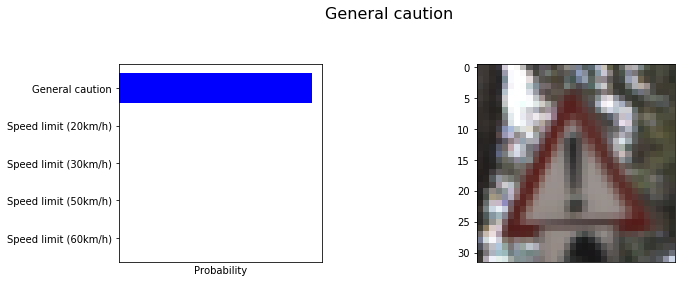

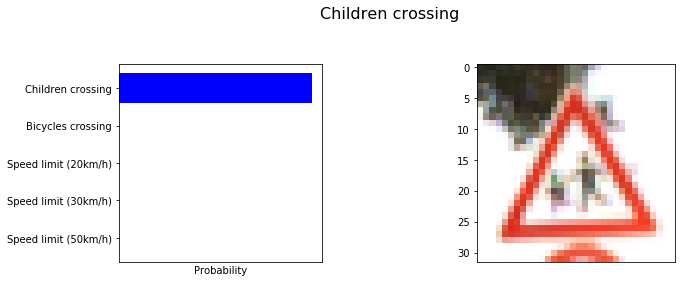

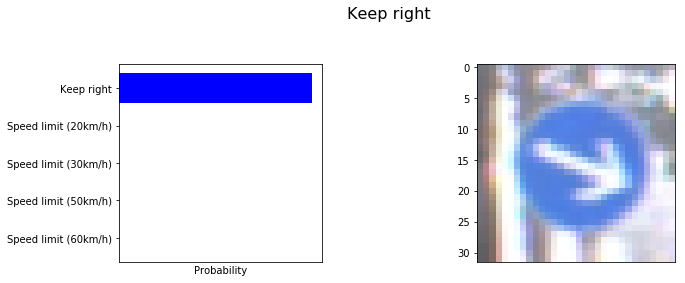

Epoch 91/200. . . Train Loss 0.0731. . . Train Acc 0.9786
Epoch 91/200. . . Train Loss 0.07301. . . Train Acc 0.9786
Epoch 91/200. . . Train Loss 0.07292. . . Train Acc 0.9786
Epoch 91/200. . . Train Loss 0.07283. . . Train Acc 0.9787
Epoch 91/200. . . Train Loss 0.07274. . . Train Acc 0.9787
Epoch 91/200. . . Train Loss 0.07265. . . Train Acc 0.9787

Caclulating loss & accuracy on  validation set...
Epoch 91/200. . . Val Loss 2.64. . . Val Acc 0.9639
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (30km/h)> is 6% of total wrong
<Speed limit (120km/h> is 14% of total wrong
<No entry> is 11% of total wrong
<Dangerous curve to t> is 20% of total wrong
<Double curve> is 9% of total wrong
<Turn right ahead> is 6% of total wrong

Epoch 92/200. . . Train Loss 0.07257. . . Train Acc 0.9787
Epoch 92/200. . . Train Loss 0.07246. . . Train Acc 0.9788
Epoch 92/200. . . Train Loss 0.07237. . . Train Acc 0.9788
Epoch 92/200. . . Train Loss 0.07229. . . Train Acc 0

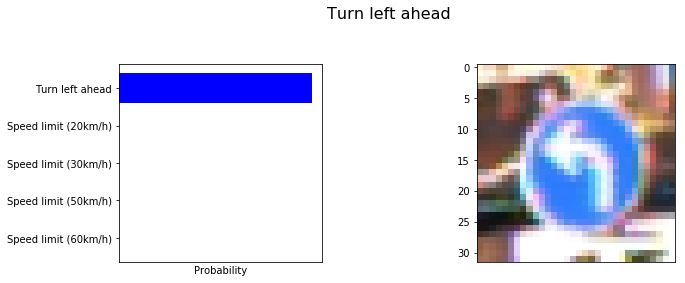

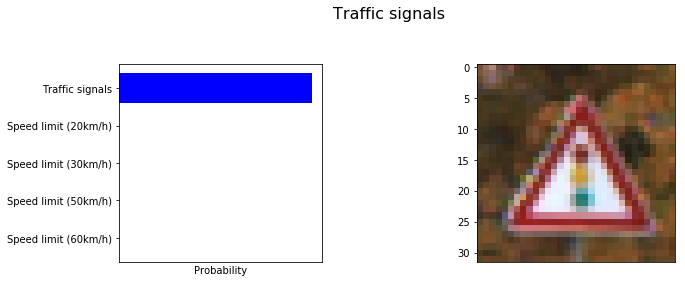

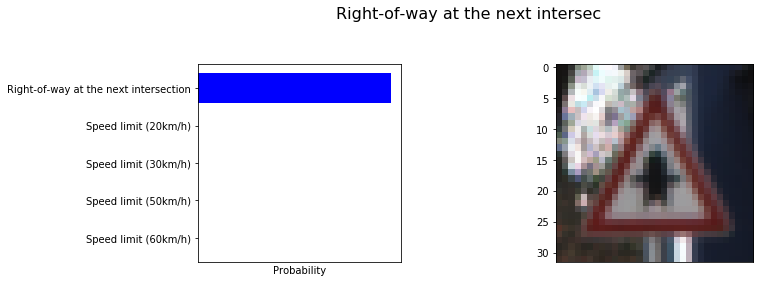

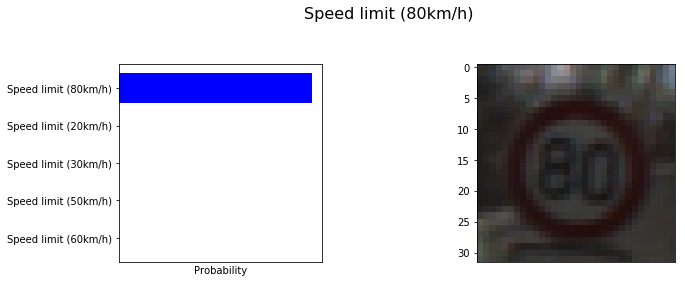

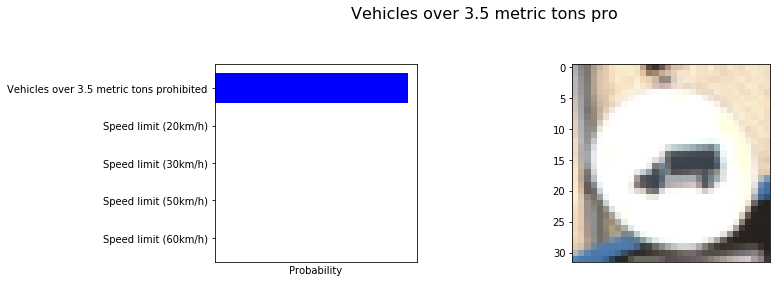

Epoch 96/200. . . Train Loss 0.07061. . . Train Acc 0.9793
Epoch 96/200. . . Train Loss 0.07051. . . Train Acc 0.9793
Epoch 96/200. . . Train Loss 0.07043. . . Train Acc 0.9794
Epoch 96/200. . . Train Loss 0.07035. . . Train Acc 0.9794
Epoch 96/200. . . Train Loss 0.07025. . . Train Acc 0.9794
Epoch 96/200. . . Train Loss 0.07015. . . Train Acc 0.9795

Caclulating loss & accuracy on  validation set...
Epoch 96/200. . . Val Loss 3.316. . . Val Acc 0.9668
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (20km/h)> is 6% of total wrong
<Speed limit (30km/h)> is 8% of total wrong
<Speed limit (100km/h> is 8% of total wrong
<Speed limit (120km/h> is 7% of total wrong
<No entry> is 14% of total wrong
<Dangerous curve to t> is 8% of total wrong
<Road work> is 12% of total wrong
<Pedestrians> is 10% of total wrong

Epoch 97/200. . . Train Loss 0.07005. . . Train Acc 0.9795
Epoch 97/200. . . Train Loss 0.06996. . . Train Acc 0.9795
Epoch 97/200. . . Train Loss 0

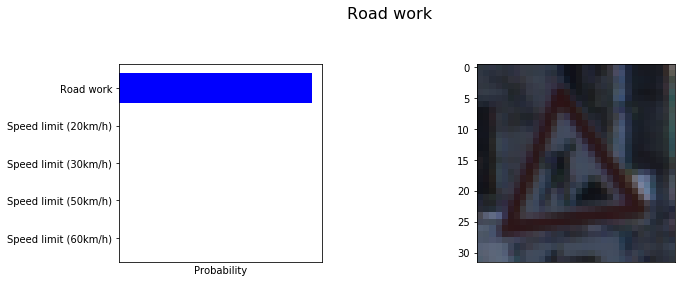

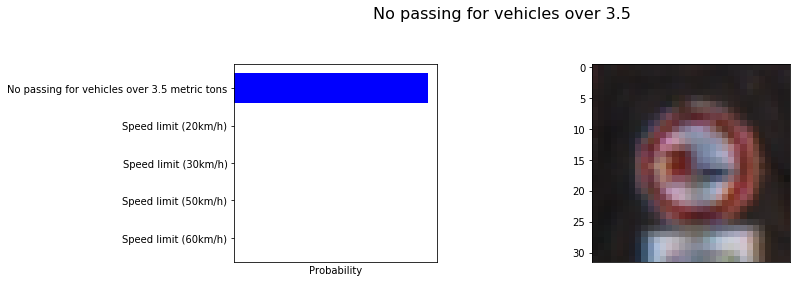

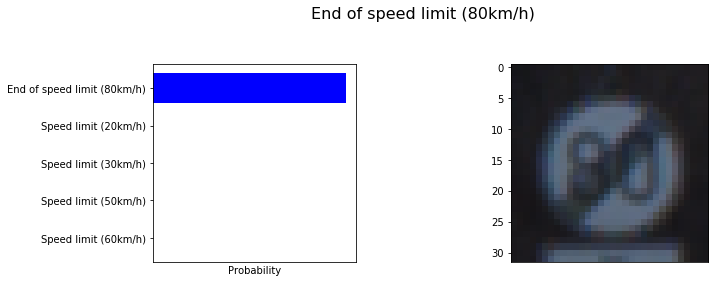

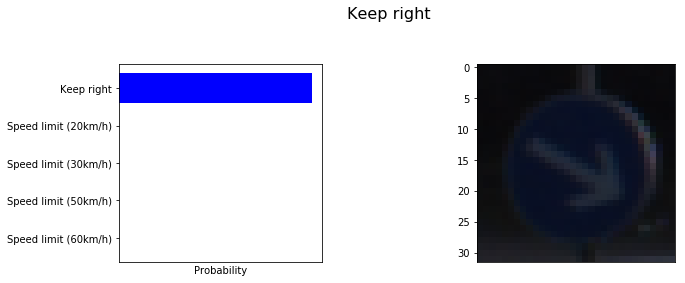

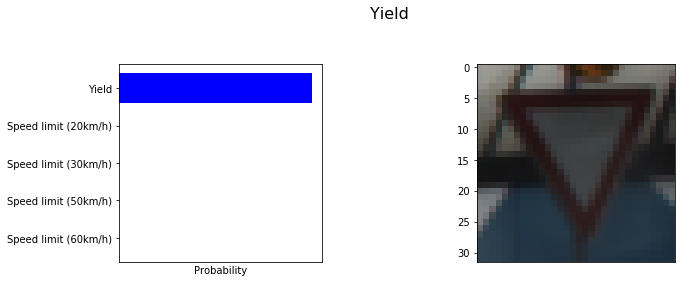

Epoch 101/200. . . Train Loss 0.06819. . . Train Acc 0.98
Epoch 101/200. . . Train Loss 0.0681. . . Train Acc 0.9801
Epoch 101/200. . . Train Loss 0.06804. . . Train Acc 0.9801
Epoch 101/200. . . Train Loss 0.06797. . . Train Acc 0.9801
Epoch 101/200. . . Train Loss 0.06789. . . Train Acc 0.9801

Caclulating loss & accuracy on  validation set...
Epoch 101/200. . . Val Loss 3.483. . . Val Acc 0.9697
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (50km/h)> is 9% of total wrong
<Speed limit (120km/h> is 6% of total wrong
<No entry> is 15% of total wrong
<Dangerous curve to t> is 10% of total wrong
<Road work> is 18% of total wrong
<Pedestrians> is 10% of total wrong

Epoch 102/200. . . Train Loss 0.06781. . . Train Acc 0.9801
Epoch 102/200. . . Train Loss 0.06774. . . Train Acc 0.9802
Epoch 102/200. . . Train Loss 0.06767. . . Train Acc 0.9802
Epoch 102/200. . . Train Loss 0.0676. . . Train Acc 0.9802
Epoch 102/200. . . Train Loss 0.06751. . . Train Acc

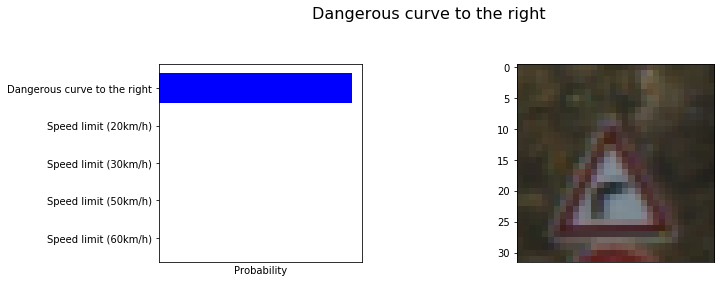

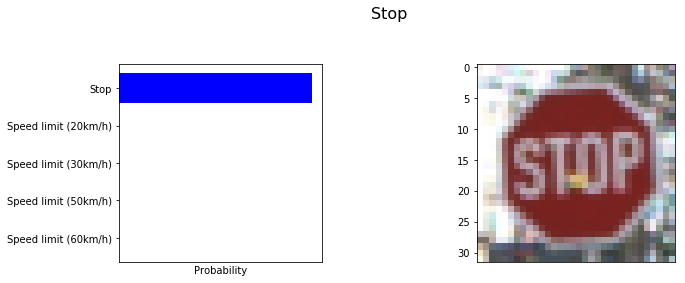

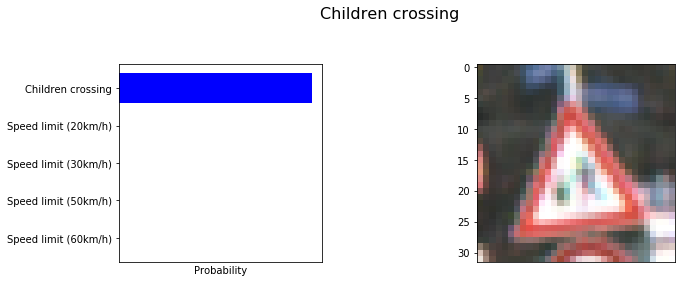

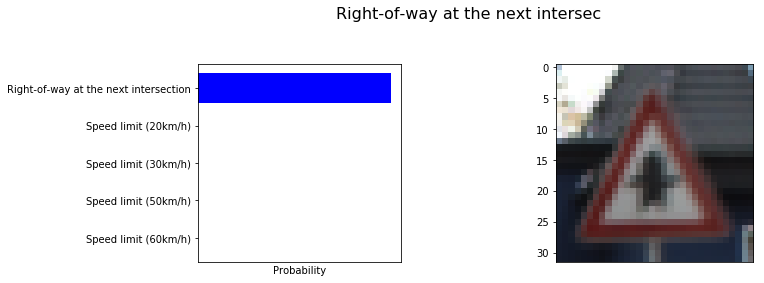

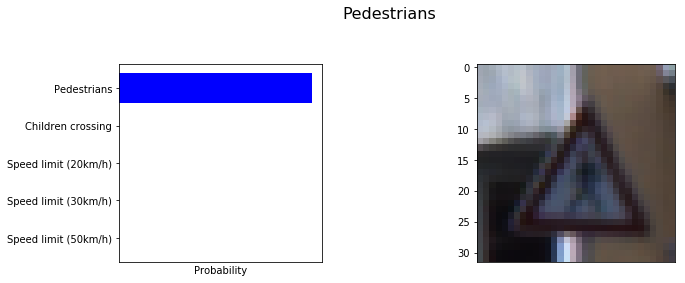

Epoch 106/200. . . Train Loss 0.06613. . . Train Acc 0.9806
Epoch 106/200. . . Train Loss 0.06605. . . Train Acc 0.9807
Epoch 106/200. . . Train Loss 0.06596. . . Train Acc 0.9807
Epoch 106/200. . . Train Loss 0.0659. . . Train Acc 0.9807
Epoch 106/200. . . Train Loss 0.06583. . . Train Acc 0.9807

Caclulating loss & accuracy on  validation set...
Epoch 106/200. . . Val Loss 4.649. . . Val Acc 0.971
mkdir: cannot create directory ‘checks_97’: File exists
Model Saved!

<Speed limit (50km/h)> is 7% of total wrong
<No entry> is 23% of total wrong
<Dangerous curve to t> is 9% of total wrong
<Road work> is 6% of total wrong
<Pedestrians> is 9% of total wrong

Epoch 107/200. . . Train Loss 0.06575. . . Train Acc 0.9807
Epoch 107/200. . . Train Loss 0.06566. . . Train Acc 0.9808
Epoch 107/200. . . Train Loss 0.06559. . . Train Acc 0.9808
Epoch 107/200. . . Train Loss 0.06553. . . Train Acc 0.9808
Epoch 107/200. . . Train Loss 0.06546. . . Train Acc 0.9808
Epoch 107/200. . . Train Loss 0.06539

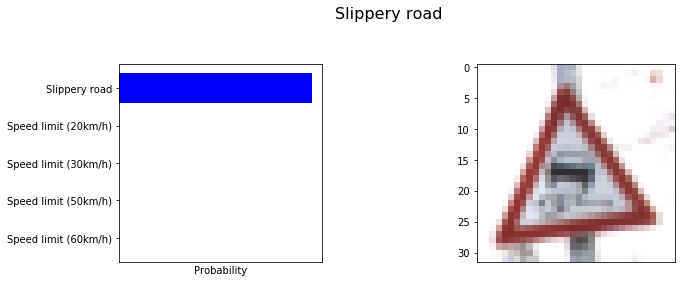

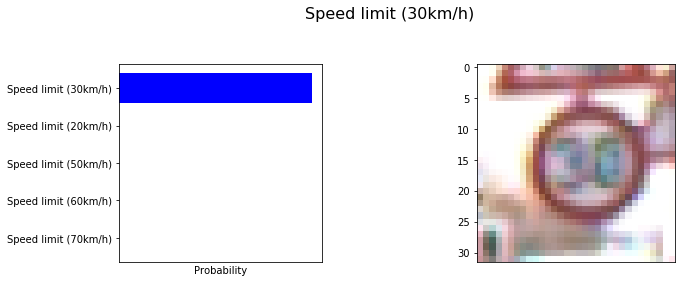

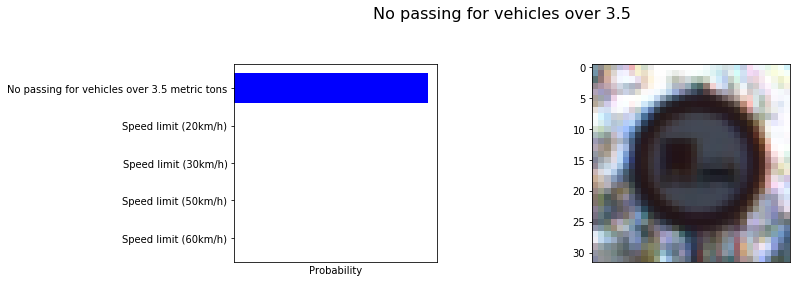

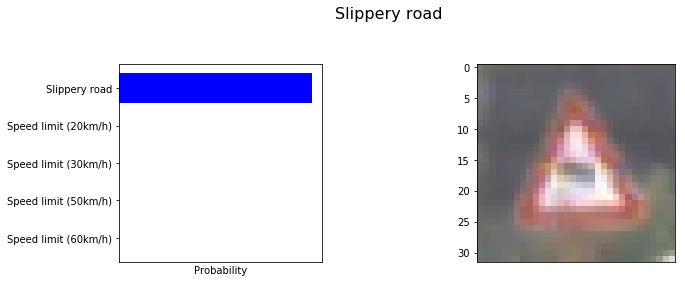

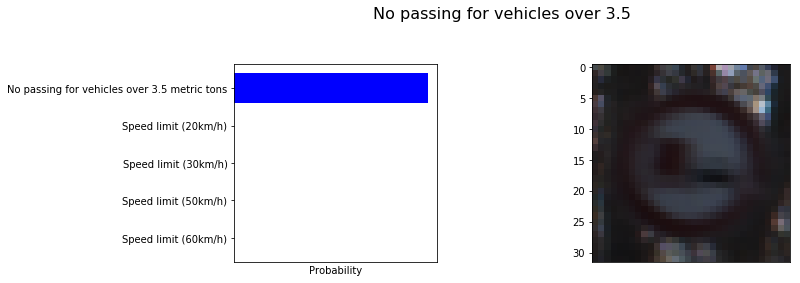

Epoch 111/200. . . Train Loss 0.0642. . . Train Acc 0.9812
Epoch 111/200. . . Train Loss 0.06414. . . Train Acc 0.9812
Epoch 111/200. . . Train Loss 0.06408. . . Train Acc 0.9812
Epoch 111/200. . . Train Loss 0.064. . . Train Acc 0.9813
Epoch 111/200. . . Train Loss 0.06393. . . Train Acc 0.9813

Caclulating loss & accuracy on  validation set...
Epoch 111/200. . . Val Loss 5.379. . . Val Acc 0.9662
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (50km/h)> is 9% of total wrong
<Speed limit (120km/h> is 7% of total wrong
<No entry> is 18% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Road work> is 15% of total wrong
<Pedestrians> is 9% of total wrong
<Roundabout mandatory> is 9% of total wrong

Epoch 112/200. . . Train Loss 0.06385. . . Train Acc 0.9813
Epoch 112/200. . . Train Loss 0.06377. . . Train Acc 0.9813
Epoch 112/200. . . Train Loss 0.06372. . . Train Acc 0.9813
Epoch 112/200. . . Train Loss 0.06365. . . Train Acc 0.9814
Epoch 112

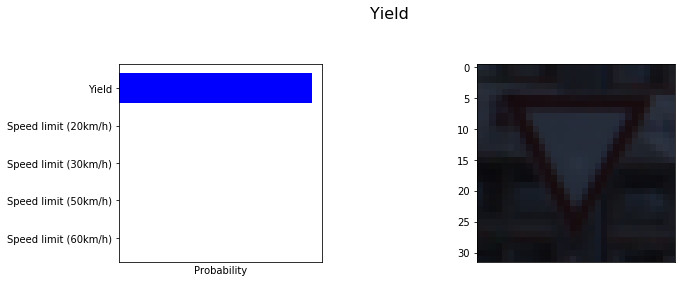

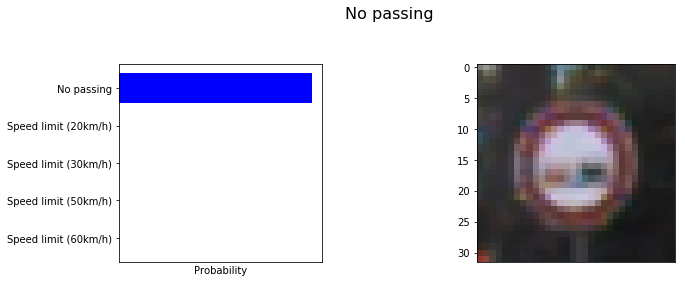

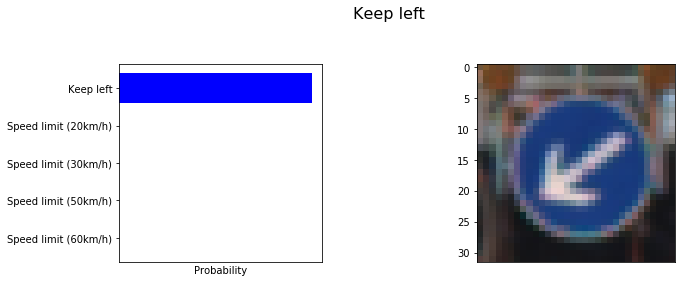

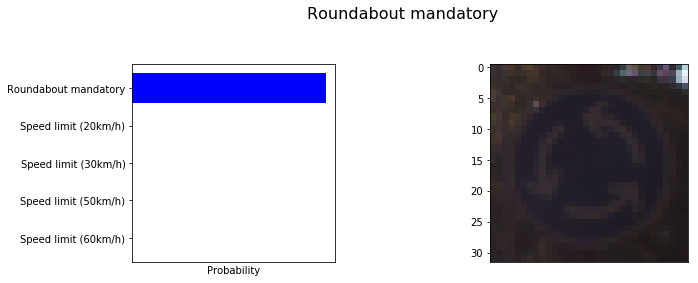

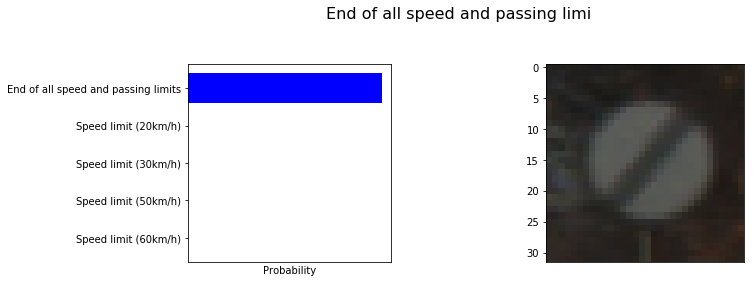

Epoch 116/200. . . Train Loss 0.06239. . . Train Acc 0.9817
Epoch 116/200. . . Train Loss 0.06232. . . Train Acc 0.9818
Epoch 116/200. . . Train Loss 0.06226. . . Train Acc 0.9818
Epoch 116/200. . . Train Loss 0.06222. . . Train Acc 0.9818
Epoch 116/200. . . Train Loss 0.06218. . . Train Acc 0.9818
Epoch 116/200. . . Train Loss 0.06211. . . Train Acc 0.9818

Caclulating loss & accuracy on  validation set...
Epoch 116/200. . . Val Loss 7.063. . . Val Acc 0.9561
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (80km/h)> is 11% of total wrong
<Right-of-way at the > is 8% of total wrong
<No entry> is 13% of total wrong
<Dangerous curve to t> is 9% of total wrong
<Double curve> is 7% of total wrong
<Pedestrians> is 14% of total wrong
<Children crossing> is 11% of total wrong

Epoch 117/200. . . Train Loss 0.06206. . . Train Acc 0.9818
Epoch 117/200. . . Train Loss 0.062. . . Train Acc 0.9819
Epoch 117/200. . . Train Loss 0.06193. . . Train Acc 0.9819
Epoch 

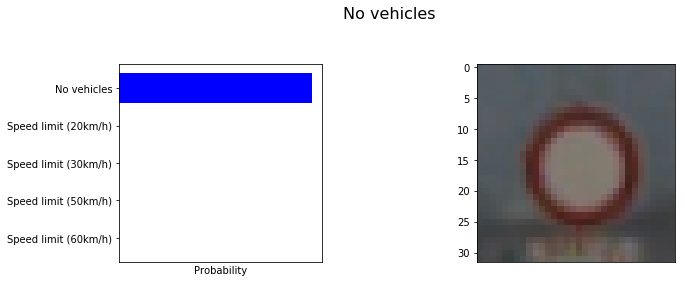

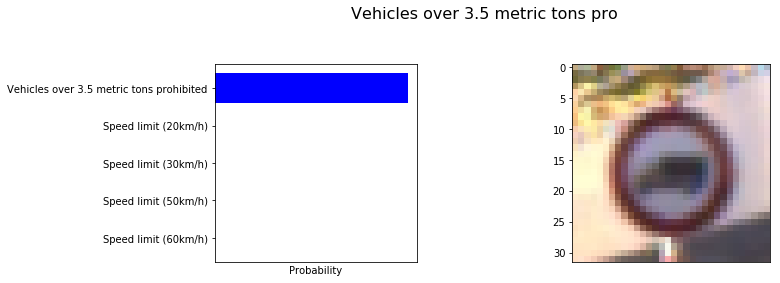

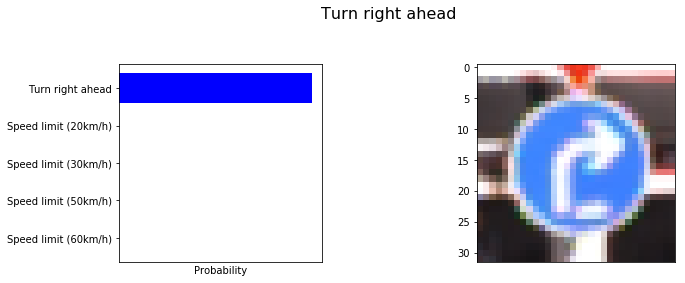

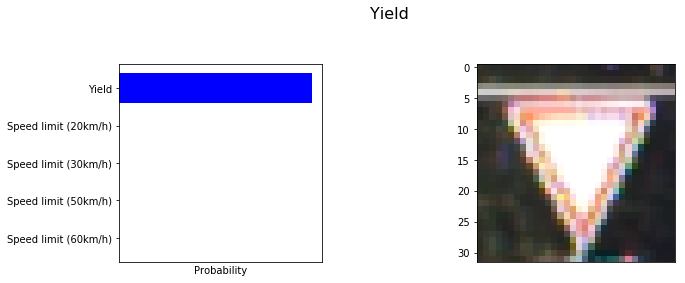

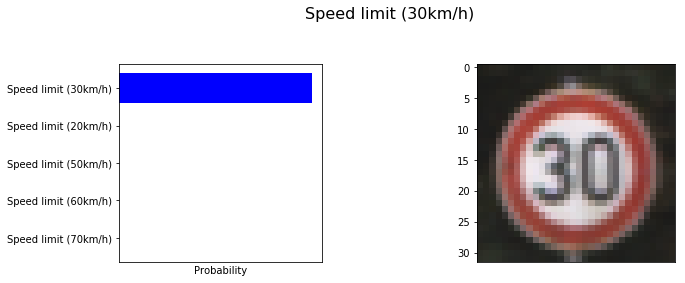

Epoch 121/200. . . Train Loss 0.06084. . . Train Acc 0.9822
Epoch 121/200. . . Train Loss 0.06079. . . Train Acc 0.9822
Epoch 121/200. . . Train Loss 0.06072. . . Train Acc 0.9822
Epoch 121/200. . . Train Loss 0.06066. . . Train Acc 0.9823
Epoch 121/200. . . Train Loss 0.0606. . . Train Acc 0.9823
Epoch 121/200. . . Train Loss 0.06054. . . Train Acc 0.9823

Caclulating loss & accuracy on  validation set...
Epoch 121/200. . . Val Loss 9.552. . . Val Acc 0.9525
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (30km/h)> is 6% of total wrong
<Speed limit (80km/h)> is 6% of total wrong
<No entry> is 12% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Road work> is 13% of total wrong
<Pedestrians> is 6% of total wrong
<Children crossing> is 6% of total wrong
<Roundabout mandatory> is 15% of total wrong

Epoch 122/200. . . Train Loss 0.06048. . . Train Acc 0.9823
Epoch 122/200. . . Train Loss 0.06042. . . Train Acc 0.9823
Epoch 122/200. . . Train 

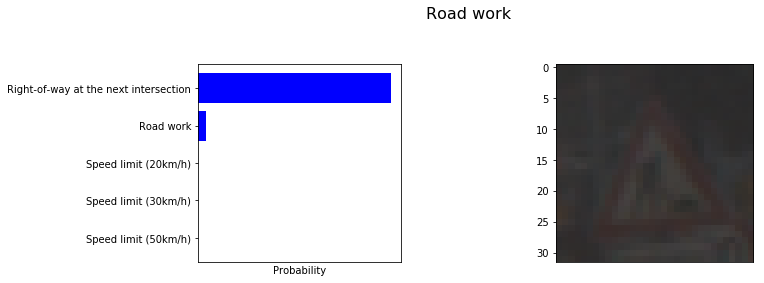

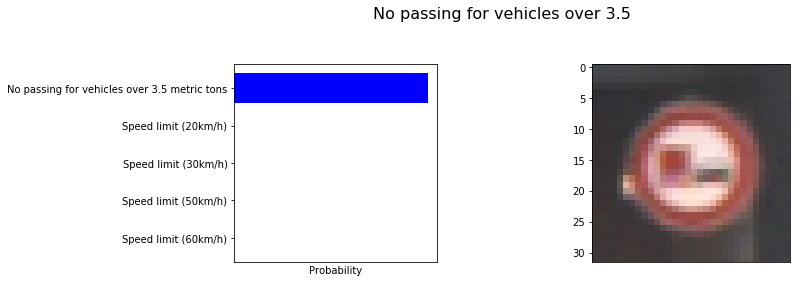

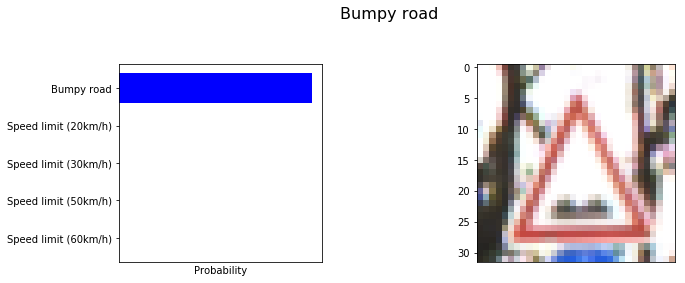

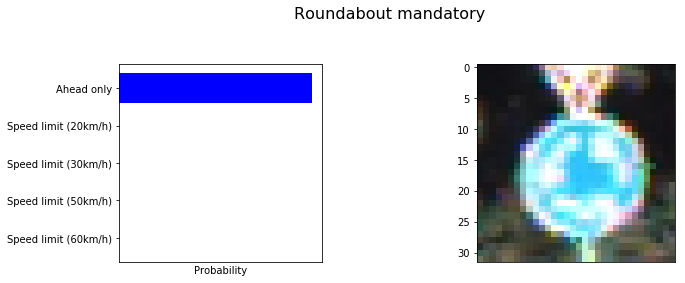

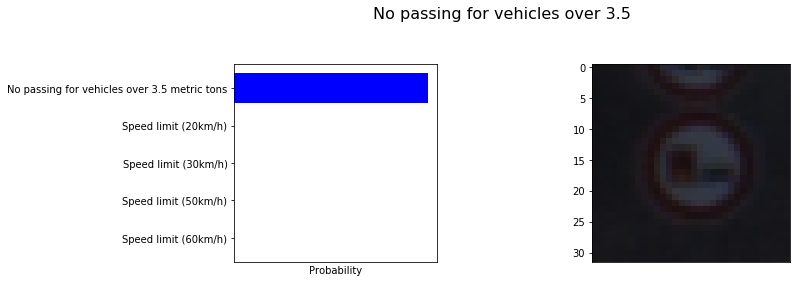

Epoch 126/200. . . Train Loss 0.05925. . . Train Acc 0.9827
Epoch 126/200. . . Train Loss 0.05919. . . Train Acc 0.9827
Epoch 126/200. . . Train Loss 0.05914. . . Train Acc 0.9827
Epoch 126/200. . . Train Loss 0.05908. . . Train Acc 0.9827
Epoch 126/200. . . Train Loss 0.05902. . . Train Acc 0.9827

Caclulating loss & accuracy on  validation set...
Epoch 126/200. . . Val Loss 9.476. . . Val Acc 0.9525
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (20km/h)> is 8% of total wrong
<Speed limit (80km/h)> is 10% of total wrong
<Speed limit (120km/h> is 18% of total wrong
<No entry> is 14% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Road work> is 6% of total wrong
<Pedestrians> is 7% of total wrong
<Roundabout mandatory> is 11% of total wrong

Epoch 127/200. . . Train Loss 0.05896. . . Train Acc 0.9828
Epoch 127/200. . . Train Loss 0.05891. . . Train Acc 0.9828
Epoch 127/200. . . Train Loss 0.05885. . . Train Acc 0.9828
Epoch 127/200. . . T

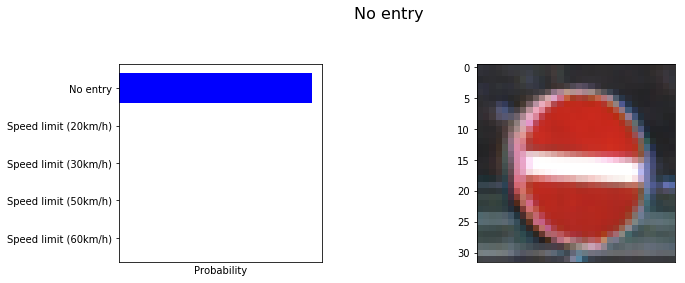

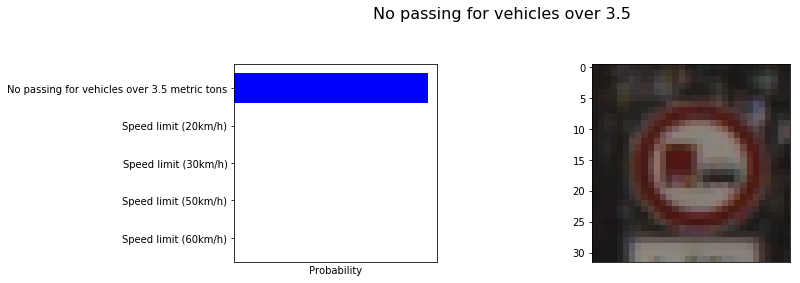

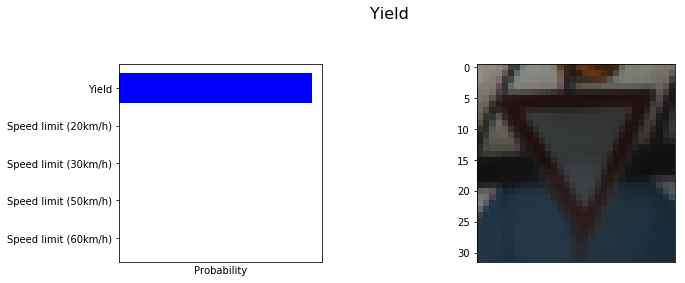

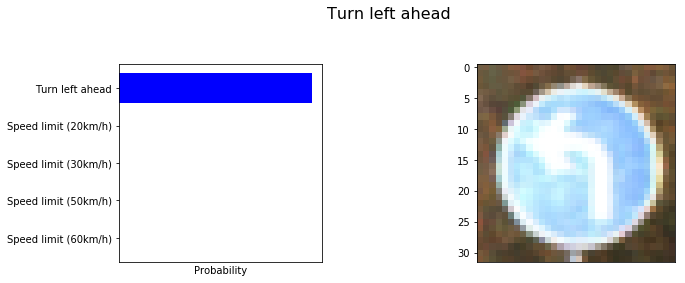

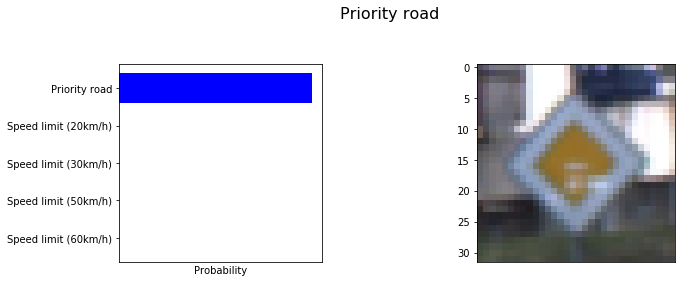

Epoch 131/200. . . Train Loss 0.05779. . . Train Acc 0.9831
Epoch 131/200. . . Train Loss 0.05774. . . Train Acc 0.9831
Epoch 131/200. . . Train Loss 0.0577. . . Train Acc 0.9831
Epoch 131/200. . . Train Loss 0.05764. . . Train Acc 0.9831
Epoch 131/200. . . Train Loss 0.05758. . . Train Acc 0.9832

Caclulating loss & accuracy on  validation set...
Epoch 131/200. . . Val Loss 10.33. . . Val Acc 0.9449

<Speed limit (80km/h)> is 16% of total wrong
<Speed limit (120km/h> is 8% of total wrong
<No passing> is 12% of total wrong
<Vehicles over 3.5 me> is 7% of total wrong
<No entry> is 13% of total wrong
<Dangerous curve to t> is 8% of total wrong
<Double curve> is 6% of total wrong

Epoch 132/200. . . Train Loss 0.05752. . . Train Acc 0.9832
Epoch 132/200. . . Train Loss 0.05746. . . Train Acc 0.9832
Epoch 132/200. . . Train Loss 0.0574. . . Train Acc 0.9832
Epoch 132/200. . . Train Loss 0.05735. . . Train Acc 0.9832
Epoch 132/200. . . Train Loss 0.0573. . . Train Acc 0.9832
Epoch 132/200. 

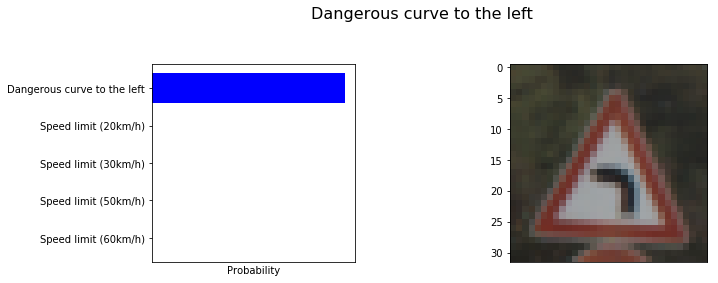

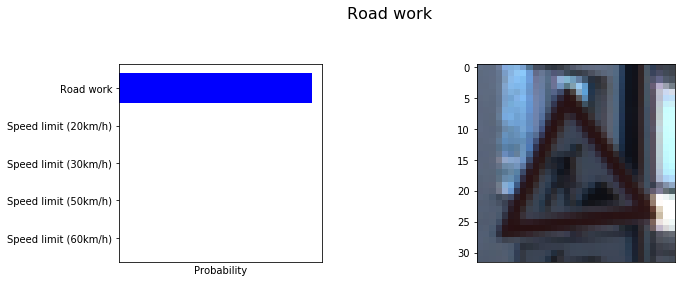

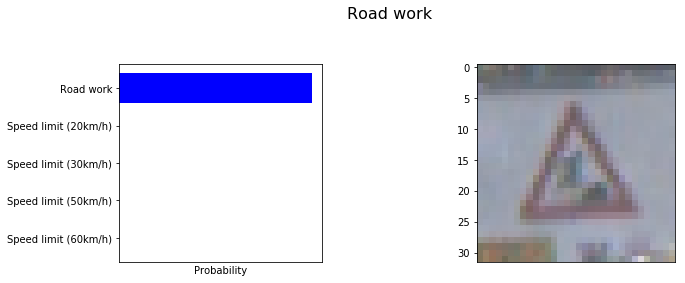

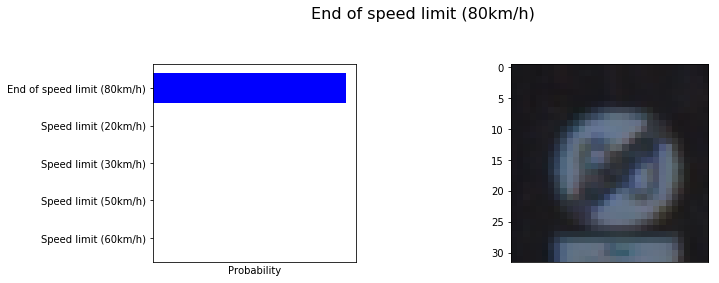

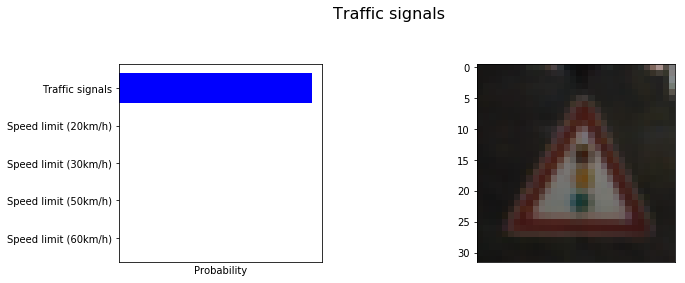

Epoch 136/200. . . Train Loss 0.05644. . . Train Acc 0.9835
Epoch 136/200. . . Train Loss 0.05639. . . Train Acc 0.9835
Epoch 136/200. . . Train Loss 0.05633. . . Train Acc 0.9835
Epoch 136/200. . . Train Loss 0.05628. . . Train Acc 0.9835
Epoch 136/200. . . Train Loss 0.05623. . . Train Acc 0.9836

Caclulating loss & accuracy on  validation set...
Epoch 136/200. . . Val Loss 13.28. . . Val Acc 0.9526
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (80km/h)> is 7% of total wrong
<Speed limit (120km/h> is 13% of total wrong
<No entry> is 11% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Road work> is 9% of total wrong
<Pedestrians> is 6% of total wrong
<Children crossing> is 13% of total wrong
<Beware of ice/snow> is 9% of total wrong

Epoch 137/200. . . Train Loss 0.05619. . . Train Acc 0.9836
Epoch 137/200. . . Train Loss 0.05615. . . Train Acc 0.9836
Epoch 137/200. . . Train Loss 0.0561. . . Train Acc 0.9836
Epoch 137/200. . . Train Lo

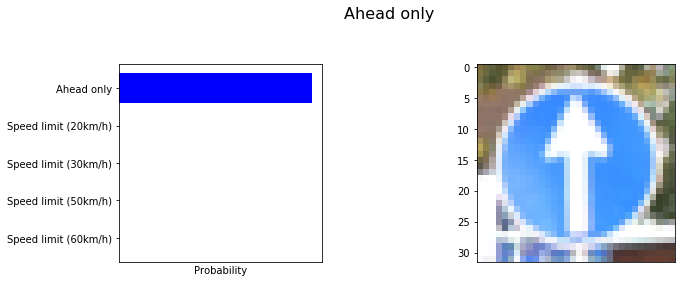

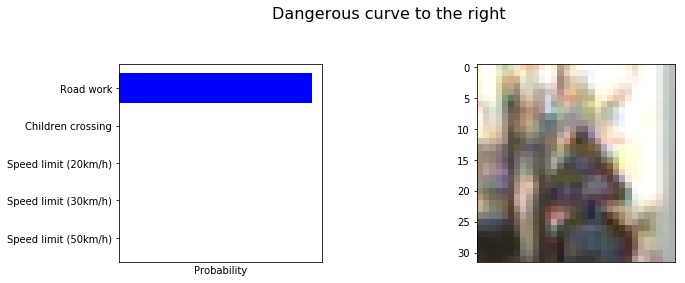

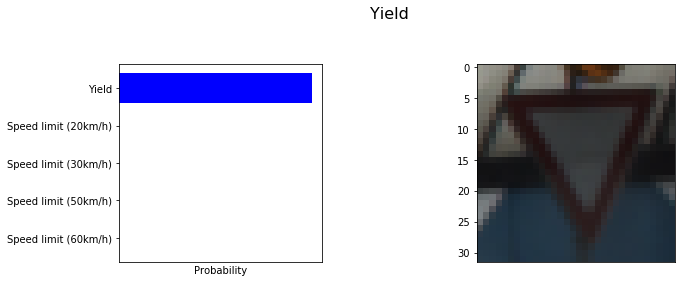

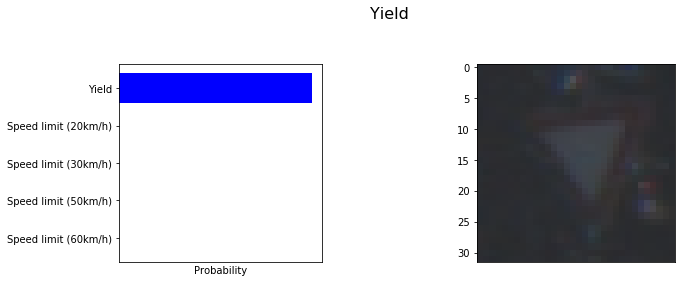

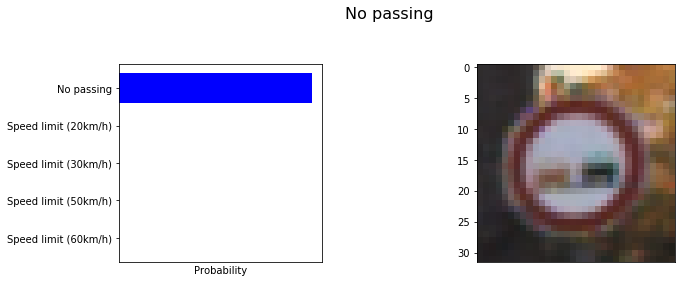

Epoch 141/200. . . Train Loss 0.05518. . . Train Acc 0.9839
Epoch 141/200. . . Train Loss 0.05513. . . Train Acc 0.9839
Epoch 141/200. . . Train Loss 0.05508. . . Train Acc 0.9839
Epoch 141/200. . . Train Loss 0.05504. . . Train Acc 0.9839
Epoch 141/200. . . Train Loss 0.055. . . Train Acc 0.9839
Epoch 141/200. . . Train Loss 0.05496. . . Train Acc 0.9839

Caclulating loss & accuracy on  validation set...
Epoch 141/200. . . Val Loss 10.93. . . Val Acc 0.9586
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (50km/h)> is 5% of total wrong
<Speed limit (120km/h> is 7% of total wrong
<No entry> is 13% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Road work> is 17% of total wrong
<Pedestrians> is 8% of total wrong
<Beware of ice/snow> is 12% of total wrong

Epoch 142/200. . . Train Loss 0.05492. . . Train Acc 0.9839
Epoch 142/200. . . Train Loss 0.05487. . . Train Acc 0.984
Epoch 142/200. . . Train Loss 0.05482. . . Train Acc 0.984
Epoch 142/2

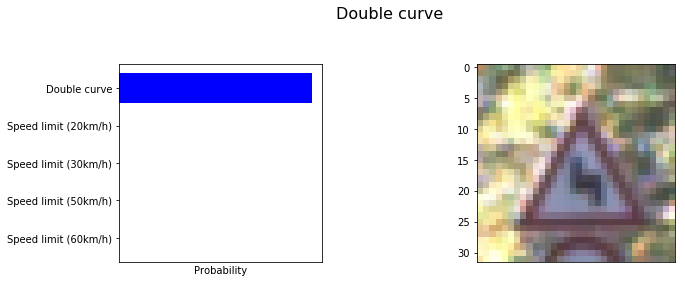

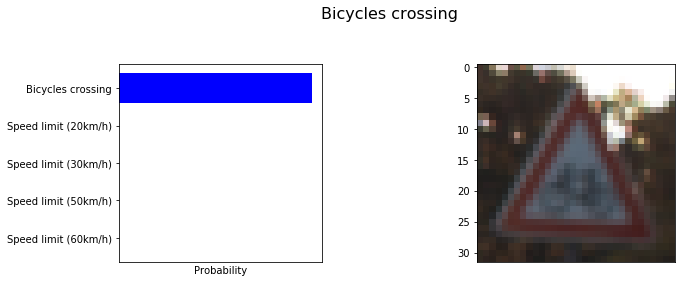

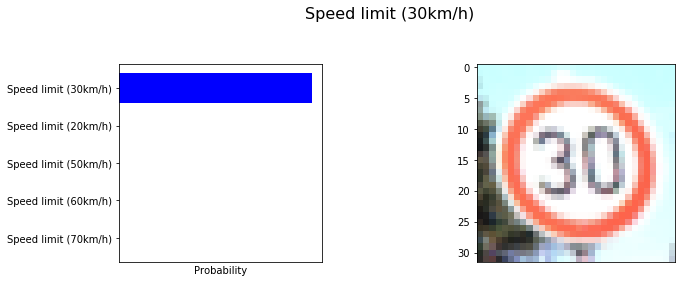

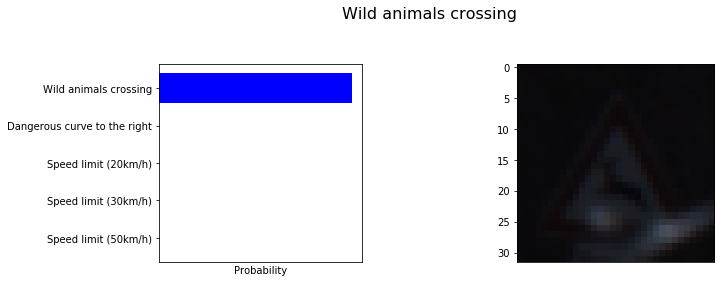

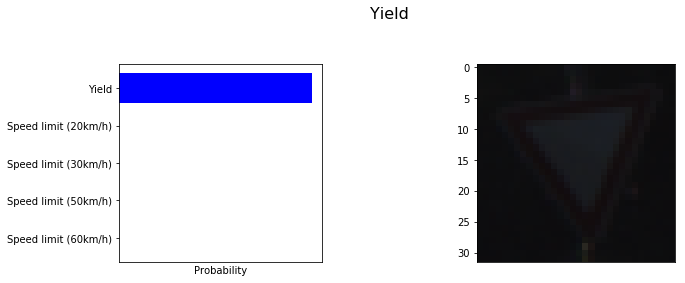

Epoch 146/200. . . Train Loss 0.054. . . Train Acc 0.9842
Epoch 146/200. . . Train Loss 0.05397. . . Train Acc 0.9842
Epoch 146/200. . . Train Loss 0.05393. . . Train Acc 0.9842
Epoch 146/200. . . Train Loss 0.0539. . . Train Acc 0.9842
Epoch 146/200. . . Train Loss 0.05386. . . Train Acc 0.9843
Epoch 146/200. . . Train Loss 0.05382. . . Train Acc 0.9843

Caclulating loss & accuracy on  validation set...
Epoch 146/200. . . Val Loss 14.01. . . Val Acc 0.9619
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (50km/h)> is 7% of total wrong
<End of speed limit (> is 6% of total wrong
<No entry> is 14% of total wrong
<Dangerous curve to t> is 10% of total wrong
<Road work> is 12% of total wrong
<Pedestrians> is 7% of total wrong
<Beware of ice/snow> is 9% of total wrong
<Turn left ahead> is 6% of total wrong

Epoch 147/200. . . Train Loss 0.05378. . . Train Acc 0.9843
Epoch 147/200. . . Train Loss 0.05373. . . Train Acc 0.9843
Epoch 147/200. . . Train Loss 0

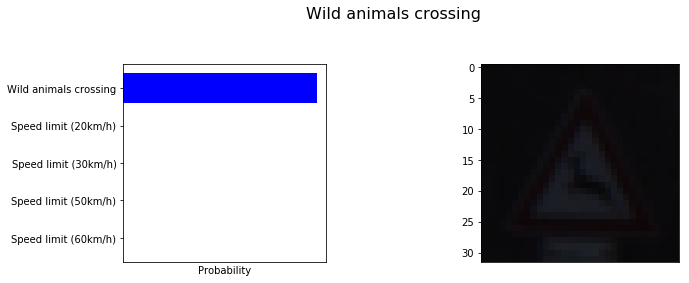

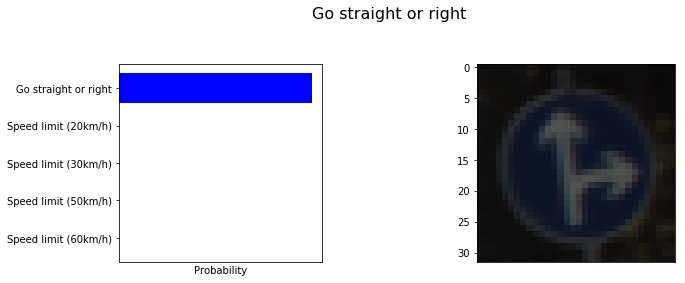

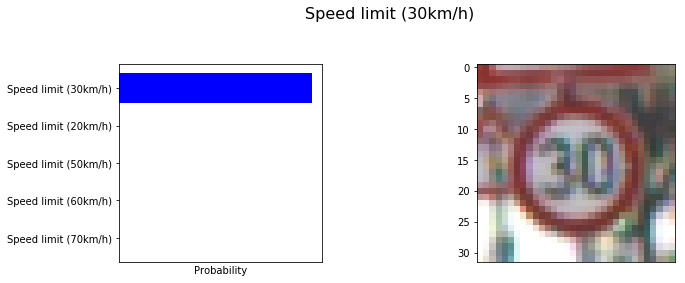

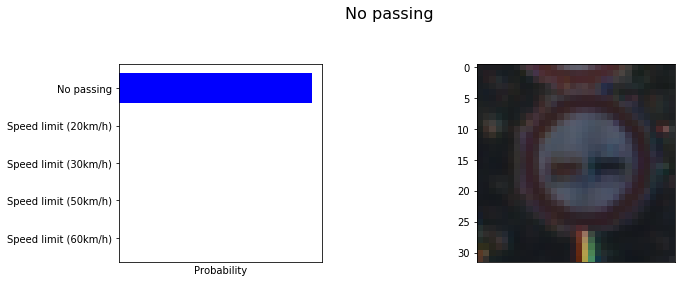

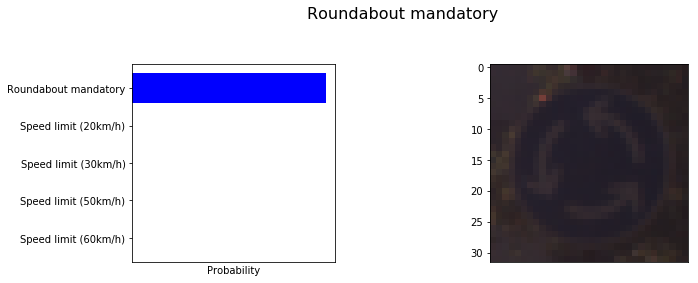

Epoch 151/200. . . Train Loss 0.05287. . . Train Acc 0.9845
Epoch 151/200. . . Train Loss 0.05282. . . Train Acc 0.9846
Epoch 151/200. . . Train Loss 0.05278. . . Train Acc 0.9846
Epoch 151/200. . . Train Loss 0.05273. . . Train Acc 0.9846
Epoch 151/200. . . Train Loss 0.05269. . . Train Acc 0.9846

Caclulating loss & accuracy on  validation set...
Epoch 151/200. . . Val Loss 16.69. . . Val Acc 0.9606
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (80km/h)> is 9% of total wrong
<Speed limit (120km/h> is 5% of total wrong
<No entry> is 12% of total wrong
<Dangerous curve to t> is 8% of total wrong
<Road work> is 21% of total wrong
<Pedestrians> is 8% of total wrong
<Roundabout mandatory> is 11% of total wrong

Epoch 152/200. . . Train Loss 0.05265. . . Train Acc 0.9846
Epoch 152/200. . . Train Loss 0.0526. . . Train Acc 0.9846
Epoch 152/200. . . Train Loss 0.05256. . . Train Acc 0.9846
Epoch 152/200. . . Train Loss 0.05252. . . Train Acc 0.9846
Epoch 

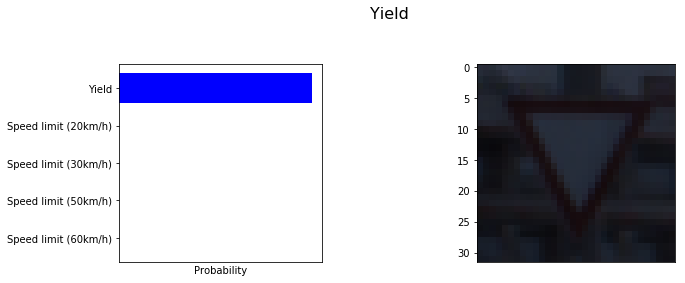

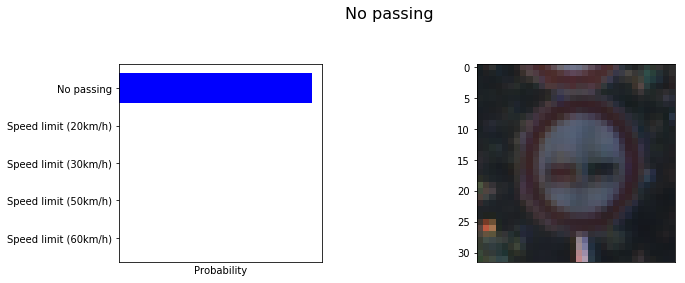

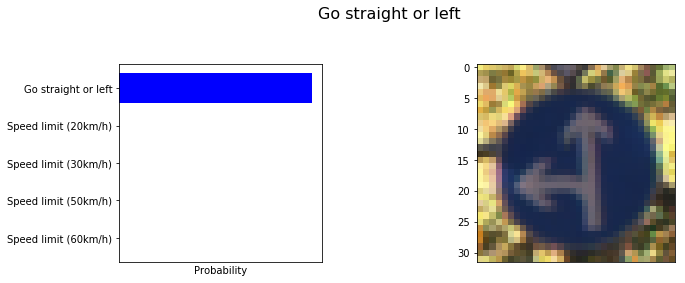

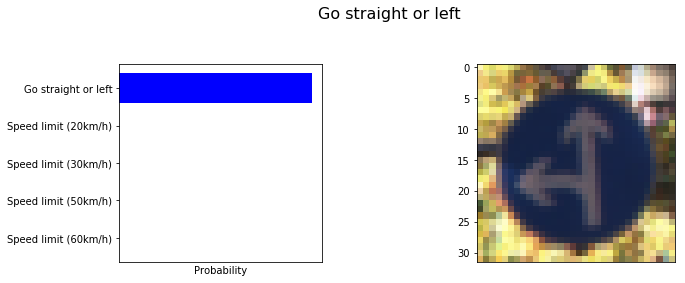

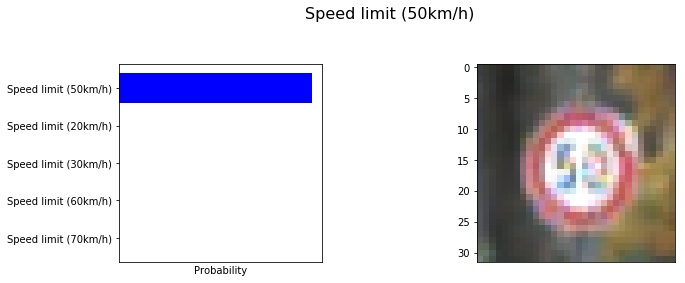

Epoch 156/200. . . Train Loss 0.05179. . . Train Acc 0.9849
Epoch 156/200. . . Train Loss 0.05176. . . Train Acc 0.9849
Epoch 156/200. . . Train Loss 0.05172. . . Train Acc 0.9849
Epoch 156/200. . . Train Loss 0.05169. . . Train Acc 0.9849
Epoch 156/200. . . Train Loss 0.05166. . . Train Acc 0.9849

Caclulating loss & accuracy on  validation set...
Epoch 156/200. . . Val Loss 22.79. . . Val Acc 0.9454

<Speed limit (50km/h)> is 5% of total wrong
<Speed limit (80km/h)> is 20% of total wrong
<Speed limit (120km/h> is 9% of total wrong
<No entry> is 10% of total wrong
<Dangerous curve to t> is 9% of total wrong
<Children crossing> is 12% of total wrong
<Roundabout mandatory> is 6% of total wrong

Epoch 157/200. . . Train Loss 0.05162. . . Train Acc 0.9849
Epoch 157/200. . . Train Loss 0.05157. . . Train Acc 0.9849
Epoch 157/200. . . Train Loss 0.05153. . . Train Acc 0.9849
Epoch 157/200. . . Train Loss 0.0515. . . Train Acc 0.9849
Epoch 157/200. . . Train Loss 0.05147. . . Train Acc 0.985

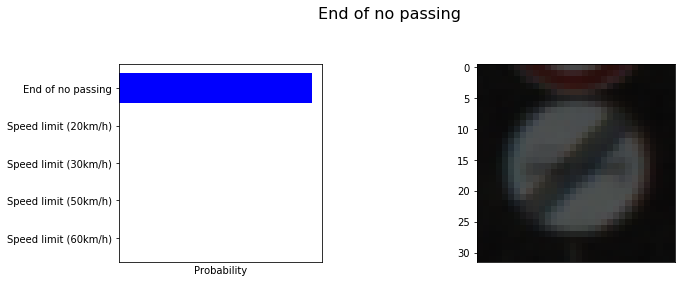

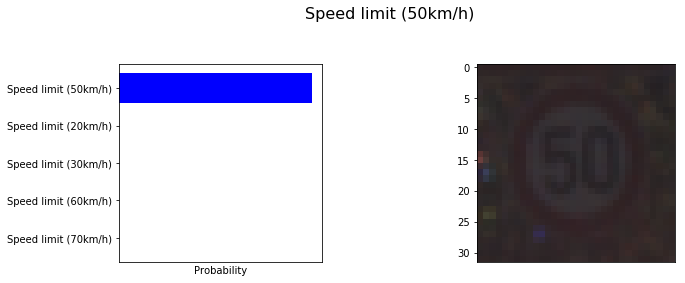

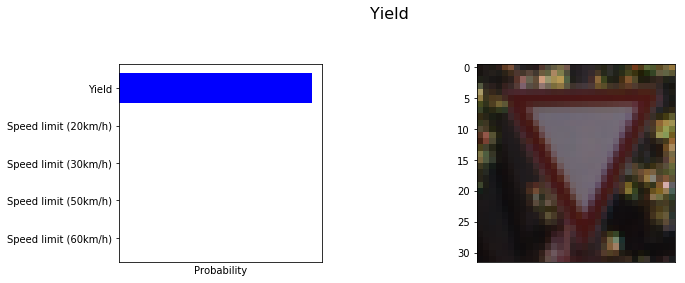

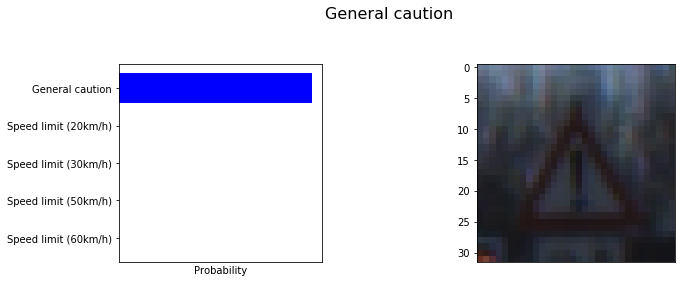

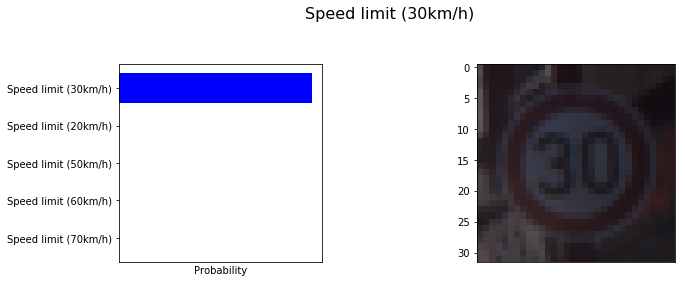

Epoch 161/200. . . Train Loss 0.05081. . . Train Acc 0.9852
Epoch 161/200. . . Train Loss 0.05077. . . Train Acc 0.9852
Epoch 161/200. . . Train Loss 0.05073. . . Train Acc 0.9852
Epoch 161/200. . . Train Loss 0.0507. . . Train Acc 0.9852
Epoch 161/200. . . Train Loss 0.05067. . . Train Acc 0.9852

Caclulating loss & accuracy on  validation set...
Epoch 161/200. . . Val Loss 19.84. . . Val Acc 0.952
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (30km/h)> is 5% of total wrong
<Vehicles over 3.5 me> is 6% of total wrong
<No entry> is 13% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Road work> is 13% of total wrong
<Pedestrians> is 7% of total wrong
<Bicycles crossing> is 6% of total wrong
<Beware of ice/snow> is 10% of total wrong

Epoch 162/200. . . Train Loss 0.05063. . . Train Acc 0.9852
Epoch 162/200. . . Train Loss 0.0506. . . Train Acc 0.9852
Epoch 162/200. . . Train Loss 0.05055. . . Train Acc 0.9852
Epoch 162/200. . . Train Loss

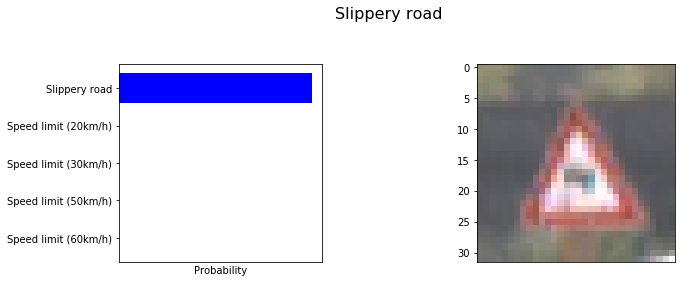

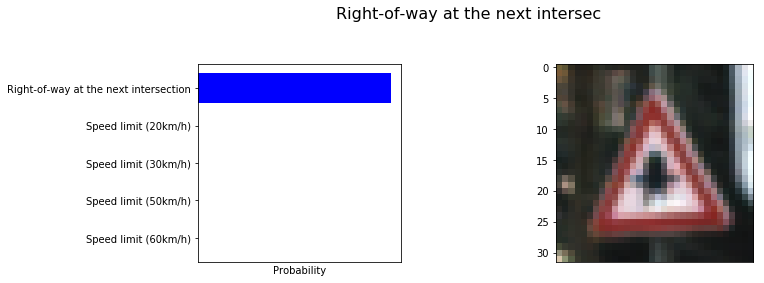

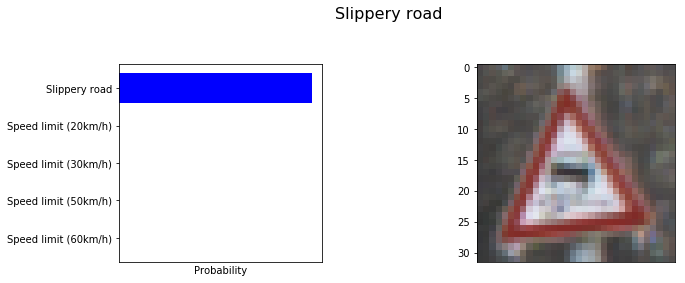

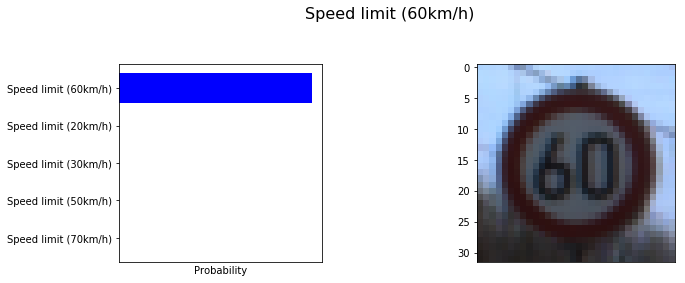

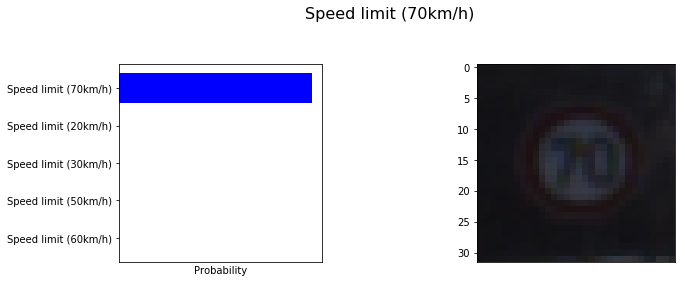

Epoch 166/200. . . Train Loss 0.04985. . . Train Acc 0.9854
Epoch 166/200. . . Train Loss 0.04982. . . Train Acc 0.9854
Epoch 166/200. . . Train Loss 0.04978. . . Train Acc 0.9855
Epoch 166/200. . . Train Loss 0.04975. . . Train Acc 0.9855
Epoch 166/200. . . Train Loss 0.04972. . . Train Acc 0.9855
Epoch 166/200. . . Train Loss 0.04969. . . Train Acc 0.9855

Caclulating loss & accuracy on  validation set...
Epoch 166/200. . . Val Loss 14.8. . . Val Acc 0.961
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (20km/h)> is 13% of total wrong
<Speed limit (50km/h)> is 7% of total wrong
<Speed limit (120km/h> is 12% of total wrong
<No entry> is 9% of total wrong
<Dangerous curve to t> is 11% of total wrong
<Road work> is 16% of total wrong

Epoch 167/200. . . Train Loss 0.04966. . . Train Acc 0.9855
Epoch 167/200. . . Train Loss 0.04963. . . Train Acc 0.9855
Epoch 167/200. . . Train Loss 0.04959. . . Train Acc 0.9855
Epoch 167/200. . . Train Loss 0.04956. . 

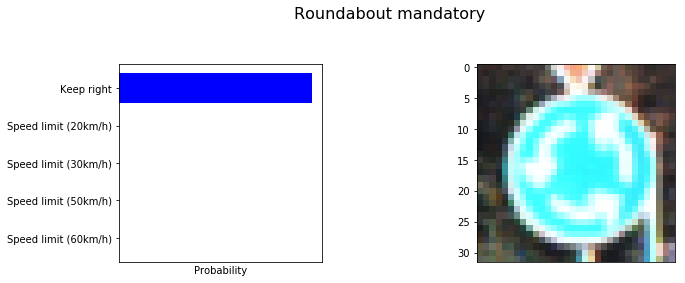

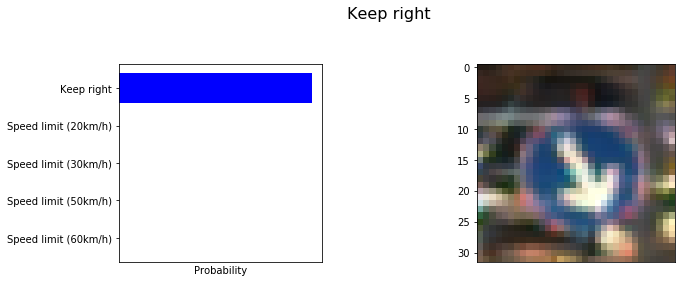

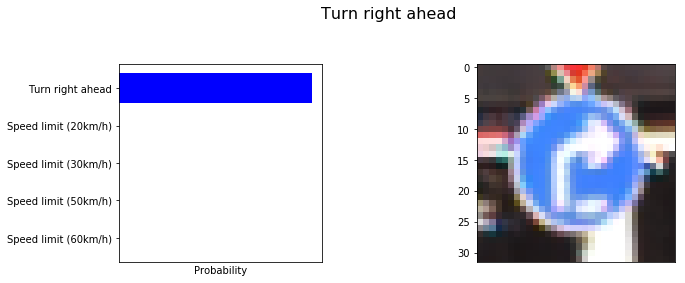

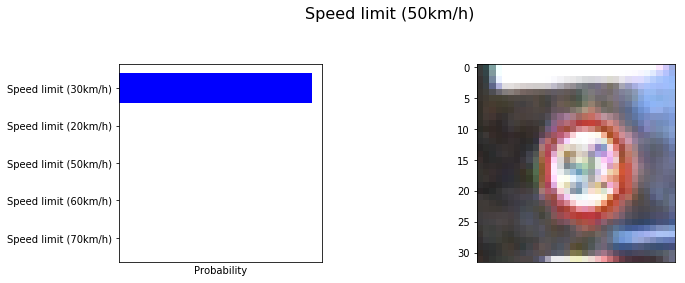

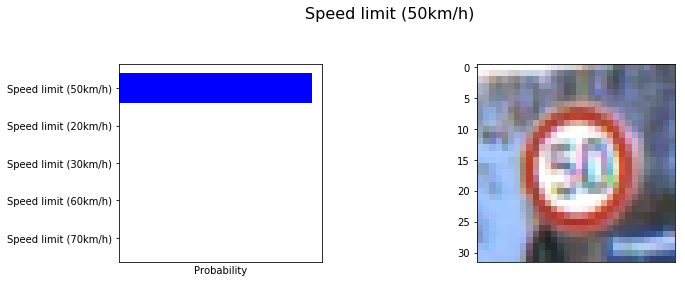

Epoch 171/200. . . Train Loss 0.04898. . . Train Acc 0.9857
Epoch 171/200. . . Train Loss 0.04895. . . Train Acc 0.9857
Epoch 171/200. . . Train Loss 0.04893. . . Train Acc 0.9857
Epoch 171/200. . . Train Loss 0.0489. . . Train Acc 0.9857
Epoch 171/200. . . Train Loss 0.04886. . . Train Acc 0.9857
Epoch 171/200. . . Train Loss 0.04883. . . Train Acc 0.9857

Caclulating loss & accuracy on  validation set...
Epoch 171/200. . . Val Loss 28.02. . . Val Acc 0.9608
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (50km/h)> is 5% of total wrong
<Speed limit (120km/h> is 10% of total wrong
<Right-of-way at the > is 7% of total wrong
<No entry> is 16% of total wrong
<Dangerous curve to t> is 9% of total wrong
<Road work> is 12% of total wrong
<Pedestrians> is 9% of total wrong
<Bicycles crossing> is 5% of total wrong
<Beware of ice/snow> is 6% of total wrong

Epoch 172/200. . . Train Loss 0.0488. . . Train Acc 0.9857
Epoch 172/200. . . Train Loss 0.04876. . . T

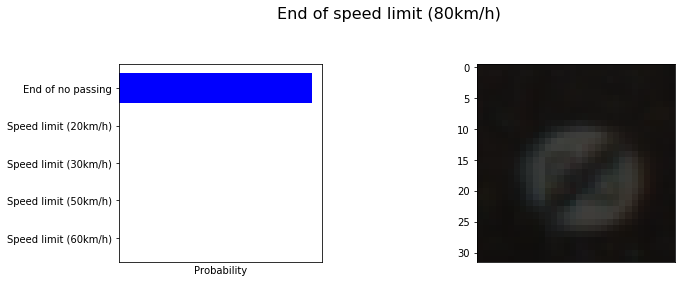

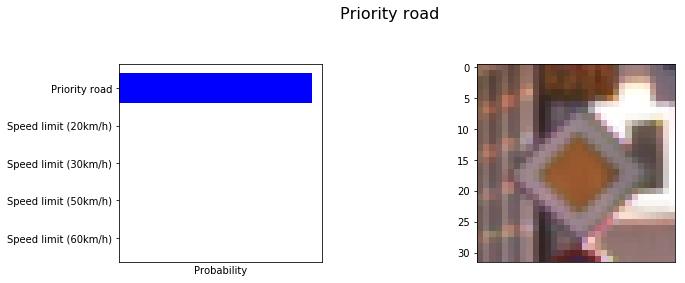

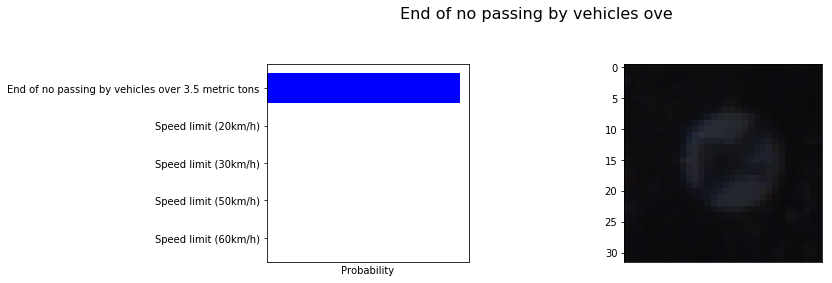

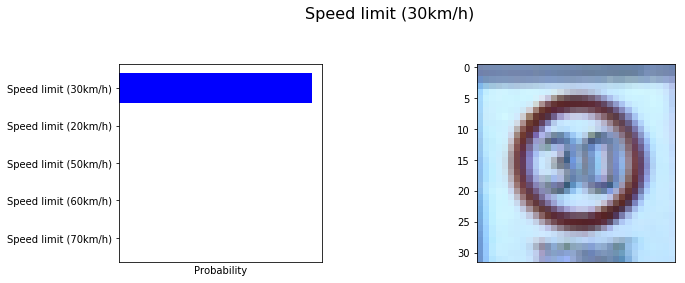

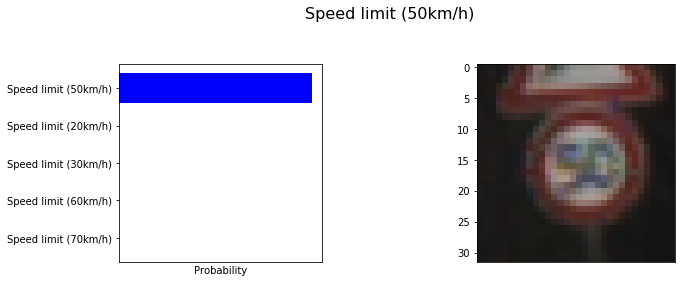

Epoch 176/200. . . Train Loss 0.04812. . . Train Acc 0.9859
Epoch 176/200. . . Train Loss 0.04809. . . Train Acc 0.986
Epoch 176/200. . . Train Loss 0.04805. . . Train Acc 0.986
Epoch 176/200. . . Train Loss 0.04802. . . Train Acc 0.986
Epoch 176/200. . . Train Loss 0.04799. . . Train Acc 0.986

Caclulating loss & accuracy on  validation set...
Epoch 176/200. . . Val Loss 40.11. . . Val Acc 0.9381

<Speed limit (20km/h)> is 6% of total wrong
<Speed limit (80km/h)> is 16% of total wrong
<Speed limit (120km/h> is 6% of total wrong
<No entry> is 11% of total wrong
<Dangerous curve to t> is 10% of total wrong
<Road work> is 9% of total wrong
<Pedestrians> is 7% of total wrong

Epoch 177/200. . . Train Loss 0.04796. . . Train Acc 0.986
Epoch 177/200. . . Train Loss 0.04793. . . Train Acc 0.986
Epoch 177/200. . . Train Loss 0.0479. . . Train Acc 0.986
Epoch 177/200. . . Train Loss 0.04787. . . Train Acc 0.986
Epoch 177/200. . . Train Loss 0.04784. . . Train Acc 0.986

Caclulating loss & accu

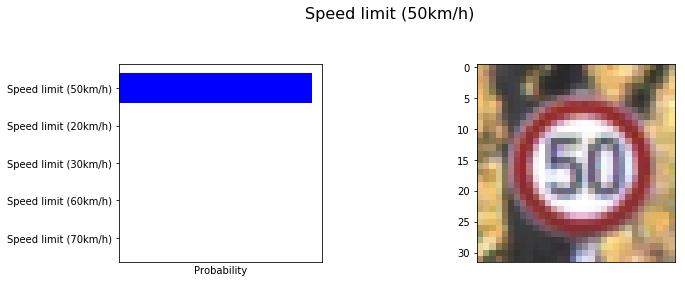

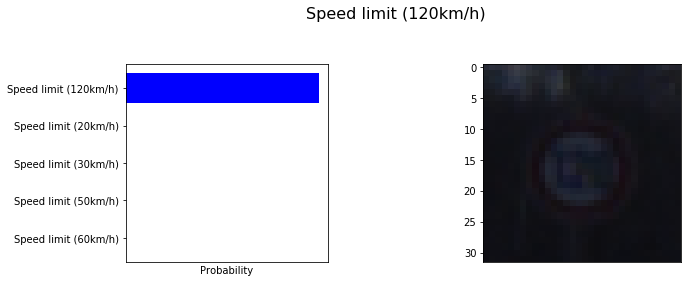

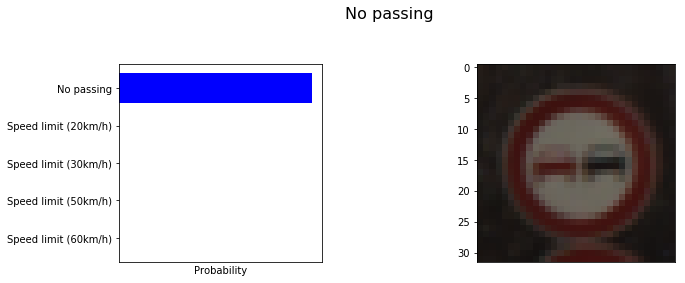

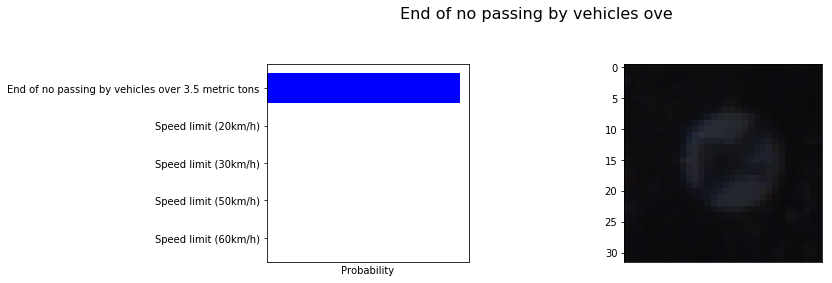

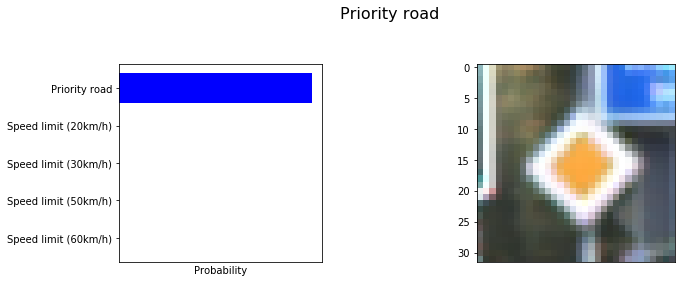

Epoch 181/200. . . Train Loss 0.04731. . . Train Acc 0.9862
Epoch 181/200. . . Train Loss 0.04728. . . Train Acc 0.9862
Epoch 181/200. . . Train Loss 0.04725. . . Train Acc 0.9862
Epoch 181/200. . . Train Loss 0.04722. . . Train Acc 0.9862
Epoch 181/200. . . Train Loss 0.0472. . . Train Acc 0.9862

Caclulating loss & accuracy on  validation set...
Epoch 181/200. . . Val Loss 46.65. . . Val Acc 0.9548
mkdir: cannot create directory ‘checks_95’: File exists
Model Saved!

<Speed limit (50km/h)> is 6% of total wrong
<Speed limit (80km/h)> is 13% of total wrong
<Speed limit (120km/h> is 10% of total wrong
<No entry> is 15% of total wrong
<Dangerous curve to t> is 15% of total wrong
<Road work> is 5% of total wrong
<Pedestrians> is 9% of total wrong

Epoch 182/200. . . Train Loss 0.04717. . . Train Acc 0.9862
Epoch 182/200. . . Train Loss 0.04715. . . Train Acc 0.9862
Epoch 182/200. . . Train Loss 0.04712. . . Train Acc 0.9862
Epoch 182/200. . . Train Loss 0.04709. . . Train Acc 0.9863
Epoch

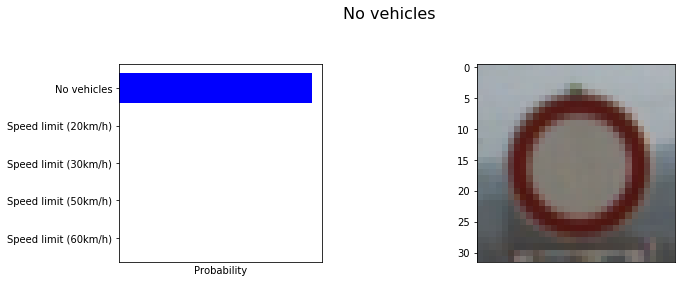

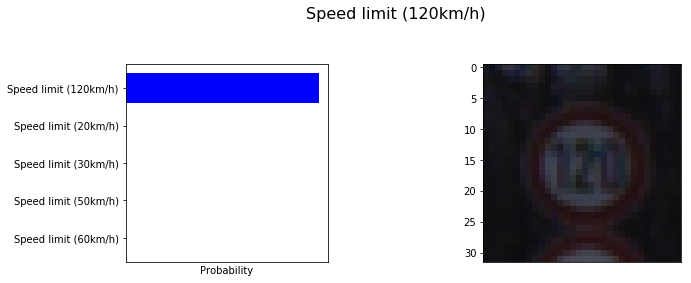

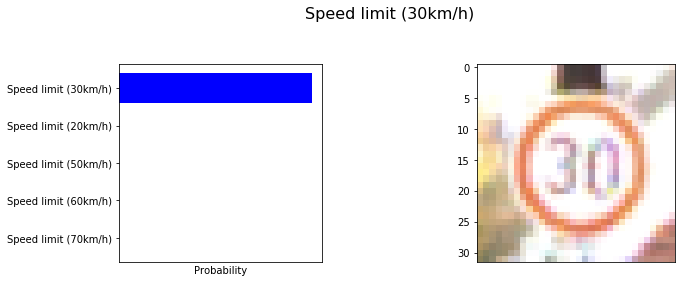

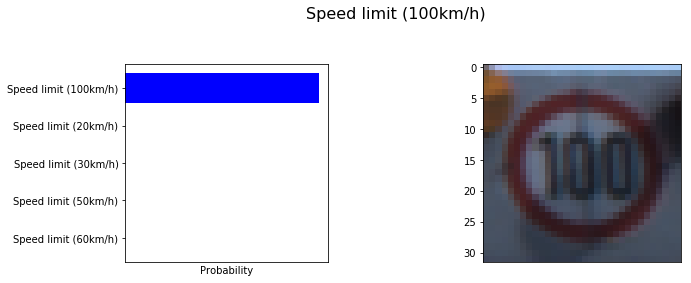

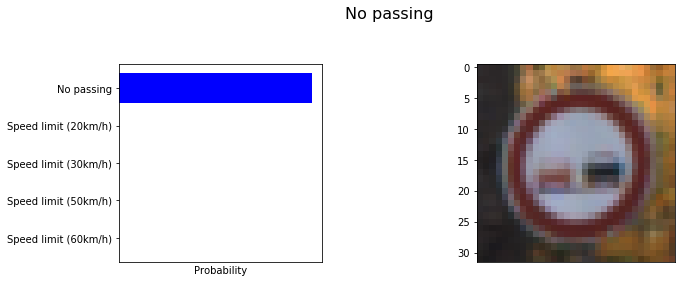

Epoch 186/200. . . Train Loss 0.04655. . . Train Acc 0.9864
Epoch 186/200. . . Train Loss 0.04653. . . Train Acc 0.9864
Epoch 186/200. . . Train Loss 0.0465. . . Train Acc 0.9864
Epoch 186/200. . . Train Loss 0.04647. . . Train Acc 0.9864
Epoch 186/200. . . Train Loss 0.04644. . . Train Acc 0.9864

Caclulating loss & accuracy on  validation set...
Epoch 186/200. . . Val Loss 34.03. . . Val Acc 0.9621
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<End of speed limit (> is 9% of total wrong
<No entry> is 17% of total wrong
<Dangerous curve to t> is 10% of total wrong
<Road work> is 8% of total wrong
<Pedestrians> is 6% of total wrong
<Beware of ice/snow> is 5% of total wrong
<Roundabout mandatory> is 8% of total wrong

Epoch 187/200. . . Train Loss 0.04641. . . Train Acc 0.9865
Epoch 187/200. . . Train Loss 0.04639. . . Train Acc 0.9865
Epoch 187/200. . . Train Loss 0.04635. . . Train Acc 0.9865
Epoch 187/200. . . Train Loss 0.04633. . . Train Acc 0.9865
Epoch 187

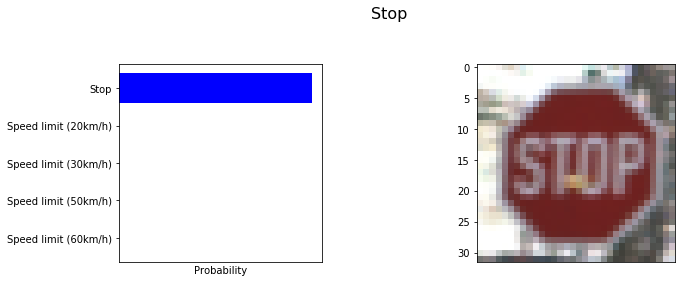

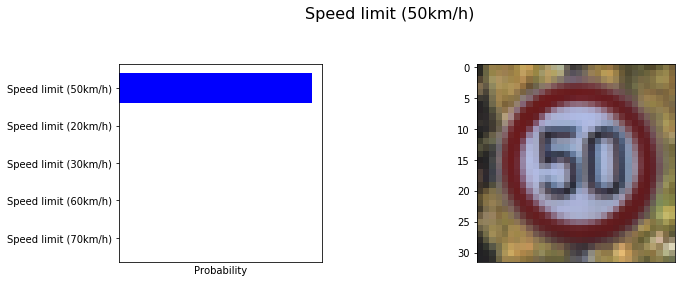

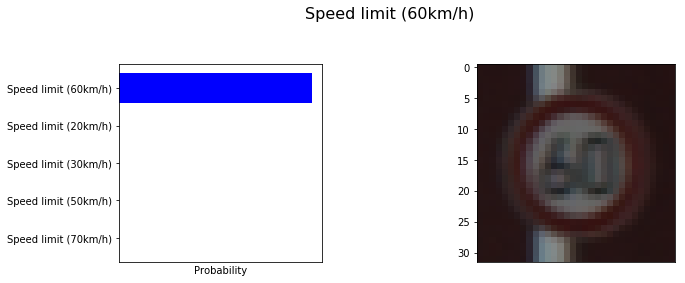

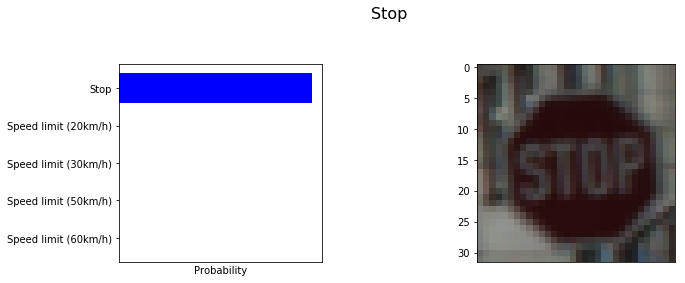

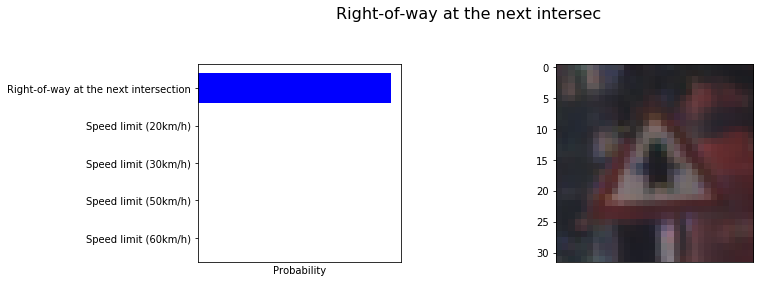

Epoch 191/200. . . Train Loss 0.04583. . . Train Acc 0.9866
Epoch 191/200. . . Train Loss 0.0458. . . Train Acc 0.9866
Epoch 191/200. . . Train Loss 0.04578. . . Train Acc 0.9866
Epoch 191/200. . . Train Loss 0.04575. . . Train Acc 0.9866
Epoch 191/200. . . Train Loss 0.04572. . . Train Acc 0.9867
Epoch 191/200. . . Train Loss 0.0457. . . Train Acc 0.9867

Caclulating loss & accuracy on  validation set...
Epoch 191/200. . . Val Loss 31.12. . . Val Acc 0.9658
mkdir: cannot create directory ‘checks_96’: File exists
Model Saved!

<Speed limit (120km/h> is 6% of total wrong
<No entry> is 15% of total wrong
<Dangerous curve to t> is 10% of total wrong
<Road work> is 9% of total wrong
<Pedestrians> is 9% of total wrong
<Children crossing> is 9% of total wrong

Epoch 192/200. . . Train Loss 0.04567. . . Train Acc 0.9867
Epoch 192/200. . . Train Loss 0.04565. . . Train Acc 0.9867
Epoch 192/200. . . Train Loss 0.04562. . . Train Acc 0.9867
Epoch 192/200. . . Train Loss 0.04559. . . Train Acc 0.

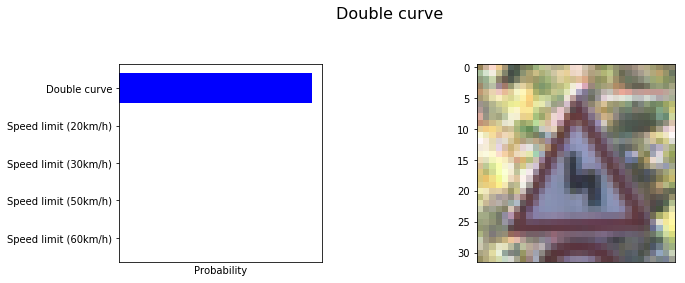

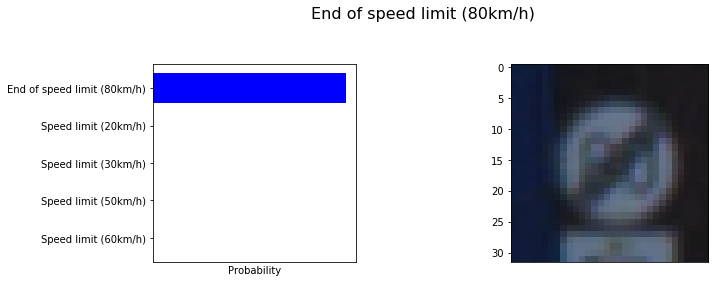

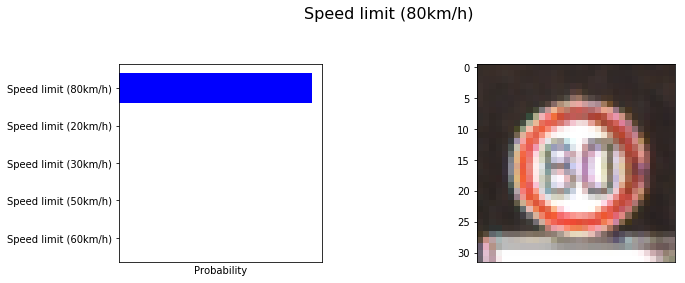

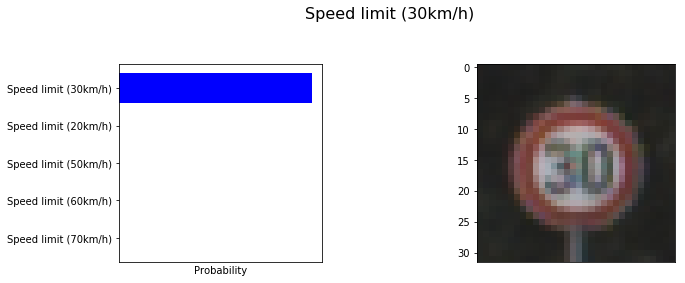

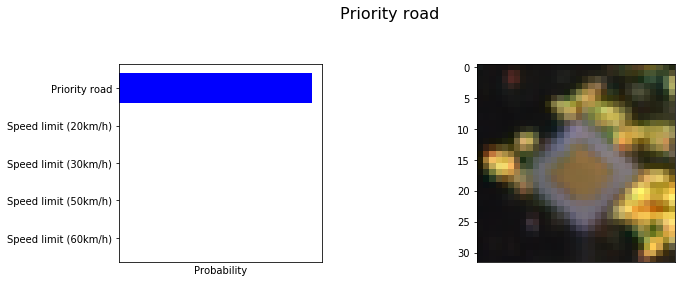

Epoch 196/200. . . Train Loss 0.04512. . . Train Acc 0.9868
Epoch 196/200. . . Train Loss 0.04508. . . Train Acc 0.9868
Epoch 196/200. . . Train Loss 0.04506. . . Train Acc 0.9868
Epoch 196/200. . . Train Loss 0.04503. . . Train Acc 0.9869
Epoch 196/200. . . Train Loss 0.04501. . . Train Acc 0.9869
Epoch 196/200. . . Train Loss 0.04499. . . Train Acc 0.9869

Caclulating loss & accuracy on  validation set...
Epoch 196/200. . . Val Loss 44.79. . . Val Acc 0.9442

<Speed limit (60km/h)> is 21% of total wrong
<Speed limit (80km/h)> is 9% of total wrong
<Speed limit (120km/h> is 8% of total wrong
<No entry> is 11% of total wrong
<Dangerous curve to t> is 10% of total wrong
<Road work> is 11% of total wrong

Epoch 197/200. . . Train Loss 0.04496. . . Train Acc 0.9869
Epoch 197/200. . . Train Loss 0.04493. . . Train Acc 0.9869
Epoch 197/200. . . Train Loss 0.04491. . . Train Acc 0.9869
Epoch 197/200. . . Train Loss 0.04488. . . Train Acc 0.9869
Epoch 197/200. . . Train Loss 0.04485. . . Train

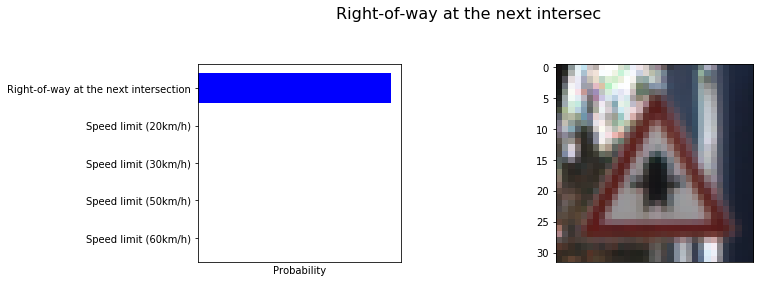

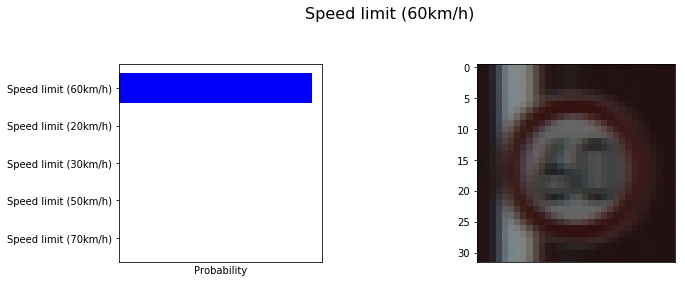

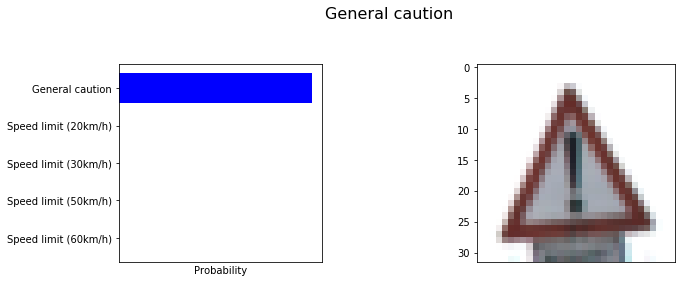

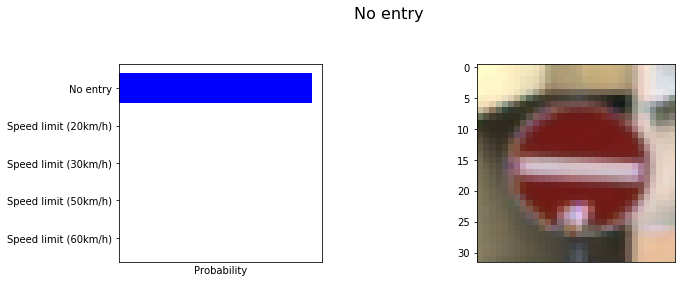

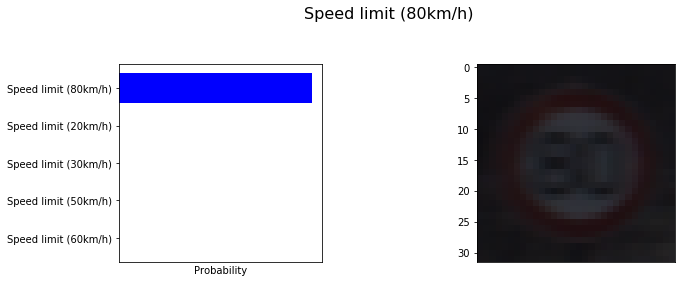

Model finished training :)


In [ ]:
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    for e in range(epochs):
        for x, y, _, _, _  in get_batches_train(X_train, y_train, sign_names, train_sizes, train_coord, batch_size):
            steps += 1
            feed = {model.x: x, 
                    model.targets: y, 
                    model.drop_rate: dropout_rate, 
                    model.is_train: True, 
                    model.learn_rate: learn_rate}
            batch_acc, batch_loss, _ = sess.run([model.accuracy, model.cost, model.train_opt], feed_dict=feed)
            train_losses.append(batch_loss)
            batch_accs.append(batch_acc)
            
            if steps % print_every == 0:
                avg_loss = np.mean(train_losses)
                avg_acc = np.mean(batch_accs)
                print('Epoch {}/{}. . . Train Loss {:.4}. . . Train Acc {:.4}'.format(e+1, epochs, avg_loss, avg_acc))

        print('')
        print('Caclulating loss & accuracy on validation set...')
        val_losses, val_accs, wrong_indexes = [], [], []
        for val_idx, val_x, val_y, val_names, _, _  in get_batches_test(X_valid, y_valid, sign_names, 
                                                          valid_sizes, valid_coord, batch_size):
            feed = {model.x: val_x, 
                    model.targets: val_y, 
                    model.drop_rate: 0., 
                    model.is_train: False}
            val_acc, val_cor, val_loss = sess.run([model.accuracy, model.correct_pred, model.cost], feed_dict=feed)
            wrong_idx = [val_idx[i] for i in range(len(val_cor)) if val_cor[i] == False]
            wrong_indexes.append(wrong_idx)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
        avg_val_loss = np.mean(val_losses)
        avg_val_acc = np.mean(val_accs)
        print('Epoch {}/{}. . . Val Loss {:.4}. . . Val Acc {:.4}'.format(e+1, epochs, avg_val_loss, avg_val_acc))
        if avg_val_acc > 0.97:
            if new_val_acc == 0:
                !mkdir checks_97_new
            if avg_val_acc > new_val_acc:
                new_val_acc = avg_val_acc
                saver.save(sess, './checks_97_new/tsigns.ckpt')
                print('Model Saved!')
        print('')
        
        wrong_indexes = np.array([p for sublist in wrong_indexes for p in sublist])
        ind, cnt = np.unique(y_valid[wrong_indexes], return_counts=True)
        wrong_names = [sign_names[ind[i], 1] for i in range(len(ind))]
        for i in range(len(cnt)):
            # Only print sign names of those wrong 5% or more of time
            if (cnt[i]/np.sum(cnt))*100 > 4.9:
                print('<{:.20}> is {:.0f}% of total wrong'.format(wrong_names[i], (cnt[i]/np.sum(cnt))*100))
        print('')
        total_wrong_indexes.append(wrong_indexes)
        
        # Every 5 epochs, let's look at some validation images and the top-5 predicted labels
        if (e+1) % 5 == 0:
            print('Displaying validation samples...')
            num_images = len(X_valid)
            idx = np.arange(num_images)
            np.random.shuffle(idx)
            num_show = 5
            [view_val_with_preds(sess, X_valid[idx[i]], y_valid[idx[i]], sign_names[y_valid[idx[i]], 1], 
                                 valid_sizes[idx[i]], valid_coord[idx[i]]) for i in range(num_show)]
        
        #delete above and use below to only view images that were misclassified:
        #num_images = len(wrong_indexes)
        #idx = np.arange(num_images)
        #np.random.shuffle(idx)
        #num_show = 10
        #[view_val_with_preds(sess, X_valid[wrong_indexes[idx[i]]], y_valid[wrong_indexes[idx[i]]], 
        #                     sign_names[y_valid[wrong_indexes[idx[i]]], 1], valid_sizes[wrong_indexes[idx[i]]], 
        #                     valid_coord[wrong_indexes[idx[i]]]) for i in range(num_show)]
        
        
    print('Model finished training :)')

## Load best checkpoint and check accuracy on val set

INFO:tensorflow:Restoring parameters from checks_97_new/tsigns.ckpt
Validation Accuracy 0.971
Displaying validation samples...


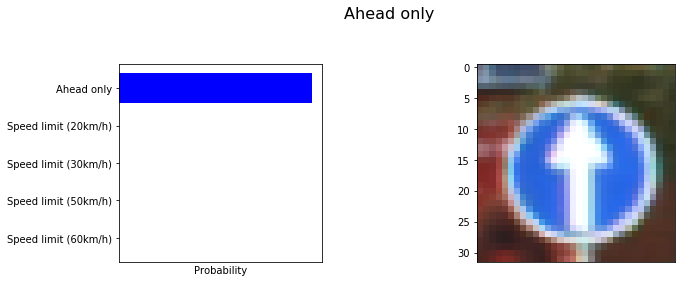

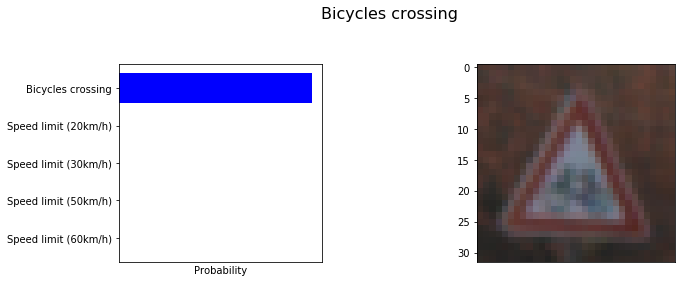

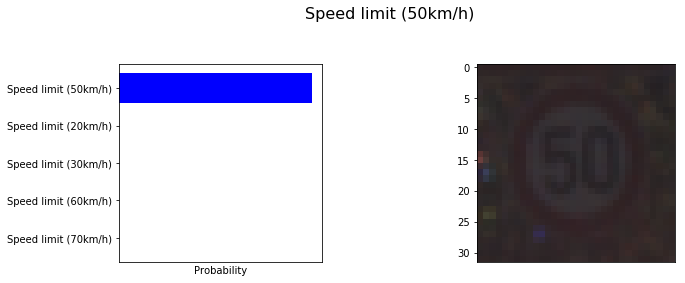

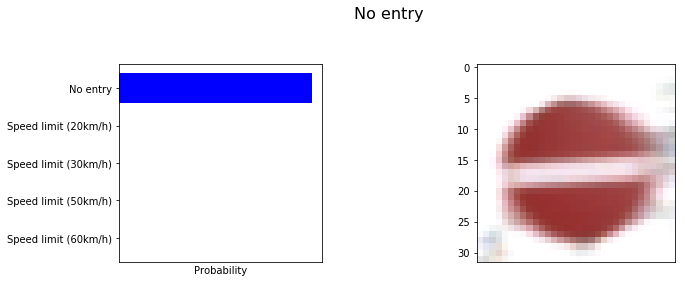

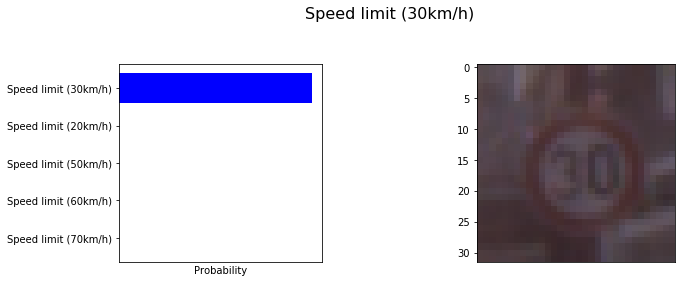

Total misclassified signs in validation set: 128


In [11]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks_97_new'))
    test_accs, wrong_indices = [], []
    for test_idx, test_x, test_y, test_names, _, _  in get_batches_test(X_valid, y_valid, sign_names, 
                                                                    valid_sizes, valid_coord, batch_size):
        feed = {model.x: test_x, 
                model.targets: test_y, 
                model.drop_rate: 0., 
                model.is_train: False}
        test_acc, test_cor = sess.run([model.accuracy, model.correct_pred], feed_dict=feed)
        test_accs.append(test_acc)
        wrong_idx = [test_idx[i] for i in range(len(test_cor)) if test_cor[i] == False]
        wrong_indices.append(wrong_idx)
    avg_test_acc = np.mean(test_accs)
    print('Validation Accuracy {:.4}'.format(avg_test_acc))
    print('Displaying validation samples...')
    num_images = len(X_valid)
    idx = np.arange(num_images)
    np.random.shuffle(idx)
    num_show = 5
    [view_val_with_preds(sess, X_valid[idx[i]], y_valid[idx[i]], sign_names[y_valid[idx[i]], 1], 
                         valid_sizes[idx[i]], valid_coord[idx[i]]) for i in range(num_show)]
    
wrong_indices = np.array([p for sublist in wrong_indices for p in sublist])
n_wrong = len(wrong_indices)
print('Total misclassified signs in validation set: {}'.format(n_wrong))

## Have a gander at some of the misclassified images

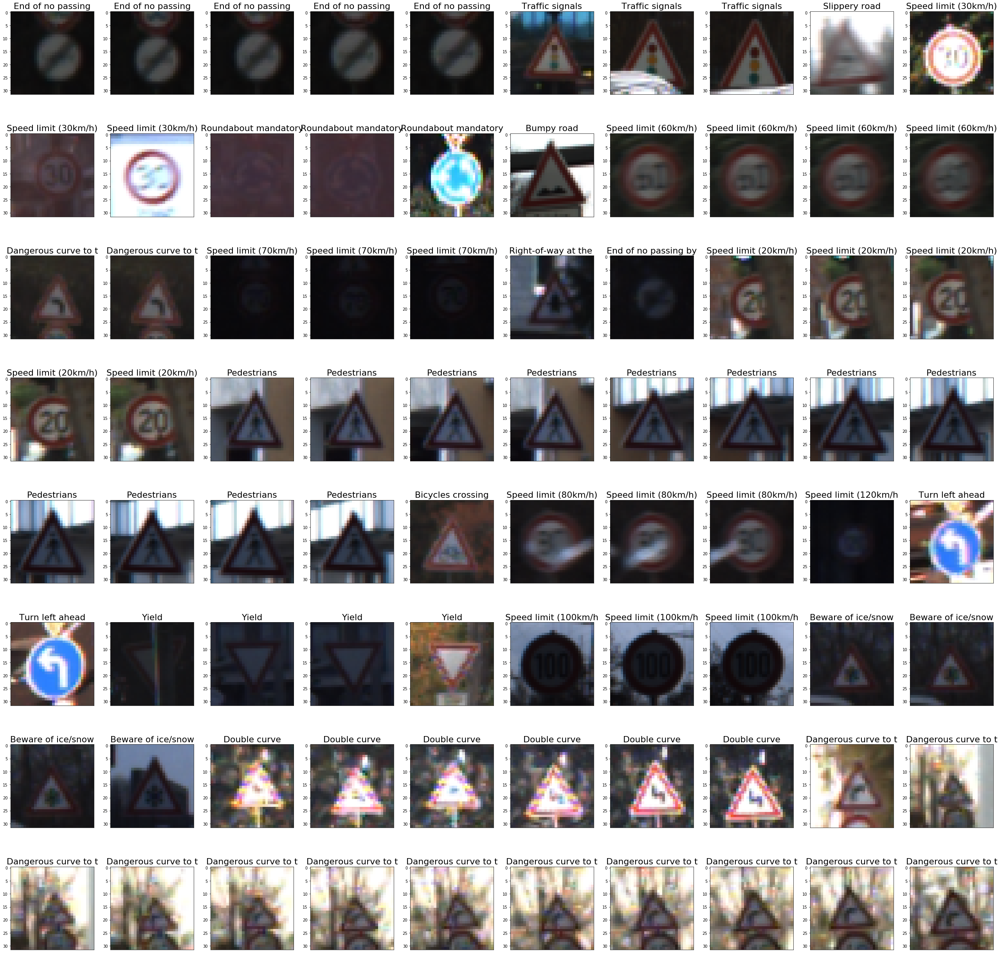

In [20]:
plt.figure(figsize=(45, 45))
for i in range(80):
    plt.subplot(8,10,(i+1))
    plt.title('{:.20}'.format(sign_names[y_valid[wrong_indices[i]], 1]), fontsize=22)
    plt.imshow(X_valid[wrong_indices[i]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## Check accuracy on test set

I'll also track the true positives, true negatives, false positives, and false negatives, then calculate the precision, recall, and specificity for each class. This can help determine how to augment data by showing the network's weak labels.

INFO:tensorflow:Restoring parameters from checks_97_new/tsigns.ckpt
Test Accuracy 0.9291
Displaying test samples...


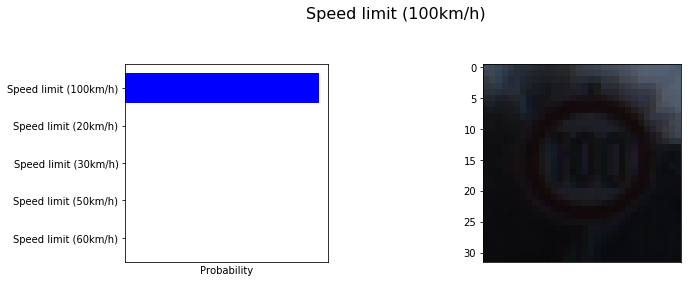

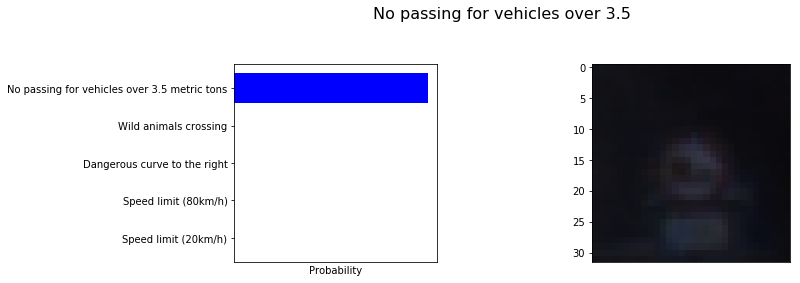

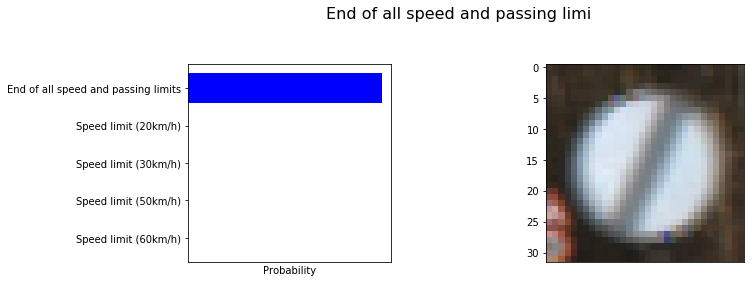

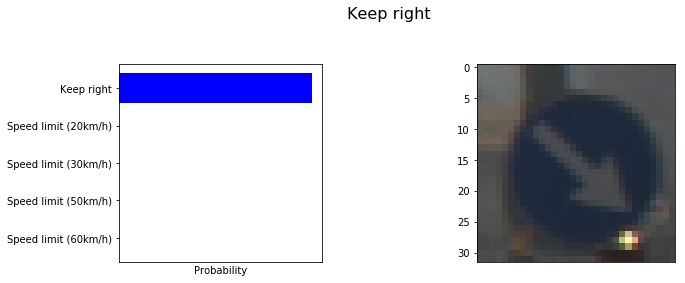

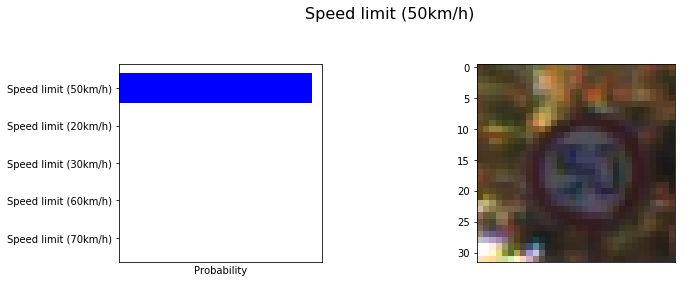

Total misclassified signs in test set: 894

Double-check accuracy: 0.9292

Speed limit (20km/h):
     precision: 0.8551
     recall: 1.0
     specificity: 0.9991

Speed limit (30km/h):
     precision: 0.9689
     recall: 0.9263
     specificity: 0.9979

Speed limit (50km/h):
     precision: 0.9606
     recall: 1.0
     specificity: 0.9973

Speed limit (60km/h):
     precision: 0.9374
     recall: 0.9439
     specificity: 0.9976

Speed limit (70km/h):
     precision: 0.9831
     recall: 0.9088
     specificity: 0.999

Speed limit (80km/h):
     precision: 0.8804
     recall: 0.9546
     specificity: 0.9929

End of speed limit (:
     precision: 0.9813
     recall: 1.0
     specificity: 0.9998

Speed limit (100km/h:
     precision: 0.9782
     recall: 0.8838
     specificity: 0.9992

Speed limit (120km/h:
     precision: 0.9626
     recall: 1.0
     specificity: 0.9985

No passing:
     precision: 0.9958
     recall: 0.8375
     specificity: 0.9998

No passing for vehic:
     precision: 

In [28]:
tp = np.zeros(n_classes)
tn = np.zeros(n_classes)
fp = np.zeros(n_classes)
fn = np.zeros(n_classes)

with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks_97_new'))
    test_accs, wrong_indices = [], []
    for test_idx, test_x, test_y, test_names, _, _  in get_batches_test(X_test, y_test, sign_names, 
                                                                    test_sizes, test_coord, batch_size):
        feed = {model.x: test_x, 
                model.targets: test_y, 
                model.drop_rate: 0., 
                model.is_train: False}
        test_acc, test_preds, test_cor = sess.run([model.accuracy, model.preds, model.correct_pred], feed_dict=feed)
        test_preds = tf.argmax(test_preds, 1).eval()
        for i in range(len(test_cor)):
            if test_cor[i] == True:
                tp[test_y[i]] += 1
                for j in range(n_classes):
                    if j != test_y[i]:
                        tn[j] += 1
            if test_cor[i] == False:
                fp[test_preds[i]] += 1
                fn[y_test[i]] += 1
        
        test_accs.append(test_acc)
        wrong_idx = [test_idx[i] for i in range(len(test_cor)) if test_cor[i] == False]
        wrong_indices.append(wrong_idx)
    avg_test_acc = np.mean(test_accs)
    print('Test Accuracy {:.4}'.format(avg_test_acc))
    print('Displaying test samples...')
    num_images = len(X_test)
    idx = np.arange(num_images)
    np.random.shuffle(idx)
    num_show = 5
    [view_val_with_preds(sess, X_test[idx[i]], y_test[idx[i]], sign_names[y_test[idx[i]], 1], 
                         test_sizes[idx[i]], test_coord[idx[i]]) for i in range(num_show)]

wrong_indices = np.array([p for sublist in wrong_indices for p in sublist])
n_wrong = len(wrong_indices)
print('Total misclassified signs in test set: {}'.format(n_wrong))
print('')
precision = tp / (tp + fp)
recall = tp / (tp + fn)
specificity = tn / (tn + fp)
accuracy = np.sum(tp) / len(X_test)
print('Double-check accuracy: {:.4}'.format(accuracy))
print('')
for i in range(n_classes):
    print('{}:'.format(sign_names[i, 1]))
    print('     precision: {:.4}'.format(precision[i]))
    print('     recall: {:.4}'.format(recall[i]))
    print('     specificity: {:.4}'.format(specificity[i]))
    print('')

## Some more misclassified images, this time on test set

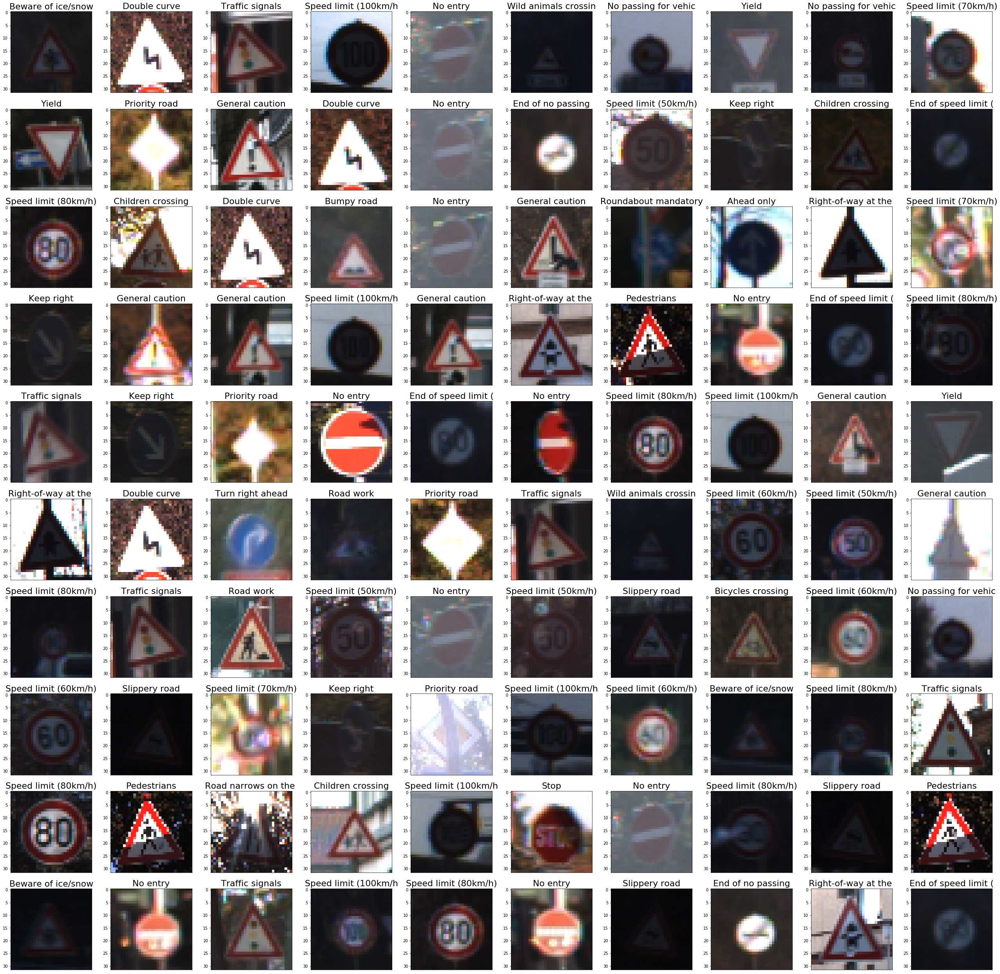

In [25]:
plt.figure(figsize=(45, 45))
for i in range(100):
    plt.subplot(10,10,(i+1))
    plt.title('{:.20}'.format(sign_names[y_test[wrong_indices[i+100]], 1]), fontsize=22)
    plt.imshow(X_test[wrong_indices[i+100]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## Let's see how the network performs with new images found on the web

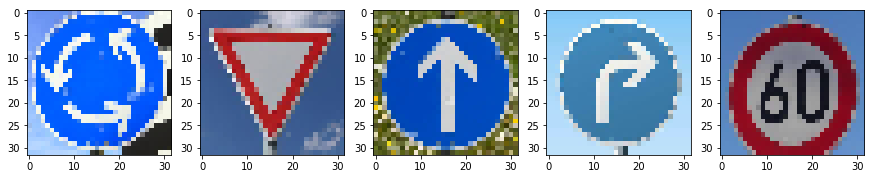

In [11]:
eg1 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_1.jpg'), dsize=(32,32)))
eg2 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_2.jpg'), dsize=(32,32)))
eg3 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_4.jpg'), dsize=(32,32)))
eg4 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_5.jpg'), dsize=(32,32)))
eg5 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_6.jpg'), dsize=(32,32)))
egs = [eg1, eg2, eg3, eg4, eg5]
plt.figure(figsize=(15,5))
for i in range(5):
    plt.subplot(1,5,(i+1))
    plt.imshow(egs[i])

In [56]:
def view_web_with_preds(sess, image, top_n=how_many):
    feed = {model.x: image.reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    pred = sess.run(model.preds, feed_dict=feed)
    top_n_pred_names = top_n_predictions(pred)
    top_n_pred_probs = top_n_predictions(pred, probs_off=False)
    
    plt.figure(figsize=(10, 8))
    plt.subplot(2,2,1)
    y_pos = np.arange(top_n)
    probabilities = np.flip(top_n_pred_probs, 0)
    plt.barh(y_pos, probabilities, align='center', color='blue', tick_label=np.flip(top_n_pred_names, 0))
    plt.xlabel('Probability')
    
    plt.subplot(2,2,2)
    plt.imshow(image)
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
        
    plt.subplots_adjust(wspace=0.75)
    plt.show()
    
    return np.flip(probabilities, 0), top_n_pred_names

INFO:tensorflow:Restoring parameters from checks_97_new/tsigns.ckpt


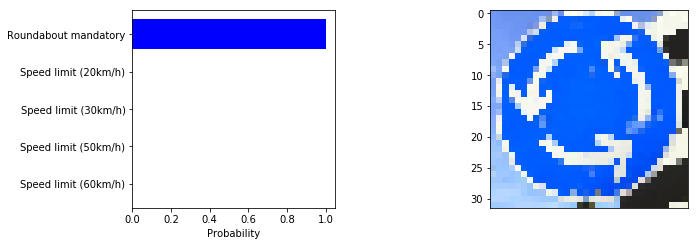

Top 5 Softmax Probabilities:
     Roundabout mandatory: 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (60km/h): 0.0


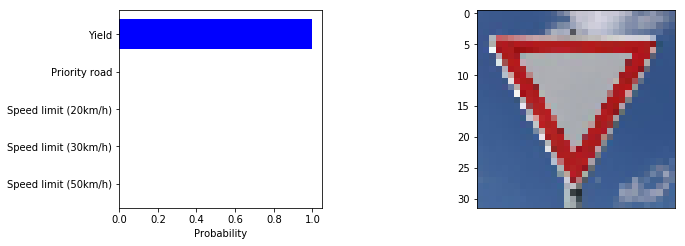

Top 5 Softmax Probabilities:
     Yield: 1.0
     Priority road: 1.006e-35
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0


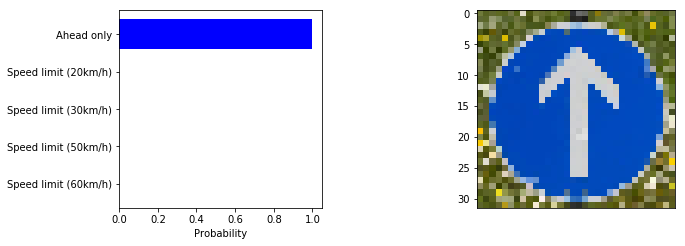

Top 5 Softmax Probabilities:
     Ahead only: 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (60km/h): 0.0


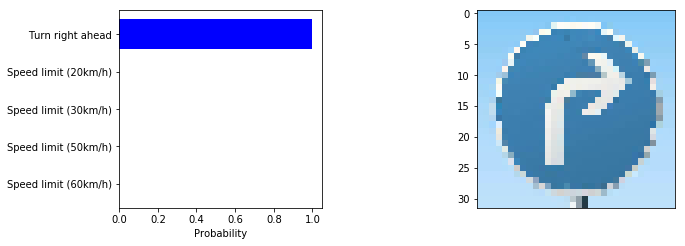

Top 5 Softmax Probabilities:
     Turn right ahead: 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (60km/h): 0.0


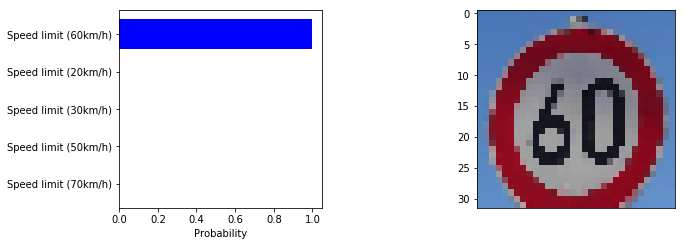

Top 5 Softmax Probabilities:
     Speed limit (60km/h): 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (70km/h): 0.0


In [13]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks_97_new'))
    for i in range(5):
        probs, top_n_names = view_web_with_preds(sess, egs[i])
        print('Top 5 Softmax Probabilities:')
        [print('     {}: {:.4}'.format(top_n_names[i], probs[i])) for i in range(5)]

## Crushing it! Now let's check a sign from the web that had low precision and recall on the test set, 'Dangerous Curve to Right'

Dangerous curve to the right:
     precision: 0.6294
     recall: 0.7759
     specificity: 0.9955
INFO:tensorflow:Restoring parameters from checks_97_new/tsigns.ckpt


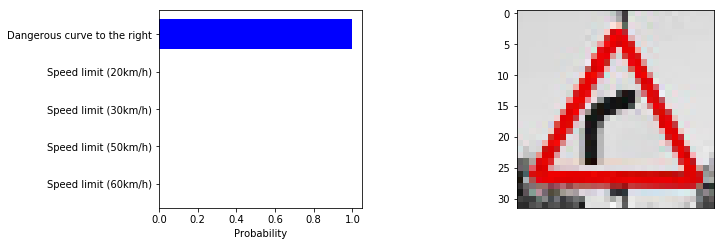

Top 5 Softmax Probabilities:
     Dangerous curve to the right: 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (60km/h): 0.0


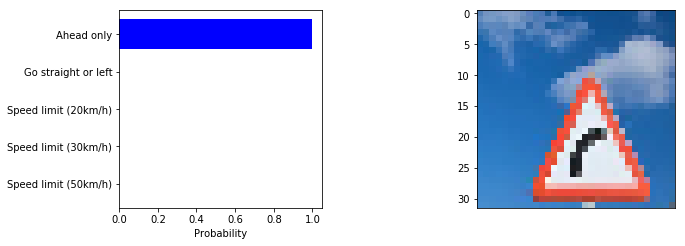

Top 5 Softmax Probabilities:
     Ahead only: 1.0
     Go straight or left: 4.973e-26
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0


In [59]:
print('{}:'.format(sign_names[20, 1]))
print('     precision: {:.4}'.format(precision[20]))
print('     recall: {:.4}'.format(recall[20]))
print('     specificity: {:.4}'.format(specificity[20]))

dang_curve_to_right = normalize(cv2.resize(mpimg.imread('traffic-signs-web/dangerous_curve_to_right.jpg'), dsize=(32,32)))
dang_curve_to_right2 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/dangerous_curve_to_right2.jpg'), dsize=(32,32)))

with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks_97_new'))
    probs, top_n_names = view_web_with_preds(sess, dang_curve_to_right)
    print('Top 5 Softmax Probabilities:')
    [print('     {}: {:.4}'.format(top_n_names[i], probs[i])) for i in range(5)]
    
    probs, top_n_names = view_web_with_preds(sess, dang_curve_to_right2)
    print('Top 5 Softmax Probabilities:')
    [print('     {}: {:.4}'.format(top_n_names[i], probs[i])) for i in range(5)]

Well, it got the first one right. At least the miss was predictable.

## Finally, have a look at the network's activation output to see how it's learning
## 1) On Roundabout Mandatory from web

INFO:tensorflow:Restoring parameters from checks_97_new/tsigns.ckpt


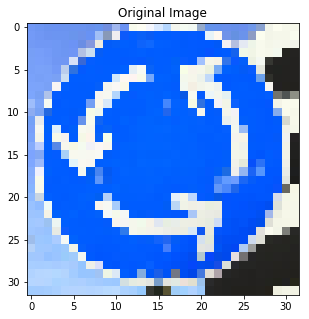

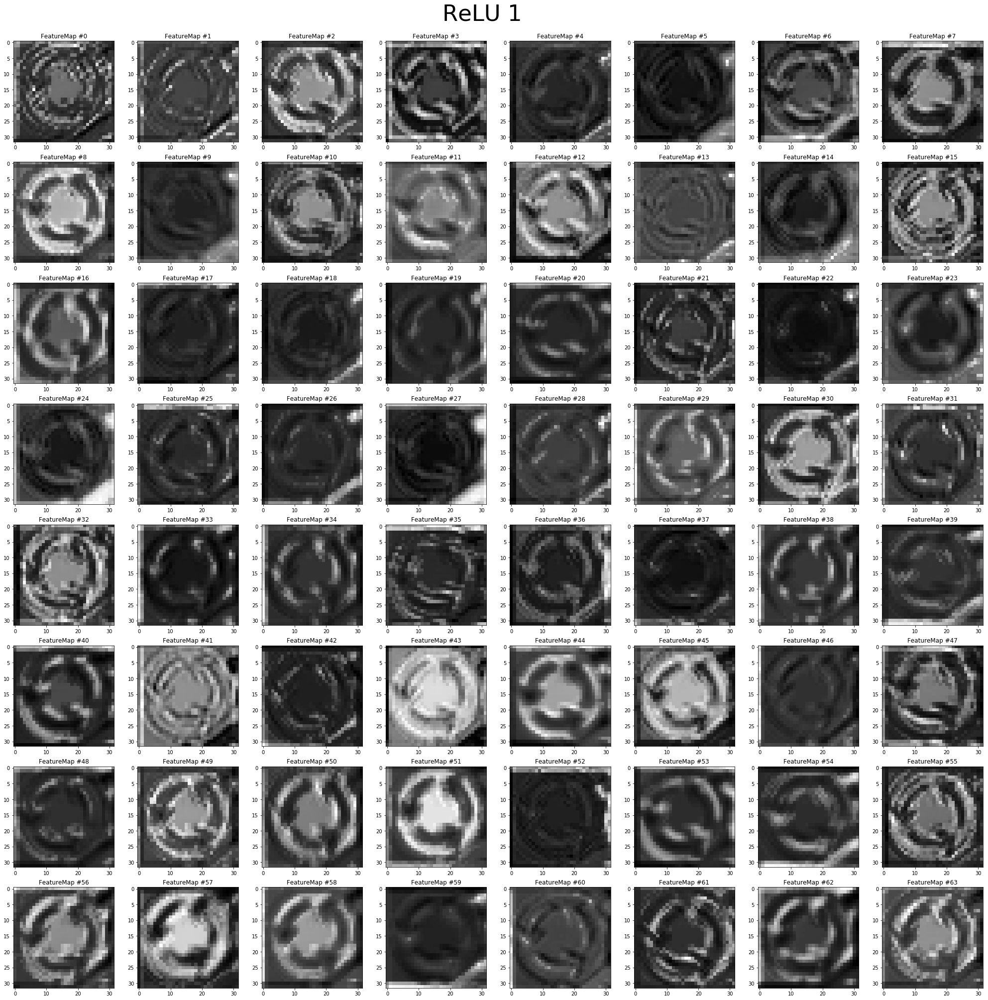

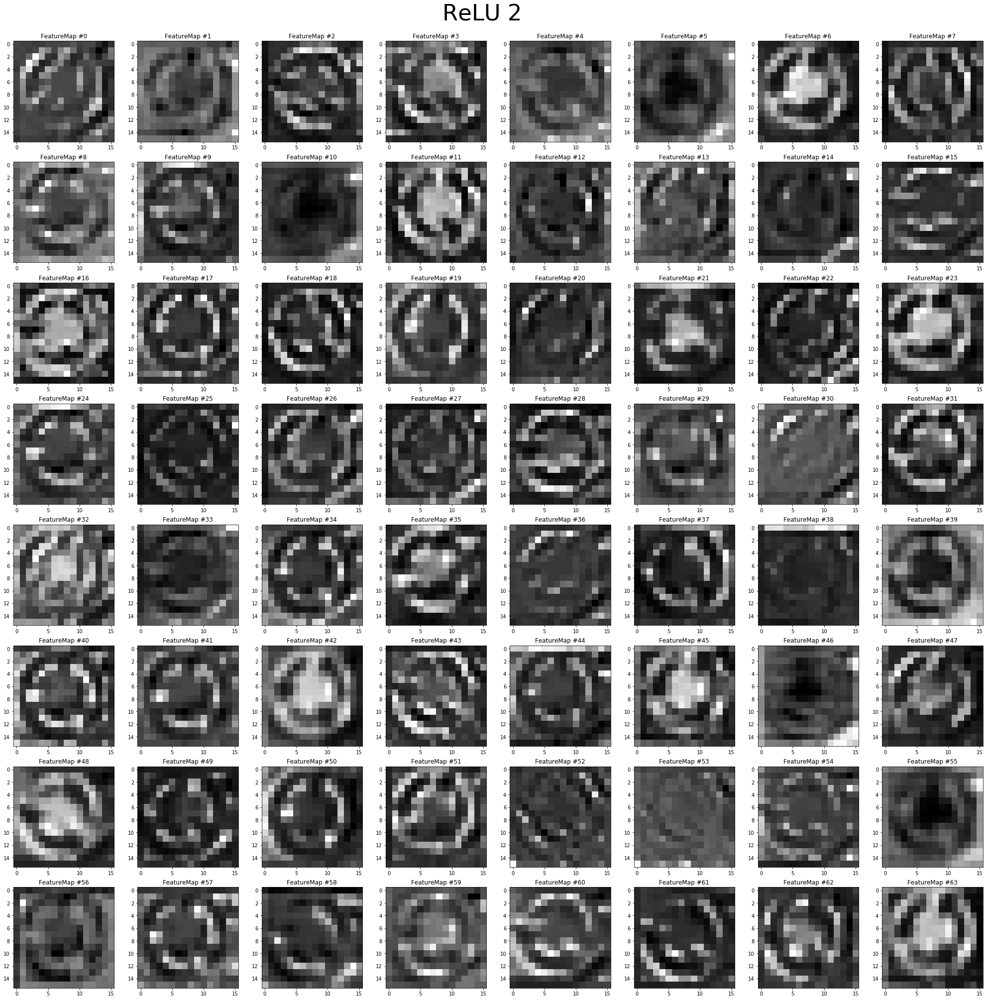

In [14]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks_97_new'))
    feed = {model.x: egs[0].reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    relu1, relu2 = sess.run([model.relu1, model.relu2], feed_dict=feed)
    
    plt.figure(figsize=(5,5))
    plt.imshow(egs[0])
    plt.title('Original Image')
    
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 1', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu1[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))
        
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 2', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu2[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))

## 2) On 60km/h from web

INFO:tensorflow:Restoring parameters from checks_97_new/tsigns.ckpt


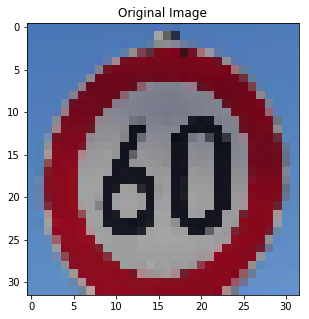

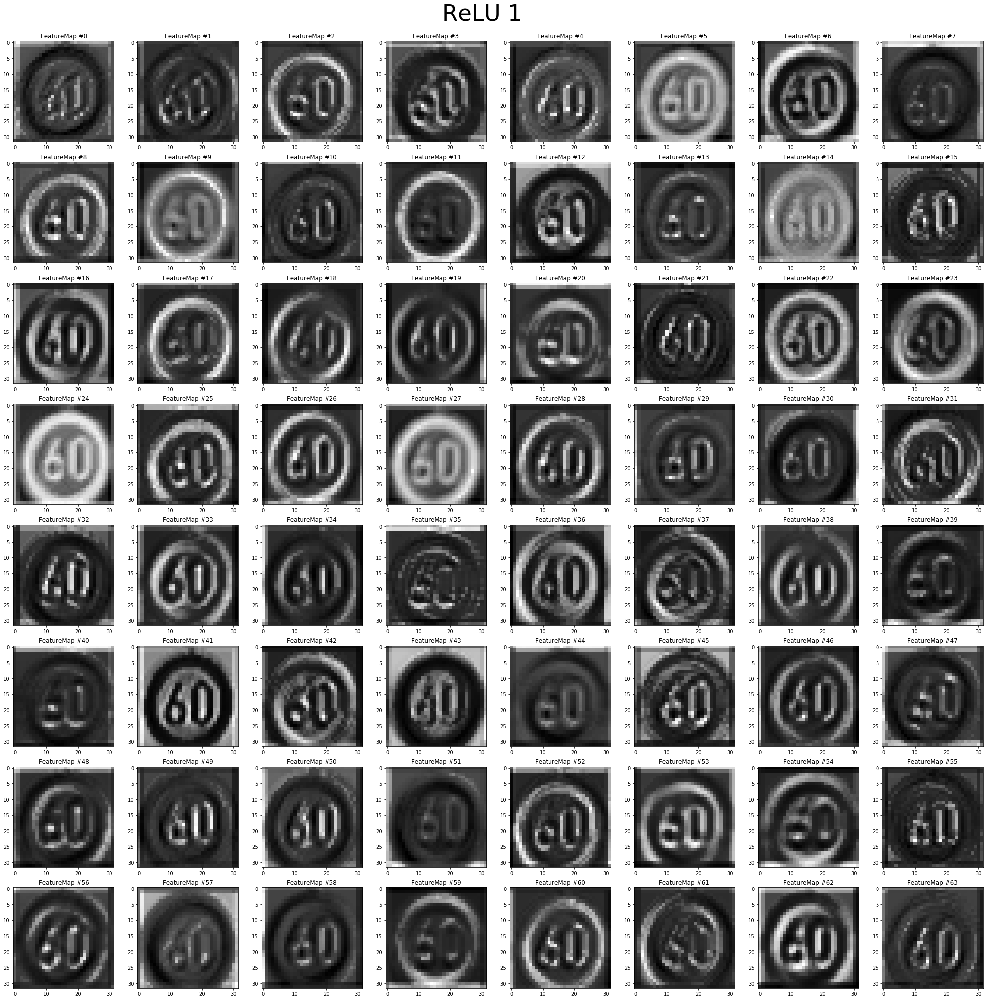

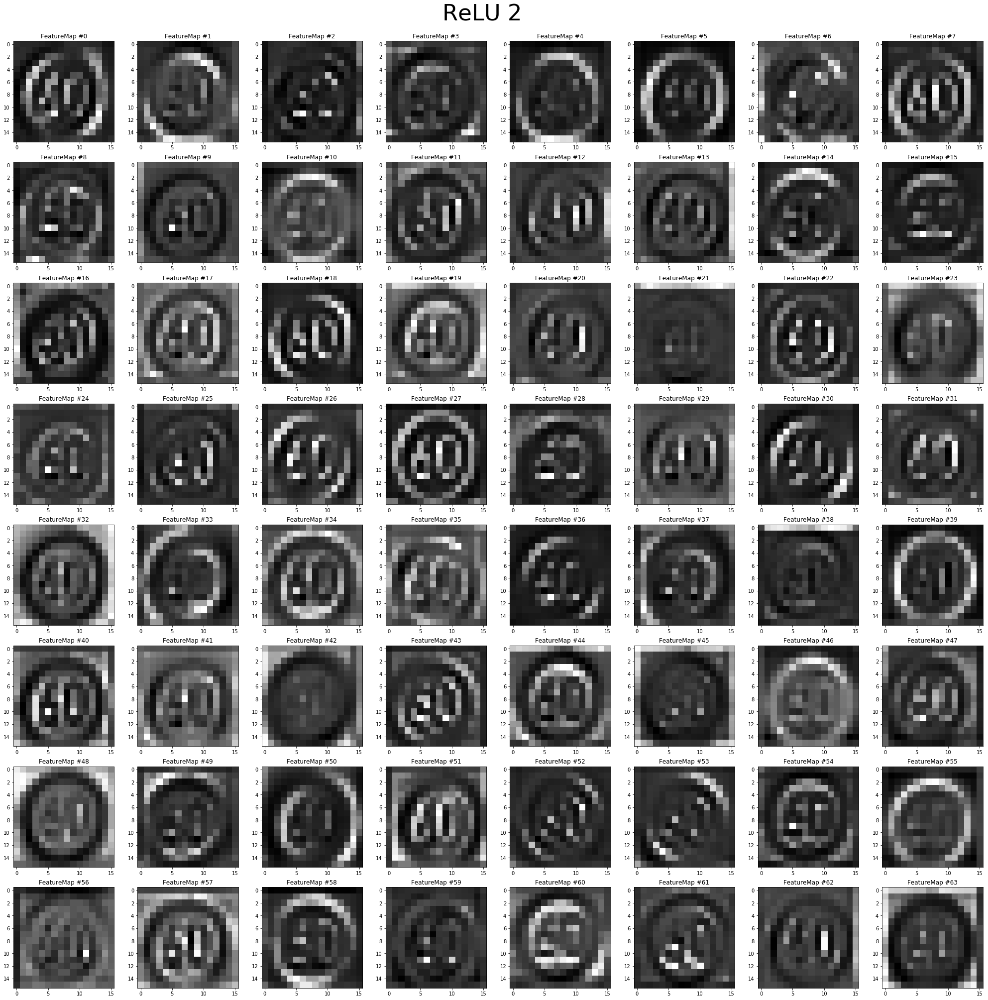

In [15]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks_97_new'))
    feed = {model.x: egs[-1].reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    relu1, relu2 = sess.run([model.relu1, model.relu2], feed_dict=feed)
    
    plt.figure(figsize=(5,5))
    plt.imshow(egs[-1])
    plt.title('Original Image')
    
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 1', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu1[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))
        
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 2', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu2[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))

## 3) On Dangerous Curve to Right from web

Keeping in mind how this sign had low precision and recall, notice how the network has trouble recognizing the relevant line that distinguishes it from other triangular street signs.

INFO:tensorflow:Restoring parameters from checks_97_new/tsigns.ckpt


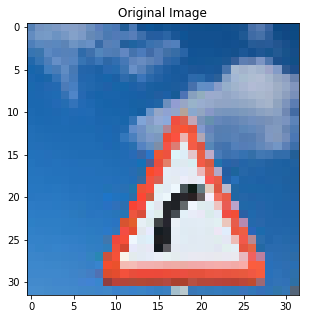

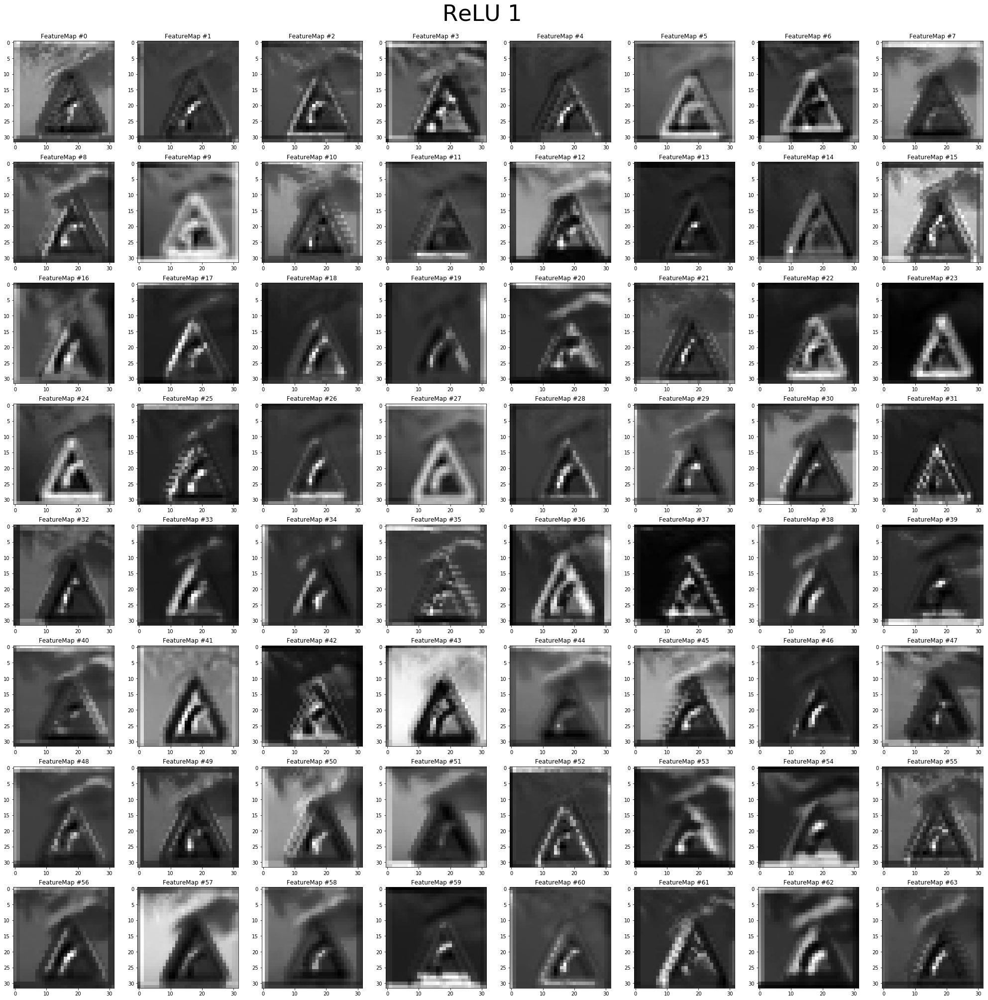

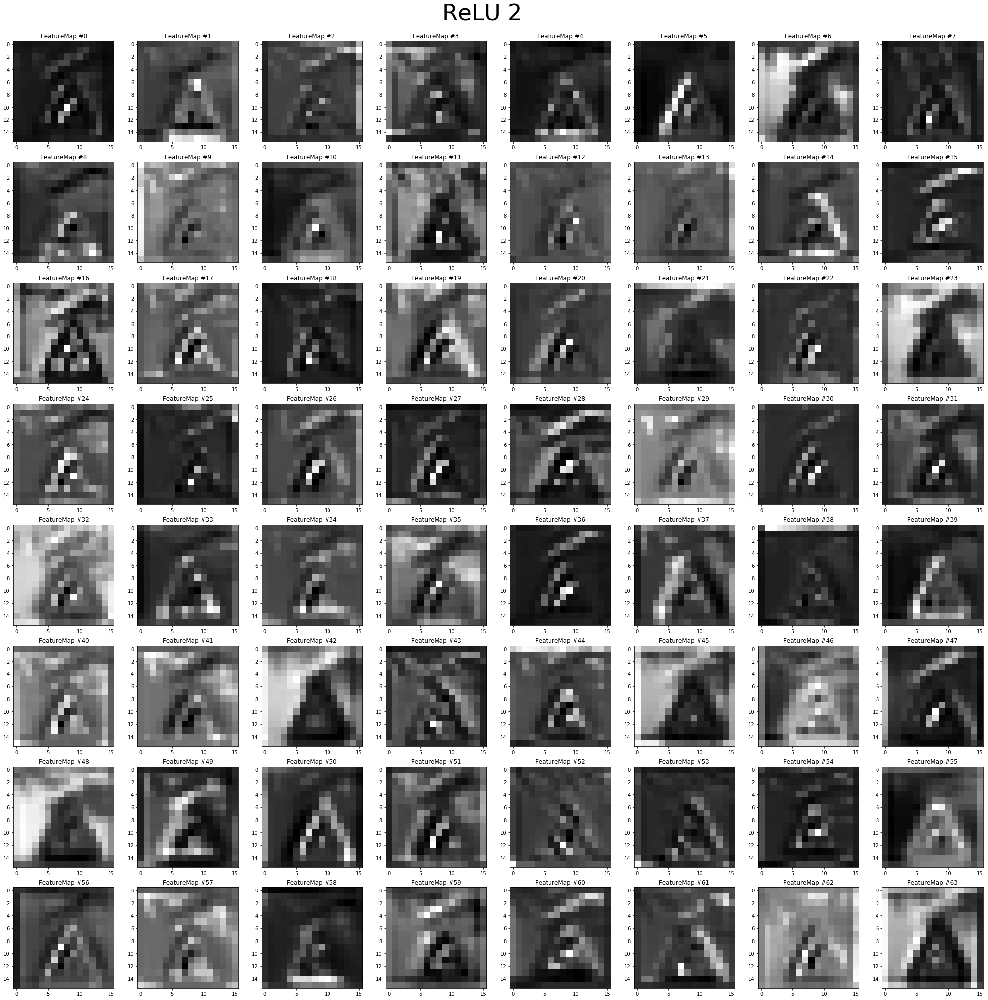

In [61]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks_97_new'))
    feed = {model.x: dang_curve_to_right2.reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    relu1, relu2 = sess.run([model.relu1, model.relu2], feed_dict=feed)
    
    plt.figure(figsize=(5,5))
    plt.imshow(dang_curve_to_right2)
    plt.title('Original Image')
    
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 1', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu1[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))
        
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 2', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu2[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))

## 4) On Van Gogh's Siesta
Because why not?

INFO:tensorflow:Restoring parameters from checks_97_new/tsigns.ckpt


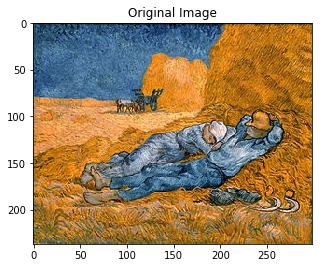

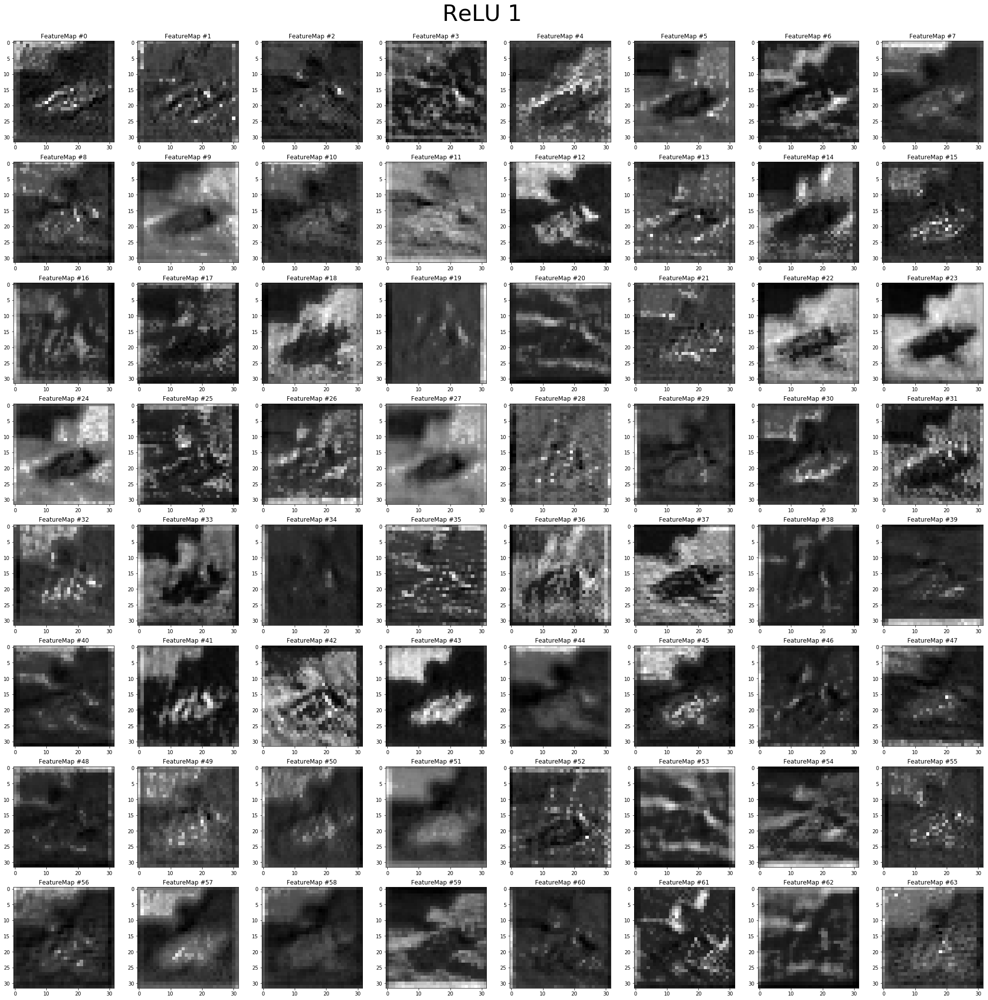

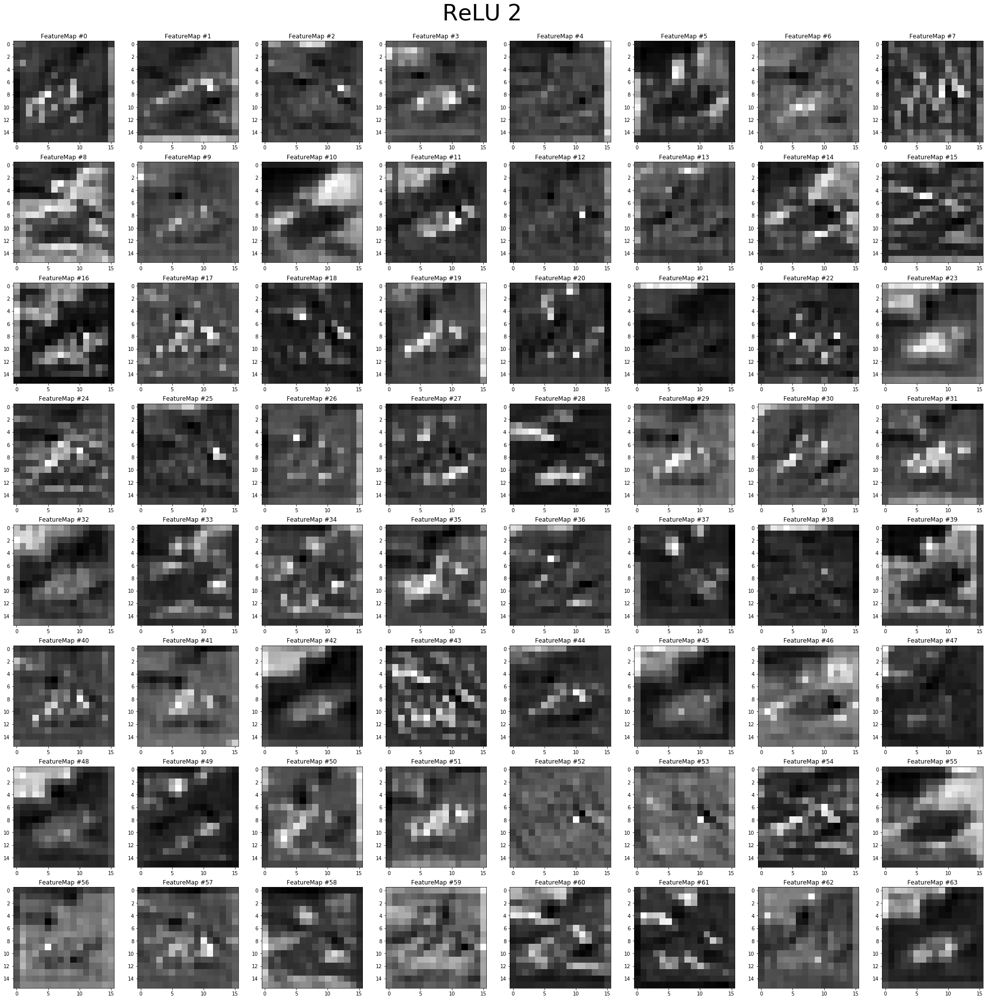

In [17]:
van_gogh = normalize(cv2.resize(mpimg.imread('traffic-signs-web/van_gogh.jpg'), dsize=(32,32)))
van_gogh_orig = mpimg.imread('traffic-signs-web/van_gogh.jpg')
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks_97_new'))
    feed = {model.x: van_gogh.reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    relu1, relu2 = sess.run([model.relu1, model.relu2], feed_dict=feed)
    
    plt.figure(figsize=(5,5))
    plt.imshow(van_gogh_orig)
    plt.title('Original Image')
    
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 1', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu1[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))
        
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 2', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu2[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))